In [ ]:
import os
import sys
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import seaborn as sns
import networkx as nx
from lifelines import CoxPHFitter, KaplanMeierFitter
from lifelines.statistics import (
    multivariate_logrank_test,
    logrank_test,
    pairwise_logrank_test,
)
from scipy.stats import chi2_contingency
from scipy.stats import spearmanr
from utils import PROJECT_ROOT
from utils import reverse_dict, preprocess_Danenberg, preprocess_Jackson, preprocess_Wang
from definitions import (
    get_node_id,
    get_node_color,
    Protein_list_Danenberg,
    Protein_list_Jackson,
    Protein_list_Wang,
    Protein_list_display_Danenberg,
    Protein_list_display_Jackson,
    Protein_list_display_Wang,
    Cell_types_displayed_Danenberg,
    Cell_types_displayed_Jackson,
    Cell_types_displayed_Wang,
    Cell_types_Wang,
    color_palette_Bigraph,
    color_palette_clinical,
    get_paired_markers,
)

sys.path.append("./..")
from cell_graph import Cell_Graph
from bi_graph import BiGraph
from population_graph import Population_Graph
from explainer import Explainer

# 0. Data Exploration and preprocessing

## Danenberg et al

In [2]:
SC_d_raw = pd.read_csv("Datasets/Danenberg_et_al/cells.csv")
survival_d_raw = pd.read_csv("Datasets/Danenberg_et_al/clinical.csv")
SC_d, SC_iv, survival_d, survival_iv = preprocess_Danenberg(SC_d_raw, survival_d_raw)

Initially,
718 patients (794 images) with cell data, 2604 patients with clinical data, 

Remove images without invasive tumor,
693 patients (749 images) with cell data, 2604 patients with clinical data, 

Remove patients with no clinical data,
683 patients (737 images) with cell data and clinical data, 

Remove images with less than 500 cells
579 patients (621 images) with more than 500 cells and clinical data, 

After splitting into discovery and validation sets,
379 patients and 404 images in the discovery set
200 patients and 217 images in the validation set


/cis/home/zwang/Projects/BiGraph4TME/Demo/utils.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  survival_dc["status"] = survival_dc["status"].map({"0:LIVING": 0, "1:DECEASED": 1})
/cis/home/zwang/Projects/BiGraph4TME/Demo/utils.py:128: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  survival_iv["status"] = survival_iv["status"].map({"0:LIVING": 0, "1:DECEASED": 1})


## Jackson et el

In [3]:
SC_ev_raw = pd.read_csv("Datasets/Jackson_et_al/cells.csv")
survival_ev_raw = pd.read_csv("Datasets/Jackson_et_al/clinical.csv")
SC_ev, survival_ev = preprocess_Jackson(SC_ev_raw, survival_ev_raw)

Initially,
285 patients, 376 images, and 855668 cells

Remove normal breast samples
281 patients, 289 images, and 855668 cells

Remove images with less than 500 cells
266 patients, 270 images, and 762616 cells


## Wang_TNBC

In [4]:
SC_ev_tnbc_raw = pd.read_csv("Datasets/Wang_TNBC/cells.csv")
survival_ev_tnbc_raw = pd.read_csv("Datasets/Wang_TNBC/clinical.csv")
SC_ev_tnbc, survival_ev_tnbc = preprocess_Wang(SC_ev_tnbc_raw, survival_ev_tnbc_raw)

Initially,
279 patients, 1855 images, and 2543175 cells

Remove images with less than 500 cells
275 patients, 1644 images, and 2466051 cells


/cis/home/zwang/Projects/BiGraph4TME/Demo/utils.py:230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SC_ev["celltypeID"] = SC_ev["Label"].map(get_node_id("Wang", "CellType"))


In [5]:
print(survival_ev_tnbc_raw[['PatientID', 'Arm', 'pCR']].drop_duplicates().value_counts(['Arm', 'pCR']))

Arm  pCR
C    RD     79
C&I  RD     71
     pCR    67
C    pCR    62
dtype: int64


# 1. Fit BiGraph model with discovery set

In [6]:
bigraph_ = BiGraph(k_patient_clustering=30)
population_graph_discovery, patient_subgroups_discovery = bigraph_.fit_transform(
    SC_d, survival_data=survival_d
)

There is a soft wl subtree kernel fitted before. We will load it directly from fitted_soft_wl_subtree.pkl
If you want to re-fit soft wl subtree kernel, please delete the file 'fitted_soft_wl_subtree.pkl'
It takes a while to load the fitted soft wl subtree kernel.
An overview of the input cellular graphs is as follows: 
	 379 unique patients.
	 32 unique cell types.
	 670335 total cells, 1768.69 cells per patient.
An overview of the identified patterns is as follows: 
	 66 discovered patterns.
Start generating population graph.
Population graph generated.
Start detecting patient subgroups.
Patient subgroups detected.
There are 7 patient subgroups, 0 ungrouped patients
Start finding characteristic patterns for each patient subgroup.
Characteristic patterns found.
Since survival data is provided, we will sort patient subgroups by survival.\But keep in mind, survival data is not touched in TME pattern discovery, patient subgroup detection, \and characteristic pattern finding.
Patient subgr

# 2. Validate BiGraph model with validation sets

## Inner-validation

In [7]:
population_graph_iv, patient_subgroups_iv, histograms_iv, Signature_iv = bigraph_.transform(
    SC_iv, survival_data=survival_iv
)

Basic data preprocessing done. An overview of the data is as follows: 
	 200 unique patients.
	 32 unique cell types.
	 345828 total cells, 1729.14 cells per patient.
Estimating TME patterns from 200 graphs, median number of nodes is 1455.5, node feature dimension is 32


Since survival data is provided, we will analyze survival of each mapped subgroup. \But keep in mind, survival data is not touched in subgroup mapping.
Survival analysis done.


## External validation

### Cell phenotyping system mapping

In [8]:

from sklearn.neighbors import NearestNeighbors
def map_cell_types(SC_d, SC_ev, paired_proteins):
    cell_types_d = SC_d["celltypeID"].values
    protein_expression_d = SC_d[[i[0] for i in paired_proteins]].values
    # normalize protein expression
    protein_expression_d = (
        protein_expression_d - np.mean(protein_expression_d, axis=0)
    ) / np.std(protein_expression_d, axis=0)
    protein_expression_ev = SC_ev[[i[1] for i in paired_proteins]].values
    # normalize protein expression
    protein_expression_ev = (
        protein_expression_ev - np.mean(protein_expression_ev, axis=0)
    ) / np.std(protein_expression_ev, axis=0)
    centroids = np.zeros((len(np.unique(cell_types_d)), len(paired_proteins)))
    for i in range(len(np.unique(cell_types_d))):
        centroids[i] = np.mean(protein_expression_d[cell_types_d == i], axis=0)
    cell_types_ev_hat = np.zeros(len(protein_expression_ev), dtype=int)
    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(centroids)
    # to avoid memory error, we split the data into chunks
    n_chunks = 100
    chunk_size = len(protein_expression_ev) // n_chunks
    for i in range(n_chunks):
        start = i * chunk_size
        end = (i + 1) * chunk_size
        _, indices = neigh.kneighbors(protein_expression_ev[start:end])
        cell_types_ev_hat[start:end] = indices.flatten()
    # the last chunk
    _, indices = neigh.kneighbors(protein_expression_ev[end:])
    cell_types_ev_hat[end:] = indices.flatten()
    SC_ev["celltypeID_original"] = SC_ev["celltypeID"]
    SC_ev["celltypeID"] = list(cell_types_ev_hat)
    return SC_ev
SC_ev = map_cell_types(
    SC_d, SC_ev, get_paired_markers(source="Danenberg", target="Jackson")
)
population_graph_ev, patient_subgroups_ev, histograms_ev, Signature_ev = bigraph_.transform(
    SC_ev, survival_data=survival_ev
)

Basic data preprocessing done. An overview of the data is as follows: 
	 266 unique patients.
	 32 unique cell types.
	 762616 total cells, 2866.9774436090224 cells per patient.


Estimating TME patterns from 266 graphs, median number of nodes is 2732.0, node feature dimension is 32
Since survival data is provided, we will analyze survival of each mapped subgroup. \But keep in mind, survival data is not touched in subgroup mapping.
Survival analysis done.


## External Validation II (TNBC patients)

### Cell Phenotyping system mapping

In [9]:
from sklearn.neighbors import NearestNeighbors
def map_cell_types(SC_d, SC_ev, paired_proteins):
    cell_types_d = SC_d["celltypeID"].values
    protein_expression_d = SC_d[[i[0] for i in paired_proteins]].values
    # normalize protein expression
    protein_expression_d = (
        protein_expression_d - np.mean(protein_expression_d, axis=0)
    ) / np.std(protein_expression_d, axis=0)
    protein_expression_ev = SC_ev[[i[1] for i in paired_proteins]].values
    # normalize protein expression
    protein_expression_ev = (
        protein_expression_ev - np.mean(protein_expression_ev, axis=0)
    ) / np.std(protein_expression_ev, axis=0)
    centroids = np.zeros((len(np.unique(cell_types_d)), len(paired_proteins)))
    for i in range(len(np.unique(cell_types_d))):
        centroids[i] = np.mean(protein_expression_d[cell_types_d == i], axis=0)
    cell_types_ev_hat = np.zeros(len(protein_expression_ev), dtype=int)
    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(centroids)
    # to avoid memory error, we split the data into chunks
    n_chunks = 100
    chunk_size = len(protein_expression_ev) // n_chunks
    for i in range(n_chunks):
        start = i * chunk_size
        end = (i + 1) * chunk_size
        _, indices = neigh.kneighbors(protein_expression_ev[start:end])
        cell_types_ev_hat[start:end] = indices.flatten()
    # the last chunk
    _, indices = neigh.kneighbors(protein_expression_ev[end:])
    cell_types_ev_hat[end:] = indices.flatten()
    SC_ev["celltypeID_original"] = SC_ev["celltypeID"]
    SC_ev["celltypeID"] = list(cell_types_ev_hat)
    return SC_ev



SC_ev_tnbc_baseline = SC_ev_tnbc[SC_ev_tnbc['BiopsyPhase'] == 'Baseline']
SC_ev_tnbc_baseline = map_cell_types(
    SC_d, SC_ev_tnbc_baseline, get_paired_markers(source="Danenberg", target="Wang")
)
population_graph_ev_tnbc_baseline, patient_subgroups_ev_tnbc_baseline, histograms_ev_tnbc_baseline, Signature_ev_tnbc_baseline = bigraph_.transform(
    SC_ev_tnbc_baseline, survival_data=None
)
SC_ev_tnbc_ot = SC_ev_tnbc[SC_ev_tnbc['BiopsyPhase'] == 'On-treatment']
SC_ev_tnbc_ot = map_cell_types(
    SC_d, SC_ev_tnbc_ot, get_paired_markers(source="Danenberg", target="Wang")
)
population_graph_ev_tnbc_ot, patient_subgroups_ev_tnbc_ot, histograms_ev_tnbc_ot, Signature_ev_tnbc_ot = bigraph_.transform(
    SC_ev_tnbc_ot, survival_data=None
)
# # population_graph_ev_tnbc_ot, patient_subgroups_ev_tnbc_ot, histograms_ev_tnbc_ot = bigraph_.transform(
# #     SC_ev_tnbc[SC_ev_tnbc['BiopsyPhase_y'] == 'On-treatment'], survival_data=None
# # )
# # population_graph_ev_tnbc_pt, patient_subgroups_ev_tnbc_pt, histograms_ev_tnbc_pt = bigraph_.transform(
# #     SC_ev_tnbc[SC_ev_tnbc['BiopsyPhase_y'] == 'Post-treatment'], survival_data=None
# # )

/tmp/ipykernel_1530049/1969848525.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SC_ev["celltypeID_original"] = SC_ev["celltypeID"]
/tmp/ipykernel_1530049/1969848525.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SC_ev["celltypeID"] = list(cell_types_ev_hat)


Basic data preprocessing done. An overview of the data is as follows: 
	 240 unique patients.
	 32 unique cell types.
	 990386 total cells, 4126.608333333334 cells per patient.
Estimating TME patterns from 240 graphs, median number of nodes is 4003.5, node feature dimension is 32


/tmp/ipykernel_1530049/1969848525.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SC_ev["celltypeID_original"] = SC_ev["celltypeID"]
/tmp/ipykernel_1530049/1969848525.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SC_ev["celltypeID"] = list(cell_types_ev_hat)


Basic data preprocessing done. An overview of the data is as follows: 
	 195 unique patients.
	 32 unique cell types.
	 682963 total cells, 3502.374358974359 cells per patient.
Estimating TME patterns from 195 graphs, median number of nodes is 3352.0, node feature dimension is 32


# 3. Reproduce results and figures
**Run section 0, 1, 2 before reproducing results**

## Fig.3 Overview of datasets

### Fig.3.a. Data partition for Danenberg et al

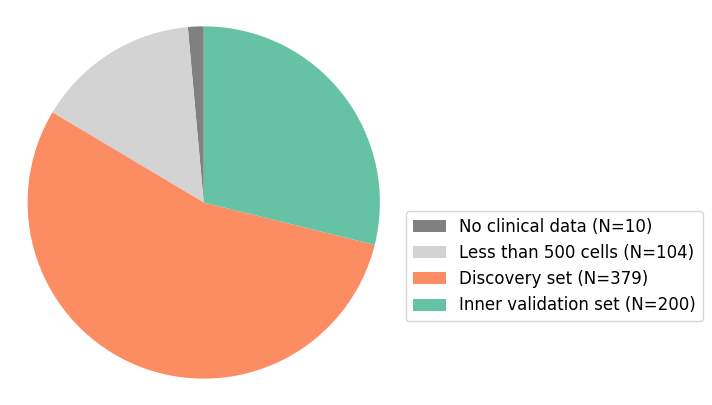

In [10]:
f, ax = plt.subplots(figsize=(5, 5), subplot_kw=dict(aspect="equal"))
labels = [
    "No clinical data (N=10)",
    "Less than 500 cells (N=104)",
    "Discovery set (N=379)",
    "Inner validation set (N=200)",
]
sizes = [10, 104, 379, 200]
colors = [
    "grey",
    "lightgrey",
    sns.color_palette("Set2")[1],
    sns.color_palette("Set2")[0],
]
pie = ax.pie(
    sizes, labels=None, startangle=90, colors=colors, wedgeprops=dict(linewidth=1)
)
ax.legend(
    labels,
    loc="upper left",
    bbox_to_anchor=(1, 0.5),
    fontsize=12,
)
# Equal aspect ratio ensures that the pie chart is circular.
plt.axis("equal")
# Show the plot
plt.show()

### Fig.3.b Data partition for Jackson et al

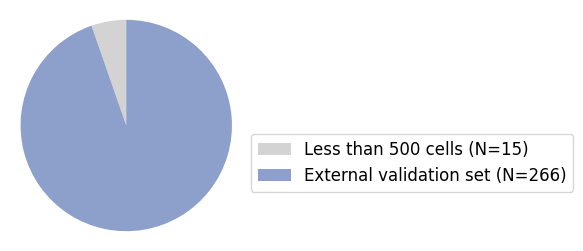

In [11]:
f, ax = plt.subplots(figsize=(3, 3), subplot_kw=dict(aspect="equal"))
labels = ["Less than 500 cells (N=15)", "External validation set (N=266)"]
sizes = [15, 266]
colors = ["lightgrey", sns.color_palette("Set2")[2]]
pie = ax.pie(
    sizes, labels=None, startangle=90, colors=colors, wedgeprops=dict(linewidth=1)
)
ax.legend(
    labels,
    loc="upper left",
    bbox_to_anchor=(1, 0.5),
    fontsize=12,
)

# Equal aspect ratio ensures that the pie chart is circular.
plt.axis("equal")
# Show the plot
plt.show()

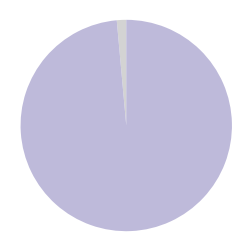

In [12]:
f, ax = plt.subplots(figsize=(3, 3), subplot_kw=dict(aspect="equal"))
labels = ["Less than 500 cells (N=4)", "External validation set II (N=275)"]
sizes = [4, 275]
colors = ["lightgrey", sns.color_palette("Set3")[2]]
pie = ax.pie(
    sizes, labels=None, startangle=90, colors=colors, wedgeprops=dict(linewidth=1)
)
# ax.legend(
#     labels,
#     loc="upper left",
#     bbox_to_anchor=(1, 0.5),
#     fontsize=12,

# )

# Equal aspect ratio ensures that the pie chart is circular.
plt.axis("equal")
# Show the plot
plt.show()

## Fig.4 Signature map and abundance

### Load Signature map and their distribution (Proportions)

In [13]:
Signatures = bigraph_.fitted_soft_wl_subtree.Signatures
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
# Proportion of each pattern presented in each patient's cellular graphs
DF_proportion = pd.DataFrame(Proportions)
DF_proportion = DF_proportion.melt(var_name="pattern_id", value_name="proportion")
DF_proportion["pattern_id"] = DF_proportion["pattern_id"].astype(str)
# Define tumor niches, immune niches, stromal niches, and interfacing niches
threshold = 0.5  # does not impact the downstream analysis, only imapct the presentation of the signature map
tumor_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 16:] > threshold, axis=1) == 0)
)[0]
immune_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) == 0)
)[0]
stromal_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) > 0)
)[0]
interacting_niche = [
    i
    for i in range(Signatures.shape[0])
    if i not in np.concatenate([tumor_niche, immune_niche, stromal_niche])
]
print("There are {} identified TME patterns.".format(Signatures.shape[0]))
print(
    "There are {} tumor niches, {} immune niches, {} stromal niches, and {} interacting niches.".format(
        len(tumor_niche), len(immune_niche), len(stromal_niche), len(interacting_niche)
    )
)
tme_pattern_orders = np.concatenate(
    [tumor_niche, immune_niche, stromal_niche, interacting_niche]
)

There are 66 identified TME patterns.
There are 37 tumor niches, 4 immune niches, 11 stromal niches, and 14 interacting niches.


S1 10
S2 6
S3 3
S4 38
S5 8
S6 1
S7 7
S7 13
S7 60


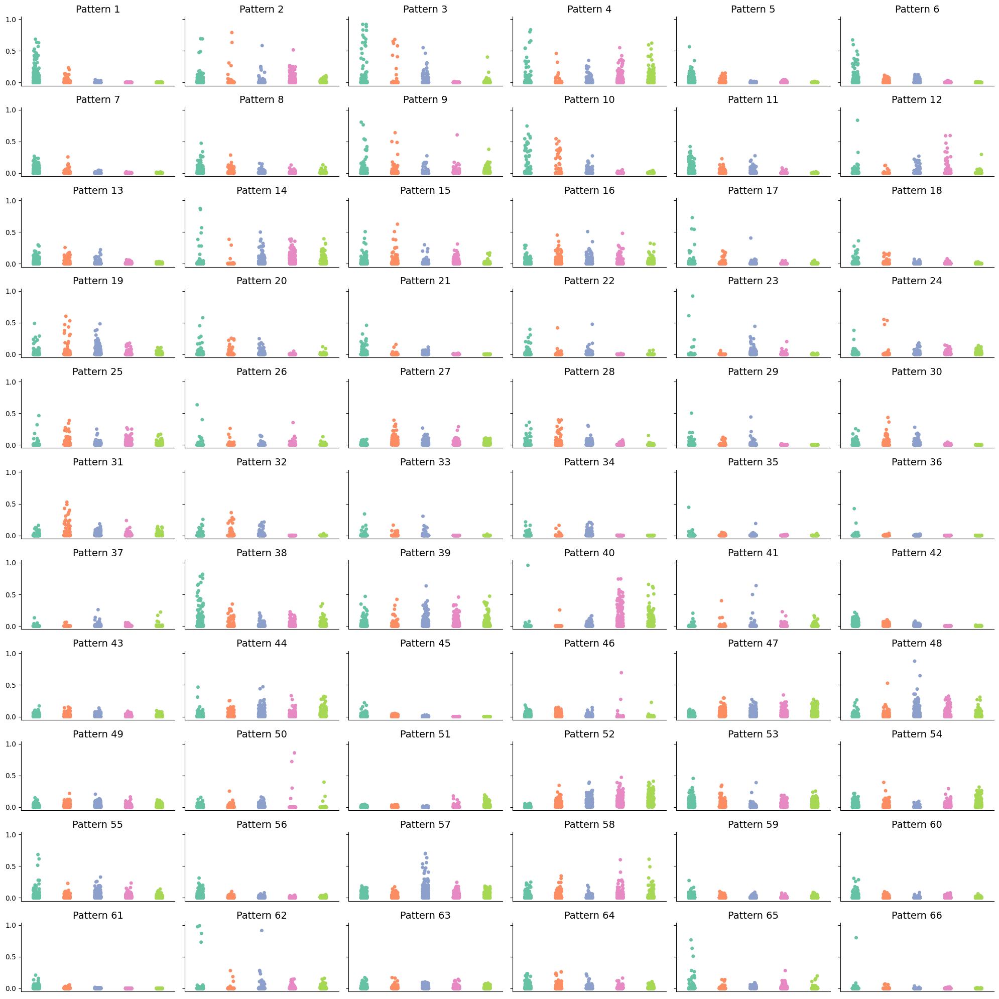

In [14]:
DF_proportion["dataset"] = "Discovery set"
Proportions_iv = histograms_iv / np.sum(histograms_iv, axis=1, keepdims=True)
DF_proportion_iv = pd.DataFrame(Proportions_iv)
DF_proportion_iv = DF_proportion_iv.melt(var_name="pattern_id", value_name="proportion")
DF_proportion_iv["pattern_id"] = DF_proportion_iv["pattern_id"].astype(str)
DF_proportion_iv["dataset"] = "Inner Validation set"
Proportions_ev = histograms_ev / np.sum(histograms_ev, axis=1, keepdims=True)
DF_proportion_ev = pd.DataFrame(Proportions_ev)
DF_proportion_ev = DF_proportion_ev.melt(var_name="pattern_id", value_name="proportion")
DF_proportion_ev["pattern_id"] = DF_proportion_ev["pattern_id"].astype(str)
DF_proportion_ev["dataset"] = "External validation set-1"
Proportions_ev_tnbc_baseline = histograms_ev_tnbc_baseline / np.sum(histograms_ev_tnbc_baseline, axis=1, keepdims=True)
DF_proportion_ev_tnbc_baseline = pd.DataFrame(Proportions_ev_tnbc_baseline)
DF_proportion_ev_tnbc_baseline = DF_proportion_ev_tnbc_baseline.melt(var_name="pattern_id", value_name="proportion")
DF_proportion_ev_tnbc_baseline["pattern_id"] = DF_proportion_ev_tnbc_baseline["pattern_id"].astype(str)
DF_proportion_ev_tnbc_baseline["dataset"] = "External validation set-2 (Pre-treatment)"
Proportions_ev_tnbc_ot = histograms_ev_tnbc_ot / np.sum(histograms_ev_tnbc_ot, axis=1, keepdims=True)
DF_proportion_ev_tnbc_ot = pd.DataFrame(Proportions_ev_tnbc_ot)
DF_proportion_ev_tnbc_ot = DF_proportion_ev_tnbc_ot.melt(var_name="pattern_id", value_name="proportion")
DF_proportion_ev_tnbc_ot["pattern_id"] = DF_proportion_ev_tnbc_ot["pattern_id"].astype(str)
DF_proportion_ev_tnbc_ot["dataset"] = "External validation set-2 (On-treatment)"
DF_proportion_all = pd.concat([DF_proportion, DF_proportion_iv, DF_proportion_ev, DF_proportion_ev_tnbc_baseline, DF_proportion_ev_tnbc_ot])
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    for pattern_index in range(len(characteristic_patterns)):
        pattern_id = characteristic_patterns[pattern_index]
        print(subgroup_id, tme_pattern_orders.tolist().index(pattern_id)+1)
f, ax = plt.subplots(11, 6, figsize=(20, 20), sharex=True, tight_layout=True, sharey=True)
for i in range(66):
    sns.stripplot(
        data=DF_proportion_all.loc[DF_proportion_all.pattern_id == str(tme_pattern_orders[i])],
        x = 'dataset',
        y = "proportion",
        palette=sns.color_palette("Set2"),
        ax=ax[i//6, i%6],
    )
    ax[i//6, i%6].spines['top'].set_visible(False)
    ax[i//6, i%6].spines['right'].set_visible(False)
    ax[i//6, i%6].set_title(f"Pattern {i+1}", fontsize=14)
    ax[i//6, i%6].set(xlabel = '', ylabel = '')
    ax[i//6, i%6].set_xlabel('')
    ax[i//6, i%6].get_xaxis().set_visible(False)



plt.show()

### Plot signature map

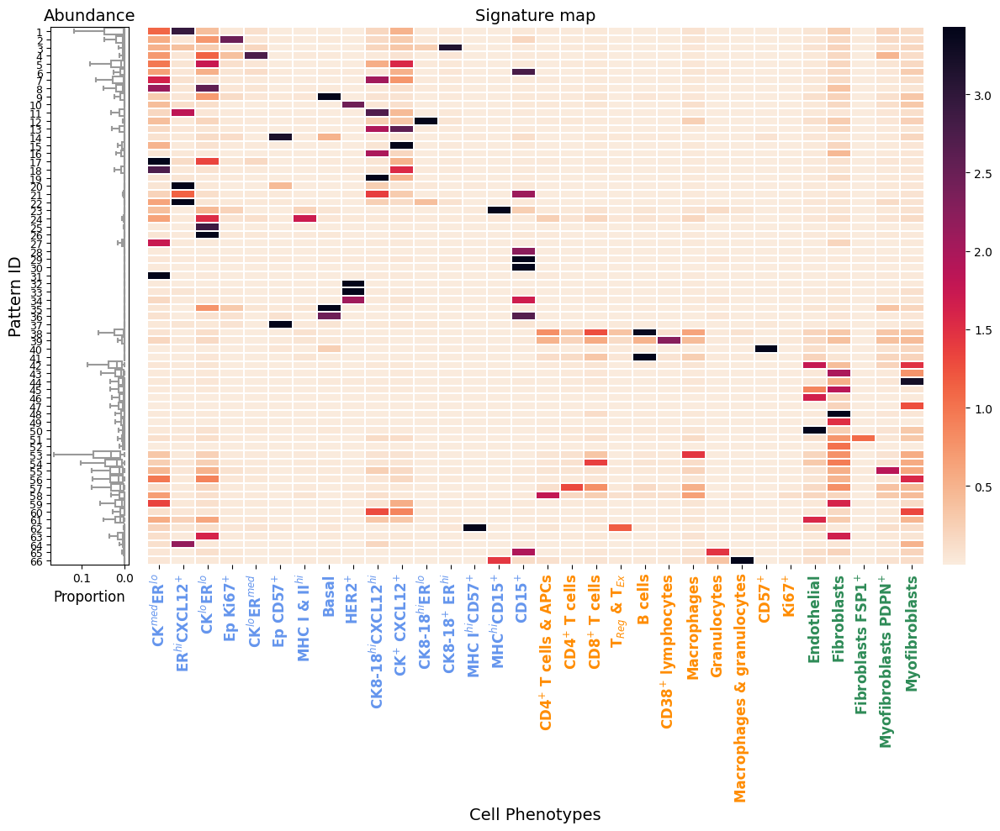

In [15]:
f, ax = plt.subplots(
    1,
    3,
    figsize=(12, 10),
    tight_layout=True,
    gridspec_kw={"width_ratios": [1, 10, 0.3]},
)

sns.heatmap(
    Signatures[tme_pattern_orders, :],
    ax=ax[1],
    cmap="rocket_r",
    linewidth=0.005,
    cbar=True,
    cbar_ax=ax[2],
    edgecolor="black",
    vmax=np.percentile(Signatures, 99),
    vmin=np.percentile(Signatures, 5),
)

ax[1].get_yaxis().set_visible(False)
ax[1].set_title("Signature map", fontsize=14)
ax[1].set_xticklabels(
    Cell_types_displayed_Danenberg, rotation=90, fontsize=12, fontweight="bold"
)
ax[1].set_xlabel("Cell Phenotypes", fontsize=14)
xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["seagreen"] * 5
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[2].get_xaxis().set_visible(False)

sns.boxplot(
    y="pattern_id",
    x="proportion",
    data=DF_proportion,
    showfliers=False,
    ax=ax[0],
    color="white",
    order=[str(i) for i in tme_pattern_orders],
    fliersize=0.5,
)
ax[0].set_xlabel("Proportion", fontsize=12)
ax[0].set_title("Abundance", fontsize=14)
ax[0].set_yticklabels([i + 1 for i in range(len(tme_pattern_orders))], fontsize=9)
ax[0].set_ylabel("Pattern ID", fontsize=14)
ax[0].invert_xaxis()
plt.show()

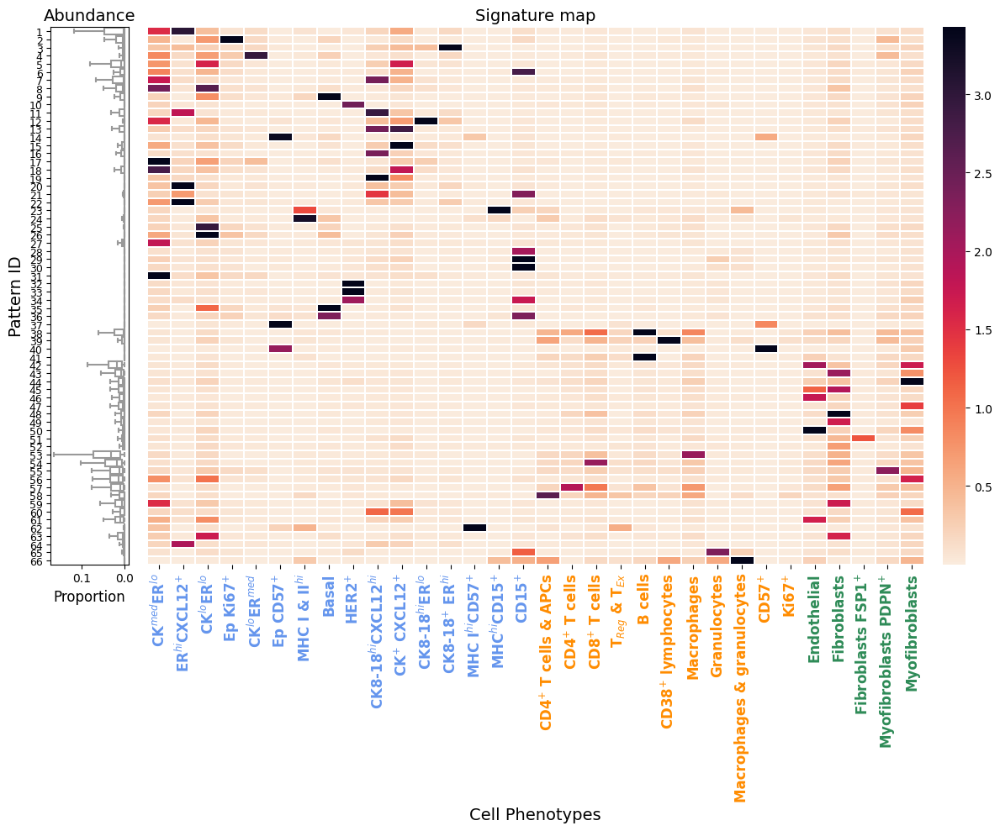

In [16]:
f, ax = plt.subplots(
    1,
    3,
    figsize=(12, 10),
    tight_layout=True,
    gridspec_kw={"width_ratios": [1, 10, 0.3]},
)

sns.heatmap(
    Signature_iv[tme_pattern_orders, :],
    ax=ax[1],
    cmap="rocket_r",
    linewidth=0.005,
    cbar=True,
    cbar_ax=ax[2],
    edgecolor="black",
    vmax=np.percentile(Signatures, 99),
    vmin=np.percentile(Signatures, 5),
)

ax[1].get_yaxis().set_visible(False)
ax[1].set_title("Signature map", fontsize=14)
ax[1].set_xticklabels(
    Cell_types_displayed_Danenberg, rotation=90, fontsize=12, fontweight="bold"
)
ax[1].set_xlabel("Cell Phenotypes", fontsize=14)
xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["seagreen"] * 5
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[2].get_xaxis().set_visible(False)

sns.boxplot(
    y="pattern_id",
    x="proportion",
    data=DF_proportion,
    showfliers=False,
    ax=ax[0],
    color="white",
    order=[str(i) for i in tme_pattern_orders],
    fliersize=0.5,
)
ax[0].set_xlabel("Proportion", fontsize=12)
ax[0].set_title("Abundance", fontsize=14)
ax[0].set_yticklabels([i + 1 for i in range(len(tme_pattern_orders))], fontsize=9)
ax[0].set_ylabel("Pattern ID", fontsize=14)
ax[0].invert_xaxis()
plt.show()

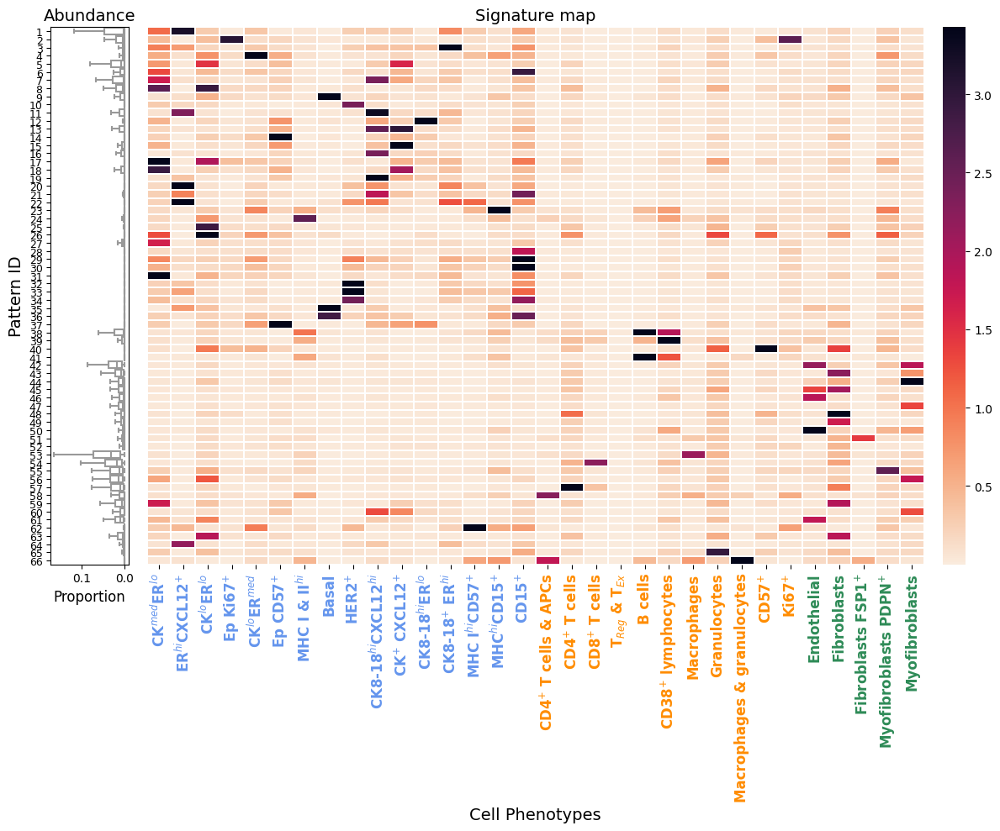

In [17]:
f, ax = plt.subplots(
    1,
    3,
    figsize=(12, 10),
    tight_layout=True,
    gridspec_kw={"width_ratios": [1, 10, 0.3]},
)

sns.heatmap(
    Signature_ev[tme_pattern_orders, :],
    ax=ax[1],
    cmap="rocket_r",
    linewidth=0.005,
    cbar=True,
    cbar_ax=ax[2],
    edgecolor="black",
    vmax=np.percentile(Signatures, 99),
    vmin=np.percentile(Signatures, 5),
)

ax[1].get_yaxis().set_visible(False)
ax[1].set_title("Signature map", fontsize=14)
ax[1].set_xticklabels(
    Cell_types_displayed_Danenberg, rotation=90, fontsize=12, fontweight="bold"
)
ax[1].set_xlabel("Cell Phenotypes", fontsize=14)
xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["seagreen"] * 5
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[2].get_xaxis().set_visible(False)

sns.boxplot(
    y="pattern_id",
    x="proportion",
    data=DF_proportion,
    showfliers=False,
    ax=ax[0],
    color="white",
    order=[str(i) for i in tme_pattern_orders],
    fliersize=0.5,
)
ax[0].set_xlabel("Proportion", fontsize=12)
ax[0].set_title("Abundance", fontsize=14)
ax[0].set_yticklabels([i + 1 for i in range(len(tme_pattern_orders))], fontsize=9)
ax[0].set_ylabel("Pattern ID", fontsize=14)
ax[0].invert_xaxis()
plt.show()

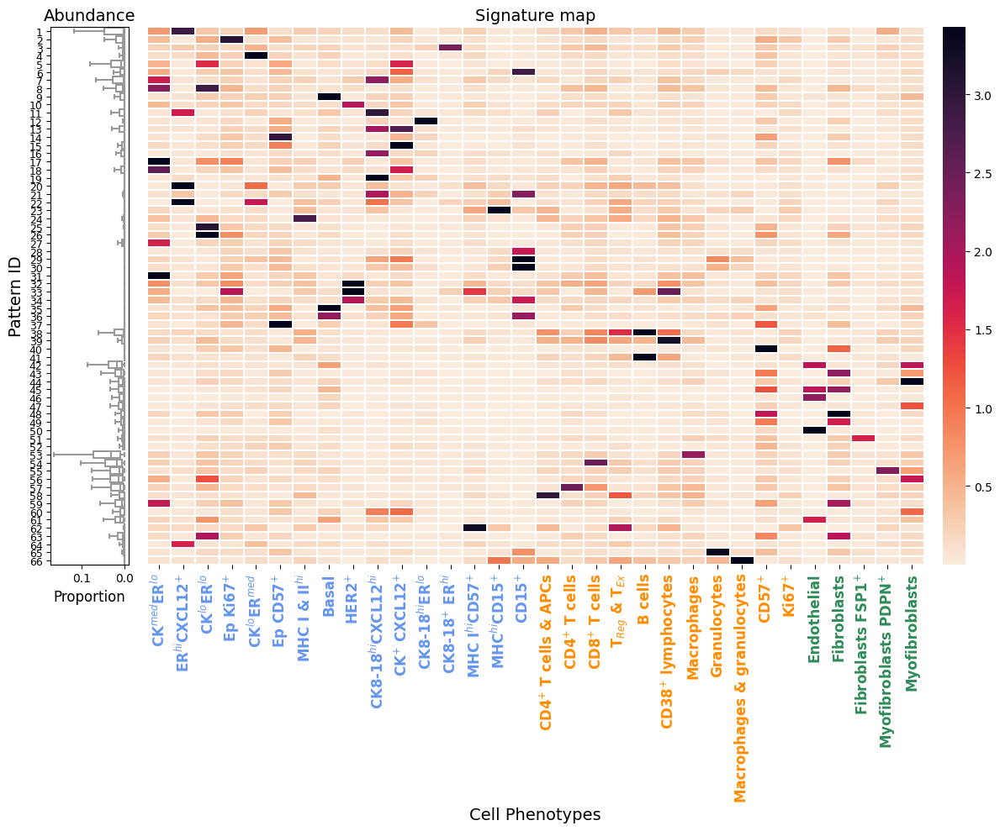

In [18]:
f, ax = plt.subplots(
    1,
    3,
    figsize=(12, 10),
    tight_layout=True,
    gridspec_kw={"width_ratios": [1, 10, 0.3]},
)

sns.heatmap(
    Signature_ev_tnbc_baseline[tme_pattern_orders, :],
    ax=ax[1],
    cmap="rocket_r",
    linewidth=0.005,
    cbar=True,
    cbar_ax=ax[2],
    edgecolor="black",
    vmax=np.percentile(Signatures, 99),
    vmin=np.percentile(Signatures, 5),
)

ax[1].get_yaxis().set_visible(False)
ax[1].set_title("Signature map", fontsize=14)
ax[1].set_xticklabels(
    Cell_types_displayed_Danenberg, rotation=90, fontsize=12, fontweight="bold"
)
ax[1].set_xlabel("Cell Phenotypes", fontsize=14)
xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["seagreen"] * 5
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[2].get_xaxis().set_visible(False)

sns.boxplot(
    y="pattern_id",
    x="proportion",
    data=DF_proportion,
    showfliers=False,
    ax=ax[0],
    color="white",
    order=[str(i) for i in tme_pattern_orders],
    fliersize=0.5,
)
ax[0].set_xlabel("Proportion", fontsize=12)
ax[0].set_title("Abundance", fontsize=14)
ax[0].set_yticklabels([i + 1 for i in range(len(tme_pattern_orders))], fontsize=9)
ax[0].set_ylabel("Pattern ID", fontsize=14)
ax[0].invert_xaxis()
plt.show()

## Fig.5 Demonstrate Inter-patient Similarities

In [20]:
Similarity_matrix = bigraph_.fitted_soft_wl_subtree.Similarity_matrix
Cellular_graphs = bigraph_.fitted_soft_wl_subtree.X
patient_ids_d = [cellular_graph[0] for cellular_graph in Cellular_graphs]
print("The shape of the similarity matrix is", Similarity_matrix.shape)
print("There are {} patients".format(len(patient_ids_d)))

The shape of the similarity matrix is (379, 379)
There are 379 patients


In [23]:
def get_pos(G):
    x = nx.get_node_attributes(G, "coorX")
    y = nx.get_node_attributes(G, "coorY")
    pos = {}
    for key, _ in x.items():
        pos[key] = (x[key], y[key])
    return pos

### Fig.5.a Template patient

The number of cells in the template patient is 2118


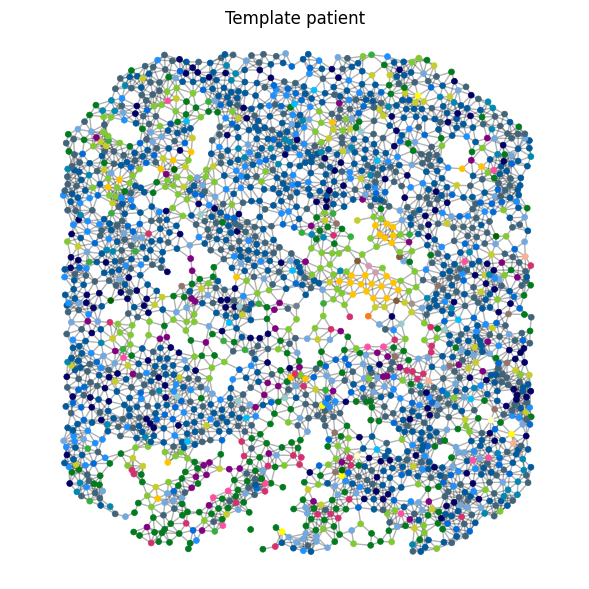

In [24]:
template_patient_id = "MB-0882"
template_image_id = 50
adj = Cellular_graphs[patient_ids_d.index(template_patient_id)][
    1
]  # The adjacency matrix of the template patient
cells_template = SC_d[SC_d["imageID"] == template_image_id].reset_index(drop=True)
assert len(cells_template) == adj.shape[0]
print("The number of cells in the template patient is", len(cells_template))
# For visualization propose, we set the diagonal of the adjacency matrix to be 0
np.fill_diagonal(adj, 0)  # Remove self loops
# For visualization purpose, we only show edges with a weight higher than 0.01
adj[adj < 0.01] = 0
G = nx.from_numpy_array(adj)
nx.set_node_attributes(G, cells_template["coorX"], "coorX")
nx.set_node_attributes(G, cells_template["coorY"], "coorY")
nx.set_node_attributes(G, cells_template["meta_description"], "meta_description")
f, ax = plt.subplots(
    1,
    1,
    figsize=(6, 6),
    tight_layout=True,
)
cell_color_dict = get_node_color("Danenberg", "CellType")
nx.draw_networkx_nodes(
    G,
    get_pos(G),
    node_size=18,
    node_color=[
        cell_color_dict[cell_type]
        for cell_type in list(nx.get_node_attributes(G, "meta_description").values())
    ],
    # edgecolors="black",
    linewidths=0.5,
    ax=ax,
)
nx.draw_networkx_edges(G, get_pos(G), ax=ax, alpha=0.3, width=1)
ax.set(
    title="Template patient",
    xlim=(
        (max(cells_template["coorX"]) - min(cells_template["coorX"])) / 2 - 350,
        (max(cells_template["coorX"]) - min(cells_template["coorX"])) / 2 + 350,
    ),
    ylim=(
        (max(cells_template["coorY"]) - min(cells_template["coorY"])) / 2 - 350,
        (max(cells_template["coorY"]) - min(cells_template["coorY"])) / 2 + 350,
    ),
)
ax.set_axis_off()

### Fig.5.b sorted similarity to template patient

Patient ID: MB-0598 Similarity: 0.9844688715760685 Rank: 1
Patient ID: MB-0354 Similarity: 0.7850040089449906 Rank: 17
Patient ID: MB-0083 Similarity: 0.13601860839247212 Rank: 72


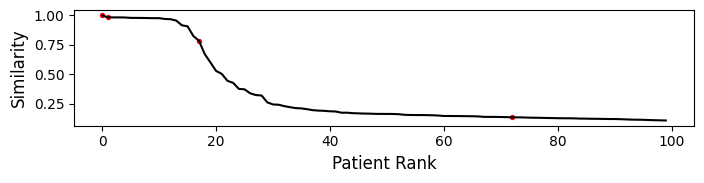

In [25]:
template_patient_index = patient_ids_d.index(
    template_patient_id
)  # The index of the template patient in the similarity matrix
Similarities_sorted = np.sort(Similarity_matrix[template_patient_index, :])[
    ::-1
]  # Sort the similarities in descending order
Representative_patient_ids = ["MB-0262", "MB-0356", "MB-0290"]
f, ax = plt.subplots(figsize=(8, 1.5))
ax.plot(Similarities_sorted[:100], color="k")
# TEMPLATE PATIENT
ax.scatter(0, Similarities_sorted[0], color="red", s=8)
# REPRESENTATIVE PATIENTS
Representative_patient_indices = (
    patient_ids_d.index(Representative_patient_ids[0]),
    patient_ids_d.index(Representative_patient_ids[1]),
    patient_ids_d.index(Representative_patient_ids[2]),
)
Patient_indices_sorted = np.argsort(Similarity_matrix[template_patient_index, :])[::-1]
Representative_patient_rankings = [
    list(Patient_indices_sorted).index(i) for i in Representative_patient_indices
]
for indice in Representative_patient_rankings:
    ax.scatter(indice, Similarities_sorted[indice], color="red", s=8)
    print(
        "Patient ID:",
        patient_ids_d[indice],
        "Similarity:",
        Similarities_sorted[indice],
        "Rank:",
        indice,
    )
ax.set_xlabel("Patient Rank", fontsize=12)
ax.set_ylabel("Similarity", fontsize=12)
plt.show()

### Fig.5.c A representative example


The image ID of the patient MB-0262 is 145
The number of cells in the template patient is 1652


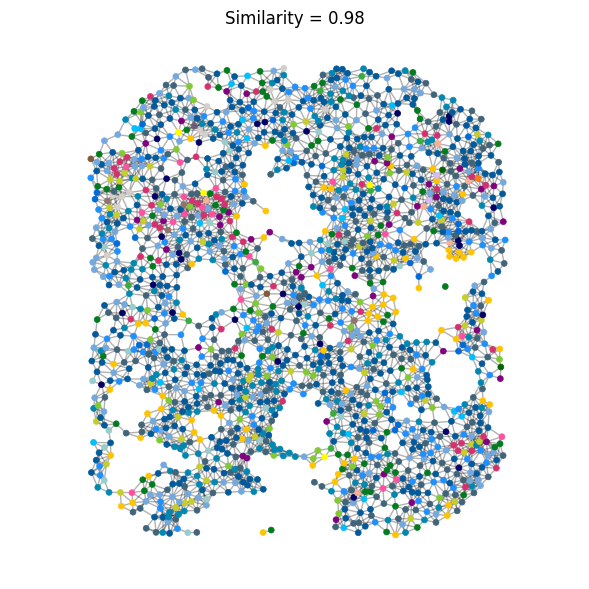

In [26]:
patient_id = "MB-0262"
image_id = SC_d[SC_d["patientID"] == patient_id]["imageID"].values[0]
print("The image ID of the patient", patient_id, "is", image_id)
adj = Cellular_graphs[patient_ids_d.index(patient_id)][
    1
]  # The adjacency matrix of the template patient
cells_ = SC_d[SC_d["imageID"] == image_id].reset_index(drop=True)
assert len(cells_) == adj.shape[0]
print("The number of cells in the template patient is", len(cells_))
np.fill_diagonal(adj, 0)  # Remove self loops
adj[adj < 0.01] = 0
G = nx.from_numpy_array(adj)
nx.set_node_attributes(G, cells_["coorX"], "coorX")
nx.set_node_attributes(G, cells_["coorY"], "coorY")
nx.set_node_attributes(G, cells_["meta_description"], "meta_description")
f, ax = plt.subplots(
    1,
    1,
    figsize=(6, 6),
    tight_layout=True,
)
cell_color_dict = get_node_color("Danenberg", "CellType")
nx.draw_networkx_nodes(
    G,
    get_pos(G),
    node_size=18,
    node_color=[
        cell_color_dict[cell_type]
        for cell_type in list(nx.get_node_attributes(G, "meta_description").values())
    ],
    # edgecolors="black",
    linewidths=0.5,
    ax=ax,
)
nx.draw_networkx_edges(G, get_pos(G), ax=ax, alpha=0.3, width=1)
ax.set(
    title="Similarity = {:.2f}".format(
        Similarity_matrix[template_patient_index, patient_ids_d.index(patient_id)]
    ),
    xlim=(
        (max(cells_["coorX"]) - min(cells_["coorX"])) / 2 - 350,
        (max(cells_["coorX"]) - min(cells_["coorX"])) / 2 + 350,
    ),
    ylim=(
        (max(cells_["coorY"]) - min(cells_["coorY"])) / 2 - 350,
        (max(cells_["coorY"]) - min(cells_["coorY"])) / 2 + 350,
    ),
)
ax.set_axis_off()

### Fig.5.d A representative example

The image ID of the patient MB-0356 is 41
The number of cells in the template patient is 1244


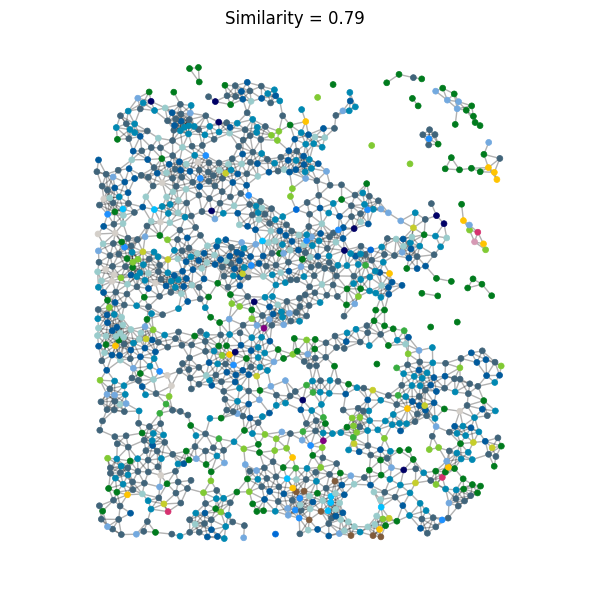

In [27]:
patient_id = "MB-0356"
image_id = SC_d[SC_d["patientID"] == patient_id]["imageID"].values[0]
print("The image ID of the patient", patient_id, "is", image_id)
adj = Cellular_graphs[patient_ids_d.index(patient_id)][
    1
]  # The adjacency matrix of the template patient
cells_ = SC_d[SC_d["imageID"] == image_id].reset_index(drop=True)
assert len(cells_) == adj.shape[0]
print("The number of cells in the template patient is", len(cells_))
np.fill_diagonal(adj, 0)  # Remove self loops
adj[adj < 0.01] = 0
G = nx.from_numpy_array(adj)
nx.set_node_attributes(G, cells_["coorX"], "coorX")
nx.set_node_attributes(G, cells_["coorY"], "coorY")
nx.set_node_attributes(G, cells_["meta_description"], "meta_description")
f, ax = plt.subplots(
    1,
    1,
    figsize=(6, 6),
    tight_layout=True,
)
cell_color_dict = get_node_color("Danenberg", "CellType")
nx.draw_networkx_nodes(
    G,
    get_pos(G),
    node_size=18,
    node_color=[
        cell_color_dict[cell_type]
        for cell_type in list(nx.get_node_attributes(G, "meta_description").values())
    ],
    # edgecolors="black",
    linewidths=0.5,
    ax=ax,
)
nx.draw_networkx_edges(G, get_pos(G), ax=ax, alpha=0.3, width=1)
ax.set(
    title="Similarity = {:.2f}".format(
        Similarity_matrix[template_patient_index, patient_ids_d.index(patient_id)]
    ),
    xlim=(
        (max(cells_["coorX"]) - min(cells_["coorX"])) / 2 - 350,
        (max(cells_["coorX"]) - min(cells_["coorX"])) / 2 + 350,
    ),
    ylim=(
        (max(cells_["coorY"]) - min(cells_["coorY"])) / 2 - 350,
        (max(cells_["coorY"]) - min(cells_["coorY"])) / 2 + 350,
    ),
)
ax.set_axis_off()

### Fig.5.e A Representative Example

The image ID of the patient MB-0290 is 199
The number of cells in the template patient is 1348


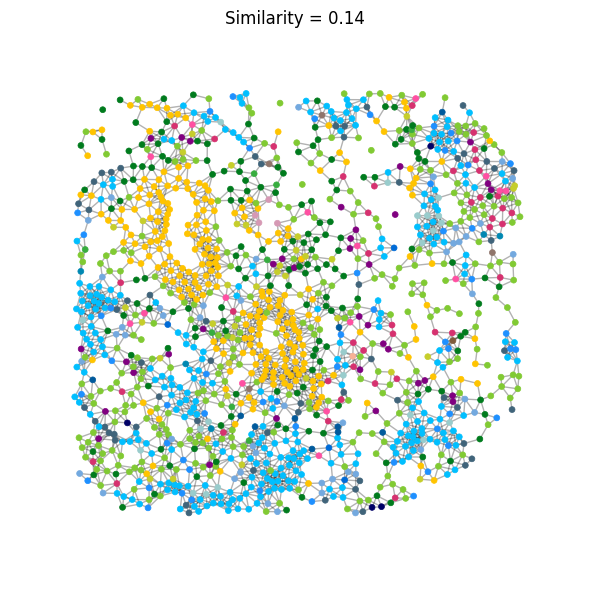

In [28]:
patient_id = "MB-0290"
image_id = SC_d[SC_d["patientID"] == patient_id]["imageID"].values[0]
print("The image ID of the patient", patient_id, "is", image_id)
adj = Cellular_graphs[patient_ids_d.index(patient_id)][
    1
]  # The adjacency matrix of the template patient
cells_ = SC_d[SC_d["imageID"] == image_id].reset_index(drop=True)
assert len(cells_) == adj.shape[0]
print("The number of cells in the template patient is", len(cells_))
np.fill_diagonal(adj, 0)  # Remove self loops
adj[adj < 0.01] = 0
G = nx.from_numpy_array(adj)
nx.set_node_attributes(G, cells_["coorX"], "coorX")
nx.set_node_attributes(G, cells_["coorY"], "coorY")
nx.set_node_attributes(G, cells_["meta_description"], "meta_description")
f, ax = plt.subplots(
    1,
    1,
    figsize=(6, 6),
    tight_layout=True,
)
cell_color_dict = get_node_color("Danenberg", "CellType")
nx.draw_networkx_nodes(
    G,
    get_pos(G),
    node_size=18,
    node_color=[
        cell_color_dict[cell_type]
        for cell_type in list(nx.get_node_attributes(G, "meta_description").values())
    ],
    # edgecolors="black",
    linewidths=0.5,
    ax=ax,
)
nx.draw_networkx_edges(G, get_pos(G), ax=ax, alpha=0.3, width=1)
ax.set(
    title="Similarity = {:.2f}".format(
        Similarity_matrix[template_patient_index, patient_ids_d.index(patient_id)]
    ),
    xlim=(
        (max(cells_["coorX"]) - min(cells_["coorX"])) / 2 - 350,
        (max(cells_["coorX"]) - min(cells_["coorX"])) / 2 + 350,
    ),
    ylim=(
        (max(cells_["coorY"]) - min(cells_["coorY"])) / 2 - 350,
        (max(cells_["coorY"]) - min(cells_["coorY"])) / 2 + 350,
    ),
)
ax.set_axis_off()

## Fig.6 Population graph and patient subgroups

In [22]:
patient_ids_discovery = list(SC_d["patientID"].unique())
subgroup_ids_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
subgroup_ids_discovery[:] = "Unclassified"
for i in range(len(patient_subgroups_discovery)):
    subgroup = patient_subgroups_discovery[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_discovery[np.isin(patient_ids_discovery, patient_ids)] = subgroup_id

### Fig.6.a Visualize population graph painted with patient subgroup ids

In [11]:
color_palette_Bigraph = {
    "Unclassified": "white",
    "S1": sns.color_palette("tab10")[0],
    "S2": sns.color_palette("tab10")[1],
    "S3": sns.color_palette("tab10")[2],
    "S4": sns.color_palette("tab10")[3],
    "S5": sns.color_palette("tab10")[4],
    "S6": sns.color_palette("tab10")[5],
    "S7": sns.color_palette("tab10")[6],
    "S8": sns.color_palette("tab10")[7],
    "S9": sns.color_palette("tab10")[8],
    "S10": sns.color_palette("tab10")[9],
}

Initialized Population_Graph, k_clustering =  20 , k_estimate =  3 , resolution =  1.0 , size_smallest_cluster =  10 , seed =  1


[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')]]

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)
/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


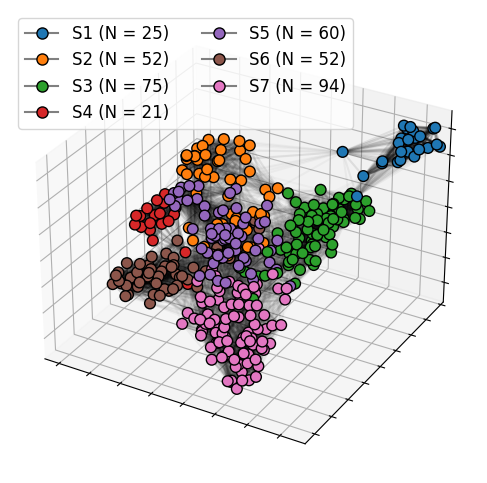

In [59]:
# For visualization purpose, we make nodes distant from each other
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    bigraph_.Similarity_matrix, patient_ids_discovery
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i] for i in subgroup_ids_discovery],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_discovery == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_discovery == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_discovery:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_discovery == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=12, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

### Fig.6.b Plot Survival curves of patient subgroups

Patient subgroup S1: N = 26, HR = 2.43 (1.43-4.11), p = 9.53e-04
Patient subgroup S2: N = 48, HR = 1.67 (1.06-2.65), p = 2.84e-02
Patient subgroup S3: N = 23, HR = 1.20 (0.59-2.45), p = 6.19e-01
Patient subgroup S4: N = 73, HR = 1.15 (0.76-1.75), p = 5.15e-01
Patient subgroup S5: N = 61, HR = 0.97 (0.61-1.53), p = 8.87e-01
Patient subgroup S6: N = 51, HR = 0.62 (0.33-1.14), p = 1.24e-01
Patient subgroup S7: N = 97, HR = 0.51 (0.32-0.82), p = 5.38e-03


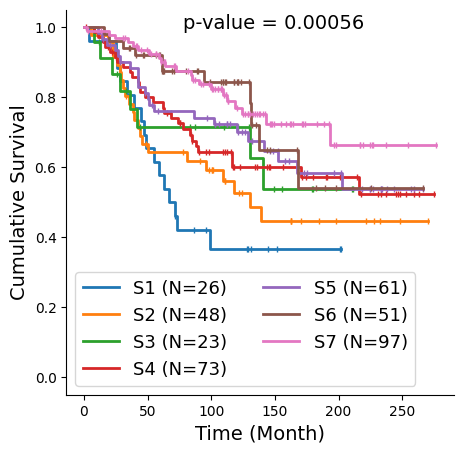

In [23]:
for i in range(len(patient_subgroups_discovery)):
    print(
        "Patient subgroup {}: N = {}, HR = {:.2f} ({:.2f}-{:.2f}), p = {:.2e}".format(
            patient_subgroups_discovery[i]["subgroup_id"],
            len(patient_subgroups_discovery[i]["patient_ids"]),
            patient_subgroups_discovery[i]["hr"],
            patient_subgroups_discovery[i]["hr_lower"],
            patient_subgroups_discovery[i]["hr_upper"],
            patient_subgroups_discovery[i]["p"],
        )
    )

lengths_discovery = [
    survival_d.loc[survival_d["patientID"] == i, "time"].values[0]
    for i in patient_ids_discovery
]
statuses_discovery = [
    (survival_d.loc[survival_d["patientID"] == i, "status"].values[0])
    for i in patient_ids_discovery
]
kmf = KaplanMeierFitter()
f, ax = plt.subplots(figsize=(5, 5))
for subgroup in patient_subgroups_discovery:
    subgroup_id = subgroup["subgroup_id"]
    length_A, event_observed_A = (
        np.array(lengths_discovery)[subgroup_ids_discovery == subgroup_id],
        np.array(statuses_discovery)[subgroup_ids_discovery == subgroup_id],
    )
    label = "{} (N={})".format(
        subgroup["subgroup_id"], np.sum(subgroup_ids_discovery == subgroup_id)
    )
    kmf.fit(length_A, event_observed_A, label=label)
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        color=color_palette_Bigraph[subgroup_id],
        show_censors=True,
        linewidth=2,
        censor_styles={"ms": 5, "marker": "|"},
    )
log_rank_test = multivariate_logrank_test(
    np.array(lengths_discovery)[subgroup_ids_discovery != 0],
    np.array(subgroup_ids_discovery)[subgroup_ids_discovery != 0],
    np.array(statuses_discovery)[subgroup_ids_discovery != 0],
)
p_value = log_rank_test.p_value
ax.legend(ncol=2, fontsize=13)
ax.text(
    x=0.3,
    y=0.95,
    s="p-value = {:.5f}".format(p_value),
    fontsize=14,
    transform=ax.transAxes,
)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
sns.despine()

#### Fig.6.b (1) Survival curves of patient subgroups in each clinical subgroup

In [44]:
patient_ids_discovery = list(SC_d["patientID"].unique())
subgroup_ids_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
subgroup_ids_discovery[:] = "Unclassified"
for i in range(len(patient_subgroups_discovery)):
    subgroup = patient_subgroups_discovery[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_discovery[np.isin(patient_ids_discovery, patient_ids)] = subgroup_id
clinical_subtypes_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
clinical_subtypes_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    er = survival_d.loc[survival_d["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_d.loc[survival_d["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_d.loc[survival_d["patientID"] == patient_id, "HER2 Status"].values[
        0
    ]
    if her2 == "Positive":
        clinical_subtypes_discovery[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_discovery),
        np.sum(clinical_subtypes_discovery == "Unknown"),
        np.sum(clinical_subtypes_discovery == "HER2+"),
        np.sum(clinical_subtypes_discovery == "HR+/HER2-"),
        np.sum(clinical_subtypes_discovery == "TNBC"),
    )
)

stages_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
stages_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    stage = survival_d.loc[survival_d["patientID"] == patient_id, "Tumor Stage"].values[
        0
    ]
    if stage == 1.0:
        stages_discovery[i] = "Stage I"
    elif stage == 2.0:
        stages_discovery[i] = "Stage II"
    elif stage == 3.0:
        stages_discovery[i] = "Stage III"
    elif stage == 4.0:
        stages_discovery[i] = "Stage IV"
print(
    "{} patients in total, {} Unkonw, {} Stage I, {} Stage II, {} Stage III, {} Stage IV".format(
        len(stages_discovery),
        np.sum(stages_discovery == "Unknown"),
        np.sum(stages_discovery == "Stage I"),
        np.sum(stages_discovery == "Stage II"),
        np.sum(stages_discovery == "Stage III"),
        np.sum(stages_discovery == "Stage IV"),
    )
)

grades_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
grades_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    grade = survival_d.loc[survival_d["patientID"] == patient_id, "Grade"].values[0]
    if grade == 1.0:
        grades_discovery[i] = "Grade 1"
    elif grade == 2.0:
        grades_discovery[i] = "Grade 2"
    elif grade == 3.0:
        grades_discovery[i] = "Grade 3"

print(
    "{} patients in total, {} Unkonw, {} Grade 1, {} Grade 2, {} Grade 3".format(
        len(grades_discovery),
        np.sum(grades_discovery == "Unknown"),
        np.sum(grades_discovery == "Grade 1"),
        np.sum(grades_discovery == "Grade 2"),
        np.sum(grades_discovery == "Grade 3"),
    )
)

positive_lymph = np.zeros(len(patient_ids_discovery), dtype=object)
positive_lymph[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    lymph = survival_d.loc[
        survival_d["patientID"] == patient_id, "LymphNodesOrdinal"
    ].values[0]
    positive_lymph[i] = lymph

print(
    "{} patients in total, {} Unkonw, {} 0, {} 1, {} 2-3, {} 4-7, {} 7+".format(
        len(positive_lymph),
        np.sum(positive_lymph == "Unknown"),
        np.sum(positive_lymph == "0"),
        np.sum(positive_lymph == "1"),
        np.sum(positive_lymph == "2-3"),
        np.sum(positive_lymph == "4-7"),
        np.sum(positive_lymph == "7+"),
    )
)

ages_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
ages_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    age = survival_d.loc[
        survival_d["patientID"] == patient_id, "Age at Diagnosis"
    ].values[0]
    if age < 50:
        ages_discovery[i] = "<50"
    elif age >= 50 and age <= 70:
        ages_discovery[i] = "50-70"
    elif age > 70:
        ages_discovery[i] = ">70"
print(
    "{} patients in total, {} Unkonw, {} <50, {} 50-70, {} >70".format(
        len(ages_discovery),
        np.sum(ages_discovery == "Unknown"),
        np.sum(ages_discovery == "<50"),
        np.sum(ages_discovery == "50-70"),
        np.sum(ages_discovery == ">70"),
    )
)

379 patients in total, 54 Unkonw, 32 HER2+, 243 HR+/HER2-, 50 TNBC
379 patients in total, 66 Unkonw, 92 Stage I, 190 Stage II, 27 Stage III, 4 Stage IV
379 patients in total, 7 Unkonw, 35 Grade 1, 147 Grade 2, 190 Grade 3
379 patients in total, 0 Unkonw, 176 0, 79 1, 57 2-3, 37 4-7, 30 7+
379 patients in total, 54 Unkonw, 64 <50, 171 50-70, 90 >70


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


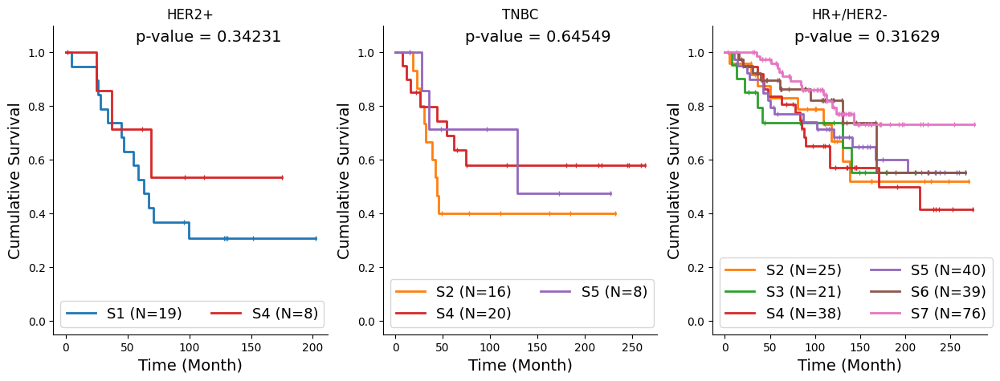

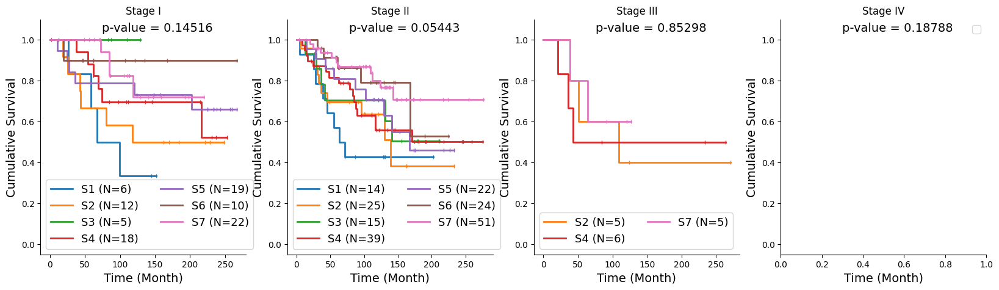

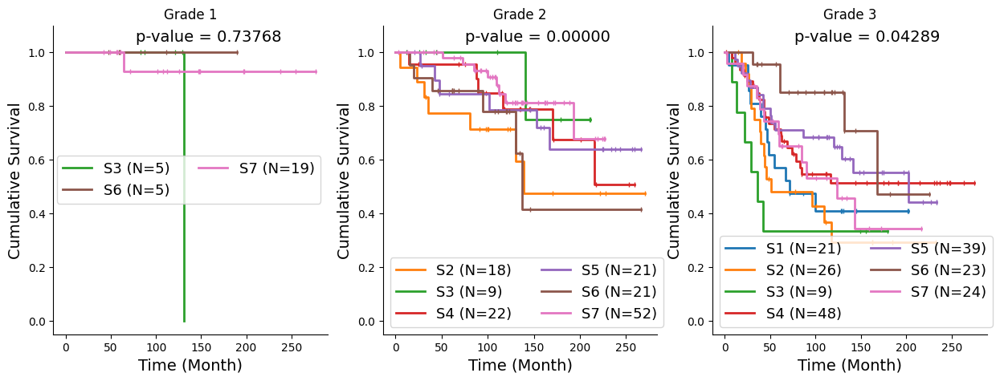

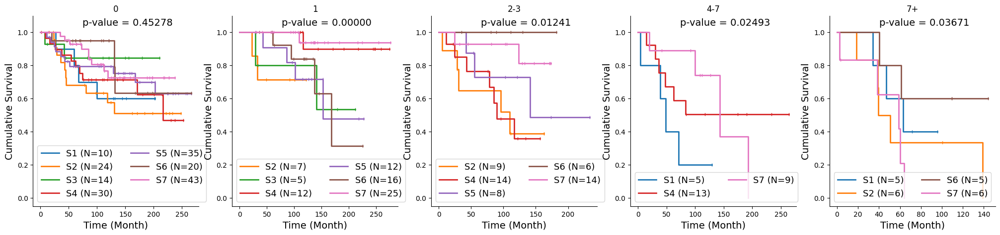

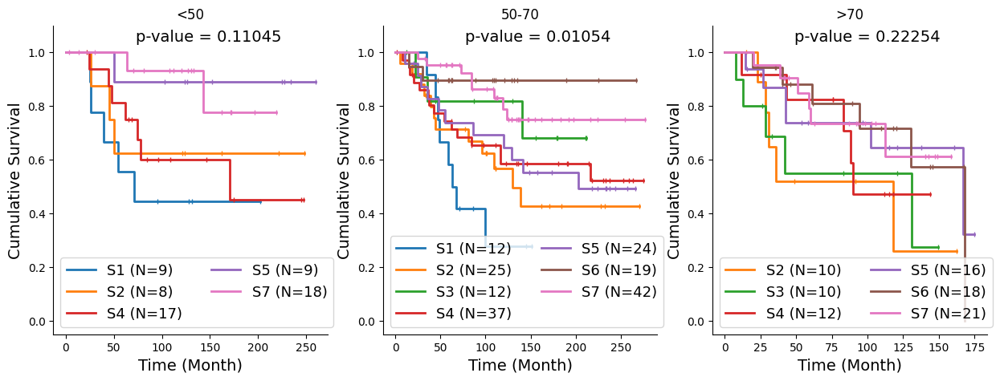

In [45]:
lengths_discovery = [
    survival_d.loc[survival_d["patientID"] == i, "time"].values[0]
    for i in patient_ids_discovery
]
statuses_discovery = [
    (survival_d.loc[survival_d["patientID"] == i, "status"].values[0])
    for i in patient_ids_discovery
]
clinical_variables = ['clinical_subtype', 'stage', 'grade', 'positive_lymph', 'age']

kmf = KaplanMeierFitter()
for clinical_variable in clinical_variables:
    if clinical_variable == 'clinical_subtype':
        clinical_label = clinical_subtypes_discovery
        unique_labels = ['HER2+', 'TNBC', 'HR+/HER2-']
    elif clinical_variable == 'stage':
        clinical_label = stages_discovery
        unique_labels = ['Stage I', 'Stage II', 'Stage III', 'Stage IV']
    elif clinical_variable == 'grade':
        clinical_label = grades_discovery
        unique_labels = ['Grade 1', 'Grade 2', 'Grade 3']
    elif clinical_variable == 'positive_lymph':
        clinical_label = positive_lymph
        unique_labels = ['0', '1', '2-3', '4-7', '7+']
    elif clinical_variable == 'age':
        clinical_label = ages_discovery
        unique_labels = ['<50', '50-70', '>70']
    f, ax = plt.subplots(1,len(unique_labels), figsize=(5*len(unique_labels), 5))
    for i in range(len(unique_labels)):
        unique_label = unique_labels[i]
        for subgroup in patient_subgroups_discovery:
            subgroup_id = subgroup["subgroup_id"]
            length_A, event_observed_A = (
                np.array(lengths_discovery)[(subgroup_ids_discovery == subgroup_id) & (clinical_label == unique_label)],
                np.array(statuses_discovery)[(subgroup_ids_discovery == subgroup_id) & (clinical_label == unique_label)],
            )
            label = "{} (N={})".format(
                subgroup["subgroup_id"], np.sum((subgroup_ids_discovery == subgroup_id) & (clinical_label == unique_label))
        )
            if len(length_A) < 5:
                continue
            kmf.fit(length_A, event_observed_A, label=label)
            kmf.plot_survival_function(
                ax=ax[i],
                ci_show=False,
                color=color_palette_Bigraph[subgroup_id],
                show_censors=True,
                linewidth=2,
                censor_styles={"ms": 5, "marker": "|"},
            )
        log_rank_test = multivariate_logrank_test(
        np.array(lengths_discovery)[(subgroup_ids_discovery != 0) & (clinical_label == unique_label)],
        np.array(subgroup_ids_discovery)[(subgroup_ids_discovery != 0) & (clinical_label == unique_label)],
        np.array(statuses_discovery)[(subgroup_ids_discovery != 0) & (clinical_label == unique_label)],
        )
        p_value = log_rank_test.p_value
        ax[i].legend(ncol=2, fontsize=13)
        ax[i].text(
            x=0.3,
            y=0.95,
            s="p-value = {:.5f}".format(p_value),
            fontsize=14,
            transform=ax[i].transAxes,
        )
        ax[i].set_xlabel("Time (Month)", fontsize=14)
        ax[i].set_ylabel("Cumulative Survival", fontsize=14)
        ax[i].set(
            ylim=(-0.05, 1.1),
            title = unique_label
        )
        sns.despine()

### Fig.6.c Plot hazard ratios of patient subgroups

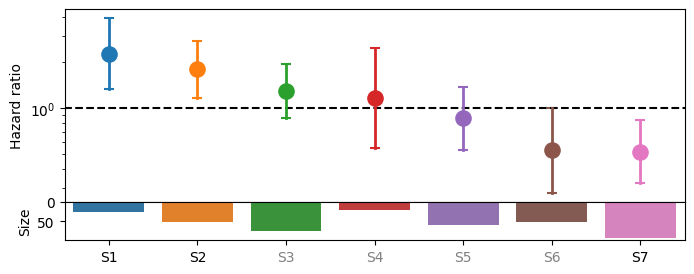

In [61]:
# Plot hazard ratio
f, ax = plt.subplots(2, 1, height_ratios=[5, 1], figsize=(8, 3), sharex=True)
f.subplots_adjust(hspace=0)
ax[0].hlines(1, -1, len(patient_subgroups_discovery), color="k", linestyle="--")
N, xticklabels, xtickcolors = [], [], []
for i in range(len(patient_subgroups_discovery)):
    subgroup = patient_subgroups_discovery[i]
    subgroup_id = subgroup["subgroup_id"]
    hr, hr_lb, hr_ub, p = (
        subgroup["hr"],
        subgroup["hr_lower"],
        subgroup["hr_upper"],
        subgroup["p"],
    )
    ax[0].plot(
        [i, i], [hr_lb, hr_ub], color=color_palette_Bigraph[subgroup_id], linewidth=2
    )
    ax[0].scatter([i], [hr], color=color_palette_Bigraph[subgroup_id], s=120)
    ax[0].scatter(
        [i], [hr_lb], color=color_palette_Bigraph[subgroup_id], s=60, marker="_"
    )
    ax[0].scatter(
        [i], [hr_ub], color=color_palette_Bigraph[subgroup_id], s=60, marker="_"
    )
    N.append(np.sum(subgroup_ids_discovery == subgroup_id))
    xticklabels.append("{}".format(subgroup_id))
    if p < 0.05:
        xtickcolors.append("k")
    else:
        xtickcolors.append("grey")
ax[0].set_xticks(range(len(patient_subgroups_discovery)))
ax[0].set_xticklabels(xticklabels)
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[0].set_xlabel("Patient Subgroups")
ax[0].set_ylabel("Hazard ratio")
ax[0].set_yscale("log")
DF = pd.DataFrame({"N": N, "subgroup_id": xticklabels})
g = sns.barplot(
    data=DF, x="subgroup_id", y="N", palette=color_palette_Bigraph, ax=ax[1]
)
g.invert_yaxis()
ax[1].set_ylabel("Size")
ax[1].set_xlabel("")
plt.show()

## Fig.7 Correlate BiGraph-derived subgroups with Clinical subgroups

### Extract clinical subtype for each patient

In [37]:
patient_ids_discovery = list(SC_d["patientID"].unique())
subgroup_ids_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
subgroup_ids_discovery[:] = "Unclassified"
for i in range(len(patient_subgroups_discovery)):
    subgroup = patient_subgroups_discovery[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_discovery[np.isin(patient_ids_discovery, patient_ids)] = subgroup_id
clinical_subtypes_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
clinical_subtypes_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    er = survival_d.loc[survival_d["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_d.loc[survival_d["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_d.loc[survival_d["patientID"] == patient_id, "HER2 Status"].values[
        0
    ]
    if her2 == "Positive":
        clinical_subtypes_discovery[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_discovery),
        np.sum(clinical_subtypes_discovery == "Unknown"),
        np.sum(clinical_subtypes_discovery == "HER2+"),
        np.sum(clinical_subtypes_discovery == "HR+/HER2-"),
        np.sum(clinical_subtypes_discovery == "TNBC"),
    )
)

stages_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
stages_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    stage = survival_d.loc[survival_d["patientID"] == patient_id, "Tumor Stage"].values[
        0
    ]
    if stage == 1.0:
        stages_discovery[i] = "Stage I"
    elif stage == 2.0:
        stages_discovery[i] = "Stage II"
    elif stage == 3.0:
        stages_discovery[i] = "Stage III"
    elif stage == 4.0:
        stages_discovery[i] = "Stage IV"
print(
    "{} patients in total, {} Unkonw, {} Stage I, {} Stage II, {} Stage III, {} Stage IV".format(
        len(stages_discovery),
        np.sum(stages_discovery == "Unknown"),
        np.sum(stages_discovery == "Stage I"),
        np.sum(stages_discovery == "Stage II"),
        np.sum(stages_discovery == "Stage III"),
        np.sum(stages_discovery == "Stage IV"),
    )
)

grades_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
grades_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    grade = survival_d.loc[survival_d["patientID"] == patient_id, "Grade"].values[0]
    if grade == 1.0:
        grades_discovery[i] = "Grade 1"
    elif grade == 2.0:
        grades_discovery[i] = "Grade 2"
    elif grade == 3.0:
        grades_discovery[i] = "Grade 3"

print(
    "{} patients in total, {} Unkonw, {} Grade 1, {} Grade 2, {} Grade 3".format(
        len(grades_discovery),
        np.sum(grades_discovery == "Unknown"),
        np.sum(grades_discovery == "Grade 1"),
        np.sum(grades_discovery == "Grade 2"),
        np.sum(grades_discovery == "Grade 3"),
    )
)

positive_lymph = np.zeros(len(patient_ids_discovery), dtype=object)
positive_lymph[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    lymph = survival_d.loc[
        survival_d["patientID"] == patient_id, "LymphNodesOrdinal"
    ].values[0]
    positive_lymph[i] = lymph

print(
    "{} patients in total, {} Unkonw, {} 0, {} 1, {} 2-3, {} 4-7, {} 7+".format(
        len(positive_lymph),
        np.sum(positive_lymph == "Unknown"),
        np.sum(positive_lymph == "0"),
        np.sum(positive_lymph == "1"),
        np.sum(positive_lymph == "2-3"),
        np.sum(positive_lymph == "4-7"),
        np.sum(positive_lymph == "7+"),
    )
)

ages_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
ages_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    age = survival_d.loc[
        survival_d["patientID"] == patient_id, "Age at Diagnosis"
    ].values[0]
    if age < 50:
        ages_discovery[i] = "<50"
    elif age >= 50 and age <= 70:
        ages_discovery[i] = "50-70"
    elif age > 70:
        ages_discovery[i] = ">70"
print(
    "{} patients in total, {} Unkonw, {} <50, {} 50-70, {} >70".format(
        len(ages_discovery),
        np.sum(ages_discovery == "Unknown"),
        np.sum(ages_discovery == "<50"),
        np.sum(ages_discovery == "50-70"),
        np.sum(ages_discovery == ">70"),
    )
)

379 patients in total, 54 Unkonw, 32 HER2+, 243 HR+/HER2-, 50 TNBC
379 patients in total, 66 Unkonw, 92 Stage I, 190 Stage II, 27 Stage III, 4 Stage IV
379 patients in total, 7 Unkonw, 35 Grade 1, 147 Grade 2, 190 Grade 3
379 patients in total, 0 Unkonw, 176 0, 79 1, 57 2-3, 37 4-7, 30 7+
379 patients in total, 54 Unkonw, 64 <50, 171 50-70, 90 >70


###  Table 1: Averaged inter-patient similarity

In [26]:
def caculate_mutual_similarity(gram_matrix):
    gram_matrix_ = gram_matrix.copy()
    np.fill_diagonal(gram_matrix_, -1)
    return np.mean(gram_matrix_[gram_matrix_ != -1])


Similarity_matrix = bigraph_.Similarity_matrix
print(
    "The mutual similarity of the population graph is {:.2f}".format(
        caculate_mutual_similarity(Similarity_matrix)
    )
)

Gram_matrix_ = Similarity_matrix[
    np.array(np.where(clinical_subtypes_discovery == "HER2+")[0].tolist()), :
][:, np.array(np.where(clinical_subtypes_discovery == "HER2+")[0].tolist())]
print(
    "{} HER2+ patients, averaged Intra-group similarity is {:.2f} ".format(
        Gram_matrix_.shape[0], caculate_mutual_similarity(Gram_matrix_)
    )
)

Gram_matrix_ = Similarity_matrix[
    np.array(np.where(clinical_subtypes_discovery == "HR+/HER2-")[0].tolist()), :
][:, np.array(np.where(clinical_subtypes_discovery == "HR+/HER2-")[0].tolist())]
print(
    "{} HR+/HER2- patients, averaged Intra-group similarity is {:.2f} ".format(
        Gram_matrix_.shape[0], caculate_mutual_similarity(Gram_matrix_)
    )
)

Gram_matrix_ = Similarity_matrix[
    np.array(np.where(clinical_subtypes_discovery == "TNBC")[0].tolist()), :
][:, np.array(np.where(clinical_subtypes_discovery == "TNBC")[0].tolist())]
print(
    "{} TNBC patients, averaged Intra-group similarity is {:.2f} ".format(
        Gram_matrix_.shape[0], caculate_mutual_similarity(Gram_matrix_)
    )
)

print("\n")

for stage in ["Stage I", "Stage II", "Stage III", "Stage IV"]:
    Gram_matrix_ = Similarity_matrix[
        np.array(np.where(stages_discovery == stage)[0].tolist()), :
    ][:, np.array(np.where(stages_discovery == stage)[0].tolist())]
    print(
        "{} Stage {} patients, averaged Intra-group similarity is {:.2f} ".format(
            Gram_matrix_.shape[0], stage, caculate_mutual_similarity(Gram_matrix_)
        )
    )

print("\n")
for grade in ["Grade 1", "Grade 2", "Grade 3"]:
    Gram_matrix_ = Similarity_matrix[
        np.array(np.where(grades_discovery == grade)[0].tolist()), :
    ][:, np.array(np.where(grades_discovery == grade)[0].tolist())]
    print(
        "{} Grade {} patients, averaged Intra-group similarity is {:.2f} ".format(
            Gram_matrix_.shape[0], grade, caculate_mutual_similarity(Gram_matrix_)
        )
    )

print("\n")
for lymph in ["0", "1", "2-3", "4-7", "7+"]:
    Gram_matrix_ = Similarity_matrix[
        np.array(np.where(positive_lymph == lymph)[0].tolist()), :
    ][:, np.array(np.where(positive_lymph == lymph)[0].tolist())]
    print(
        "{} patients with {} positive lymph nodes, averaged Intra-group similarity is {:.2f} ".format(
            Gram_matrix_.shape[0], lymph, caculate_mutual_similarity(Gram_matrix_)
        )
    )

print("\n")
for age in ["<50", "50-70", ">70"]:
    Gram_matrix_ = Similarity_matrix[
        np.array(np.where(ages_discovery == age)[0].tolist()), :
    ][:, np.array(np.where(ages_discovery == age)[0].tolist())]
    print(
        "{} patients with age {}, averaged Intra-group similarity is {:.2f} ".format(
            Gram_matrix_.shape[0], age, caculate_mutual_similarity(Gram_matrix_)
        )
    )

The mutual similarity of the population graph is 0.18
32 HER2+ patients, averaged Intra-group similarity is 0.43 
243 HR+/HER2- patients, averaged Intra-group similarity is 0.20 
50 TNBC patients, averaged Intra-group similarity is 0.15 


92 Stage Stage I patients, averaged Intra-group similarity is 0.17 
190 Stage Stage II patients, averaged Intra-group similarity is 0.17 
27 Stage Stage III patients, averaged Intra-group similarity is 0.20 
4 Stage Stage IV patients, averaged Intra-group similarity is 0.36 


35 Grade Grade 1 patients, averaged Intra-group similarity is 0.25 
147 Grade Grade 2 patients, averaged Intra-group similarity is 0.20 
190 Grade Grade 3 patients, averaged Intra-group similarity is 0.17 


176 patients with 0 positive lymph nodes, averaged Intra-group similarity is 0.16 
79 patients with 1 positive lymph nodes, averaged Intra-group similarity is 0.20 
57 patients with 2-3 positive lymph nodes, averaged Intra-group similarity is 0.19 
37 patients with 4-7 posi

In [6]:
intra_cluster_similarity = 0
for subgroup_id in [
    "S" + str(i) for i in range(1, len(patient_subgroups_discovery) + 1)
]:
    Gram_matrix_ = Similarity_matrix[
        np.array(np.where(subgroup_ids_discovery == subgroup_id)[0].tolist()), :
    ][:, np.array(np.where(subgroup_ids_discovery == subgroup_id)[0].tolist())]
    intra_cluster_similarity += np.sum(Gram_matrix_)
    print(
        "{} patients in {}, averaged Intra-group similarity is {:.2f} ".format(
            subgroup_id, Gram_matrix_.shape[0], caculate_mutual_similarity(Gram_matrix_)
        )
    )
inter_cluster_similarity = np.sum(Similarity_matrix) - intra_cluster_similarity
print(
    "Intra-cluster similarity is {:.2f}, inter-cluster similarity = {:.2f}, ratio = {:.2f}".format(
        intra_cluster_similarity,
        inter_cluster_similarity,
        intra_cluster_similarity / inter_cluster_similarity,
    )
)

S1 patients in 26, averaged Intra-group similarity is 0.75 
S2 patients in 48, averaged Intra-group similarity is 0.26 
S3 patients in 23, averaged Intra-group similarity is 0.73 
S4 patients in 73, averaged Intra-group similarity is 0.45 
S5 patients in 61, averaged Intra-group similarity is 0.32 
S6 patients in 51, averaged Intra-group similarity is 0.61 
S7 patients in 97, averaged Intra-group similarity is 0.37 
Intra-cluster similarity is 10429.97, inter-cluster similarity = 15558.35, ratio = 0.67


### Fig 7.a Paint Population graph with clinical subtypes

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1019: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.asarray(x)


[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')]]

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)


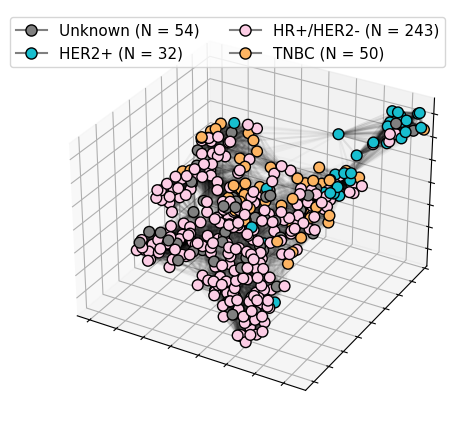

In [42]:
# For visualization purpose, we make nodes distant from each other
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    bigraph_.Similarity_matrix, patient_ids_discovery
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_clinical[i] for i in clinical_subtypes_discovery],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
for clinical_subtype_id in ["Unknown", "HER2+", "HR+/HER2-", "TNBC"]:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_clinical[clinical_subtype_id],
            label="{} (N = {})".format(
                clinical_subtype_id,
                np.sum(clinical_subtypes_discovery == clinical_subtype_id),
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

### Fig 7.b Paint Population graph with tumor stage

[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')]]

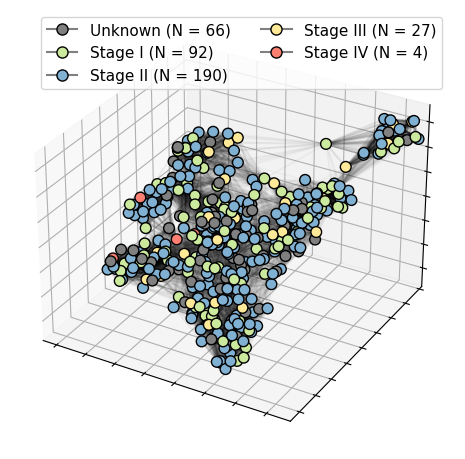

In [40]:
color_palette_stage = {
    "Unknown": "grey",
    "Stage I": sns.color_palette("YlGn")[1],
    "Stage II": sns.color_palette("Set3")[4],
    "Stage III": sns.color_palette("Spectral")[2],
    "Stage IV": sns.color_palette("Set3")[3],
}
# For visualization purpose, we make nodes distant from each other
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    bigraph_.Similarity_matrix, patient_ids_discovery
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_stage[i] for i in stages_discovery],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
for stage_id in ["Unknown", "Stage I", "Stage II", "Stage III", "Stage IV"]:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_stage[stage_id],
            label="{} (N = {})".format(stage_id, np.sum(stages_discovery == stage_id)),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

### Fig 7.d Paint Population graph with tumor grade

[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')]]

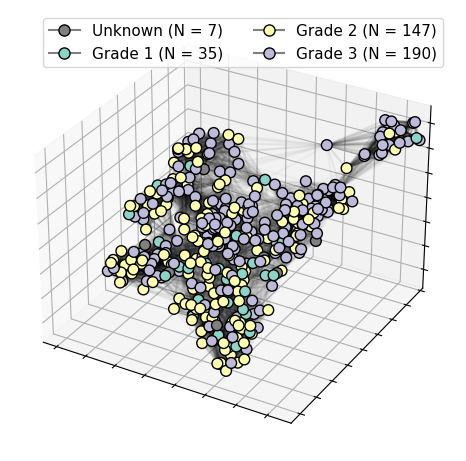

In [39]:
# For visualization purpose, we make nodes distant from each other
color_palette_grade = {
    "Unknown": "grey",
    "Grade 1": sns.color_palette("Set3")[0],
    "Grade 2": sns.color_palette("Set3")[1],
    "Grade 3": sns.color_palette("Set3")[2],
}
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    bigraph_.Similarity_matrix, patient_ids_discovery
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_grade[i] for i in grades_discovery],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
for grade_id in ["Unknown", "Grade 1", "Grade 2", "Grade 3"]:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_grade[grade_id],
            label="{} (N = {})".format(grade_id, np.sum(grades_discovery == grade_id)),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

### Fig 7.d Paint Population graph with age group

[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')]]

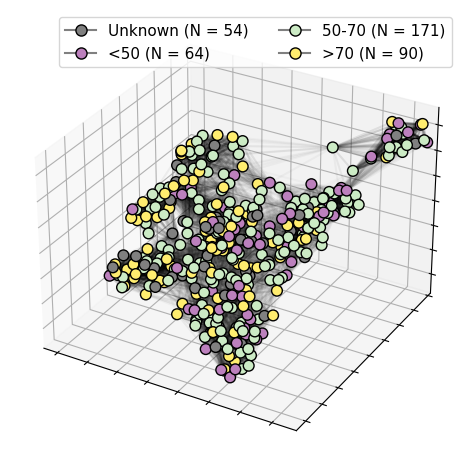

In [42]:
# For visualization purpose, we make nodes distant from each other
color_palette_age = {
    "Unknown": "grey",
    "<50": sns.color_palette("Set3")[-3],
    "50-70": sns.color_palette("Set3")[-2],
    ">70": sns.color_palette("Set3")[-1],
}
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    bigraph_.Similarity_matrix, patient_ids_discovery
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_age[i] for i in ages_discovery],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
for age_id in ["Unknown", "<50", "50-70", ">70"]:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_age[age_id],
            label="{} (N = {})".format(age_id, np.sum(ages_discovery == age_id)),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

### Fig.7.e Spearmanr correlation 

Clinical Subtype: HER2+, Subgroup: S1, correlation_coefficient: 0.63, p_val: 1.83e-43
Clinical Subtype: HER2+, Subgroup: S7, correlation_coefficient: -0.16, p_val: 2.27e-03
Clinical Subtype: TNBC, Subgroup: S2, correlation_coefficient: 0.23, p_val: 8.36e-06
Clinical Subtype: TNBC, Subgroup: S4, correlation_coefficient: 0.21, p_val: 5.80e-05
Clinical Subtype: TNBC, Subgroup: S7, correlation_coefficient: -0.16, p_val: 2.15e-03
Clinical Subtype: HR+/HER2-, Subgroup: S1, correlation_coefficient: -0.28, p_val: 4.86e-08
Clinical Subtype: HR+/HER2-, Subgroup: S7, correlation_coefficient: 0.17, p_val: 6.66e-04
Stage: Stage IV, Subgroup: S3, correlation_coefficient: 0.19, p_val: 1.98e-04
Grade: Grade 1, Subgroup: S7, correlation_coefficient: 0.21, p_val: 3.87e-05
Grade: Grade 2, Subgroup: S7, correlation_coefficient: 0.18, p_val: 4.84e-04
Grade: Grade 3, Subgroup: S1, correlation_coefficient: 0.17, p_val: 1.16e-03
Grade: Grade 3, Subgroup: S7, correlation_coefficient: -0.30, p_val: 3.35e-09


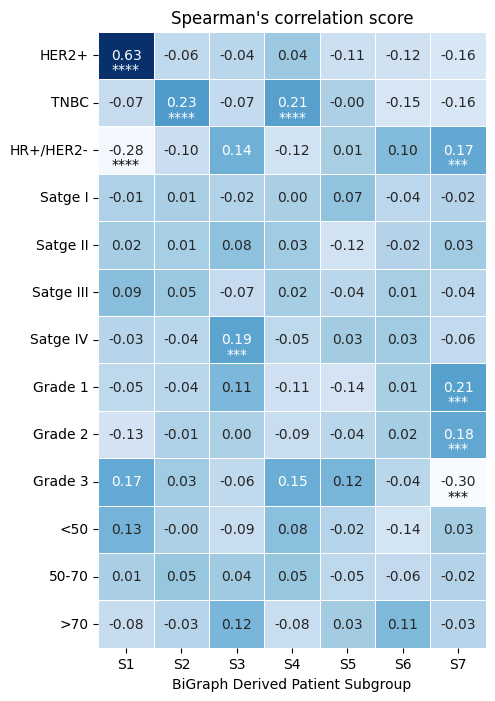

In [25]:
import numpy as np

spearmanr_corr = np.zeros((13, 7))
P_value = np.zeros((13, 7))
for i in range(3):
    clinical_subtype = ["HER2+", "TNBC", "HR+/HER2-"][i]
    for j in range(7):
        subgroup_id = ["S1", "S2", "S3", "S4", "S5", "S6", "S7"][j]
        variable_1 = np.array(clinical_subtypes_discovery) == clinical_subtype
        variable_2 = np.array(subgroup_ids_discovery) == subgroup_id
        correlation_coefficient, p_value = spearmanr(variable_1, variable_2)
        spearmanr_corr[i, j] = correlation_coefficient
        P_value[i, j] = p_value
        if p_value < 0.05 / (3 * 7):
            print(
                "Clinical Subtype: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
                    clinical_subtype, subgroup_id, correlation_coefficient, p_value
                )
            )
for i in range(3, 7):
    stage = ["Stage I", "Stage II", "Stage III", "Stage IV"][i - 3]
    for j in range(7):
        subgroup_id = ["S1", "S2", "S3", "S4", "S5", "S6", "S7"][j]
        variable_1 = np.array(stages_discovery) == stage
        variable_2 = np.array(subgroup_ids_discovery) == subgroup_id
        correlation_coefficient, p_value = spearmanr(variable_1, variable_2)
        spearmanr_corr[i, j] = correlation_coefficient
        P_value[i, j] = p_value
        if p_value < 0.05 / (4 * 7):
            print(
                "Stage: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
                    stage, subgroup_id, correlation_coefficient, p_value
                )
            )
for i in range(7, 10):
    grade = ["Grade 1", "Grade 2", "Grade 3"][i - 7]
    for j in range(7):
        subgroup_id = ["S1", "S2", "S3", "S4", "S5", "S6", "S7"][j]
        variable_1 = np.array(grades_discovery) == grade
        variable_2 = np.array(subgroup_ids_discovery) == subgroup_id
        correlation_coefficient, p_value = spearmanr(variable_1, variable_2)
        spearmanr_corr[i, j] = correlation_coefficient
        P_value[i, j] = p_value
        if p_value < 0.05 / (3 * 7):
            print(
                "Grade: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
                    grade, subgroup_id, correlation_coefficient, p_value
                )
            )

for i in range(10, 13):
    age = ["<50", "50-70", ">70"][i - 10]
    for j in range(7):
        subgroup_id = ["S1", "S2", "S3", "S4", "S5", "S6", "S7"][j]
        variable_1 = np.array(ages_discovery) == age
        variable_2 = np.array(subgroup_ids_discovery) == subgroup_id
        correlation_coefficient, p_value = spearmanr(variable_1, variable_2)
        spearmanr_corr[i, j] = correlation_coefficient
        P_value[i, j] = p_value
        if p_value < 0.05 / (3 * 7):
            print(
                "Age: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
                    grade, subgroup_id, correlation_coefficient, p_value
                )
            )


f, ax = plt.subplots(figsize=(5, 8))
sns.heatmap(
    spearmanr_corr,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=False,
    linewidths=0.5,
    linecolor="white",
    ax=ax,
    vmax=0.6,
)
ax.text(
    0 + 0.5,
    0 + 0.8,
    "****",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)
ax.text(
    0 + 0.5,
    2 + 0.8,
    "****",
    horizontalalignment="center",
    verticalalignment="center",
    color="black",
)

ax.text(
    1 + 0.5,
    1 + 0.8,
    "****",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)
ax.text(
    3 + 0.5,
    1 + 0.8,
    "****",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)

ax.text(
    6 + 0.5,
    2 + 0.8,
    "***",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)

ax.text(
    2 + 0.5,
    6 + 0.8,
    "***",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)

ax.text(
    6 + 0.5,
    7 + 0.8,
    "***",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)

ax.text(
    6 + 0.5,
    8 + 0.8,
    "***",
    horizontalalignment="center",
    verticalalignment="center",
    color="white",
)

ax.text(
    6 + 0.5,
    9 + 0.8,
    "***",
    horizontalalignment="center",
    verticalalignment="center",
    color="k",
)


ax.set_xlabel("BiGraph Derived Patient Subgroup")
# ax.set_ylabel("Clinical Subtype")
ax.set_xticklabels(["S1", "S2", "S3", "S4", "S5", "S6", "S7"], rotation=0)
ax.set_yticklabels(
    [
        "HER2+",
        "TNBC",
        "HR+/HER2-",
        "Satge I",
        "Satge II",
        "Satge III",
        "Satge IV",
        "Grade 1",
        "Grade 2",
        "Grade 3",
        "<50",
        "50-70",
        ">70",
    ],
    rotation=0,
)
ax.set(title="Spearman's correlation score")
plt.show()

## Fig.8 BiGraph enhances the risk stratification of clinical subtype 

### Fig.8.a HER2+ and S1

     test_statistic         p   -log2(p)
1 2        3.412484  0.064705   3.949979
  3       14.702734  0.000126  12.955849
2 3        0.600978  0.438205   1.190321


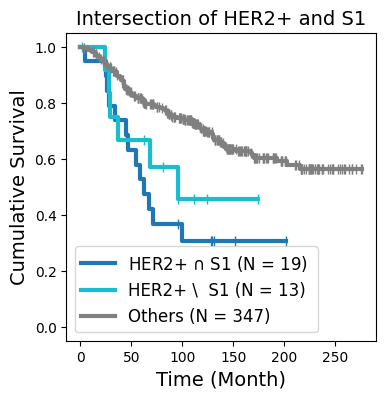

In [38]:
clinical_subtype = "HER2+"
subgroup_id = "S1"
lengths_discovery = np.array(lengths_discovery)
statuses_discovery = np.array(statuses_discovery)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_discovery == subgroup_id) & (
    clinical_subtypes_discovery == clinical_subtype
)
length_A, event_observed_A = (
    lengths_discovery[Indices_A],
    statuses_discovery[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_discovery != subgroup_id) & (
    clinical_subtypes_discovery == clinical_subtype
)
length_C, event_observed_C = (
    lengths_discovery[Indices_C],
    statuses_discovery[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_discovery != clinical_subtype
length_B, event_observed_B = (
    lengths_discovery[Indices_B],
    statuses_discovery[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_discovery, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_discovery == clinical_subtype))
    & (subgroup_ids_discovery != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_discovery == clinical_subtype))
    & (subgroup_ids_discovery == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_discovery,
    groups,
    statuses_discovery,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

### Fig.8.b TNBC and S2

     test_statistic         p   -log2(p)
1 2        1.150671  0.283409   1.819044
  3       12.820089  0.000343  11.509851
2 3        2.354184  0.124947   3.000609


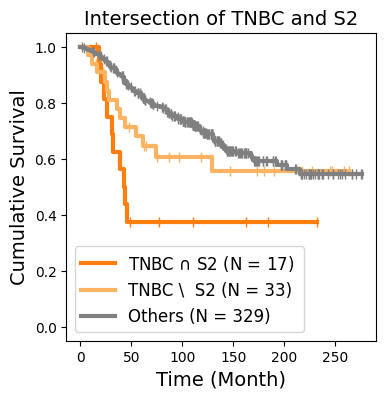

In [68]:
clinical_subtype = "TNBC"
subgroup_id = "S2"
lengths_discovery = np.array(lengths_discovery)
statuses_discovery = np.array(statuses_discovery)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_discovery == subgroup_id) & (
    clinical_subtypes_discovery == clinical_subtype
)
length_A, event_observed_A = (
    lengths_discovery[Indices_A],
    statuses_discovery[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_discovery != subgroup_id) & (
    clinical_subtypes_discovery == clinical_subtype
)
length_C, event_observed_C = (
    lengths_discovery[Indices_C],
    statuses_discovery[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_discovery != clinical_subtype
length_B, event_observed_B = (
    lengths_discovery[Indices_B],
    statuses_discovery[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_discovery, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_discovery == clinical_subtype))
    & (subgroup_ids_discovery != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_discovery == clinical_subtype))
    & (subgroup_ids_discovery == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_discovery,
    groups,
    statuses_discovery,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

### Fig.8.c HR+/HER2-+ and S7

     test_statistic         p   -log2(p)
1 2        4.225126  0.039830   4.650013
  3       11.375827  0.000744  10.392291
2 3        3.168599  0.075067   3.735681


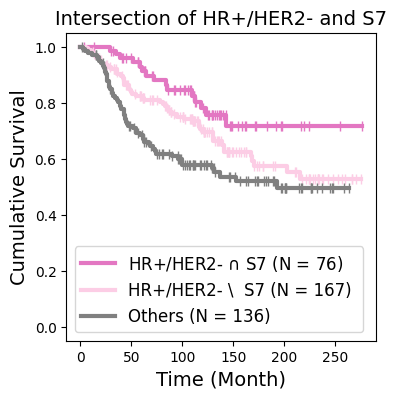

In [69]:
clinical_subtype = "HR+/HER2-"
subgroup_id = "S7"
lengths_discovery = np.array(lengths_discovery)
statuses_discovery = np.array(statuses_discovery)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_discovery == subgroup_id) & (
    clinical_subtypes_discovery == clinical_subtype
)
length_A, event_observed_A = (
    lengths_discovery[Indices_A],
    statuses_discovery[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_discovery != subgroup_id) & (
    clinical_subtypes_discovery == clinical_subtype
)
length_C, event_observed_C = (
    lengths_discovery[Indices_C],
    statuses_discovery[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_discovery != clinical_subtype
length_B, event_observed_B = (
    lengths_discovery[Indices_B],
    statuses_discovery[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_discovery, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_discovery == clinical_subtype))
    & (subgroup_ids_discovery != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_discovery == clinical_subtype))
    & (subgroup_ids_discovery == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_discovery,
    groups,
    statuses_discovery,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

##  Fig.9 Signature of characteristic patterns in each patient subgroup

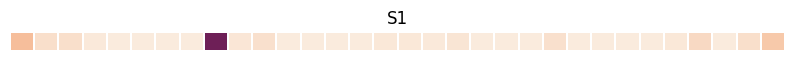

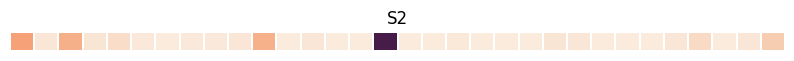

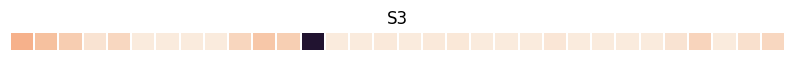

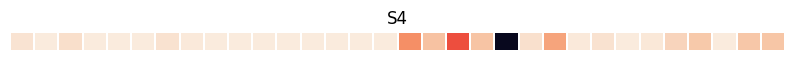

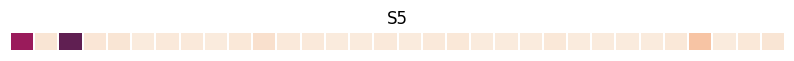

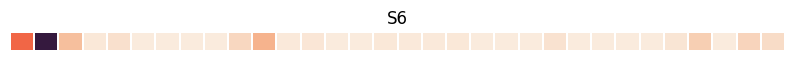

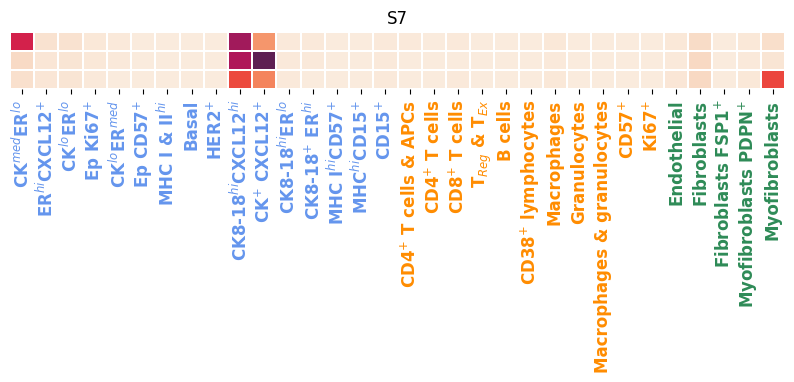

In [11]:
Signatures = bigraph_.fitted_soft_wl_subtree.Signatures
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if len(characteristic_patterns) == 0:
        continue
    f, ax = plt.subplots(1, 1, figsize=(10, 0.25 * len(characteristic_patterns)))
    sns.heatmap(
        Signatures[np.array(characteristic_patterns), :],
        ax=ax,
        cbar=False,
        cmap="rocket_r",
        linewidth=0.005,
        vmax=np.percentile(Signatures, 99),
        vmin=np.percentile(Signatures, 1),
    )
    ax.get_yaxis().set_visible(False)
    if subgroup_id == "S7":
        ax.set_xticklabels(
            Cell_types_displayed_Danenberg, rotation=90, fontsize=12, fontweight="bold"
        )
        # ax.set_xlabel("Cell Phenotypes", fontsize=14)
        xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["seagreen"] * 5
        for xtick, color in zip(ax.get_xticklabels(), xtickcolors):
            xtick.set_color(color)
    else:
        ax.get_xaxis().set_visible(False)
    # if subgroup_id == "S1":
    #     ax.set_title(
    #         "Signature of characteristic patterns in each patient subgroups \n\n {}".format(subgroup_id), fontsize=14
    #     )
    # else:
    ax.set_title("{}".format(subgroup_id))
    # ax.set_title(f"Signature of characteristic patterns in {subgroup_id}", fontsize=10)
    plt.show()

## Fig.10 Representative examples of characteristic patterns in each patient subgroup. 

### Size distribution of cellular neighborhoods

In [ ]:
Sizes = []
Distances = []
for i in range(len(bigraph_.fitted_soft_wl_subtree.X)):
    print(i)
    adj = bigraph_.fitted_soft_wl_subtree.X[i][1]
    adj_square = adj @ adj
    Sizes.append(np.sum(adj_square > 0.01, axis=1).flatten())
    distance = np.sqrt(-np.log(adj) / 0.01)
    maxium_distance = [
        np.max(distance[i][adj_square[i] > 0.01]) for i in range(len(adj))
    ]
    Distances.extend(maxium_distance)
Sizes = np.concatenate(Sizes)
Distances = np.array(Distances)
print(np.median(Sizes), np.median(Distances))

In [73]:
explainer_ = Explainer()
X_prime = bigraph_.fitted_soft_wl_subtree.X_prime
Signatures = bigraph_.fitted_soft_wl_subtree.Signatures

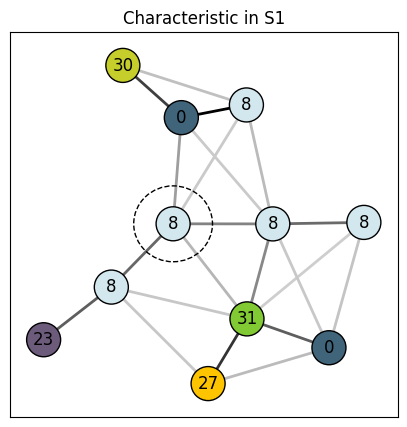

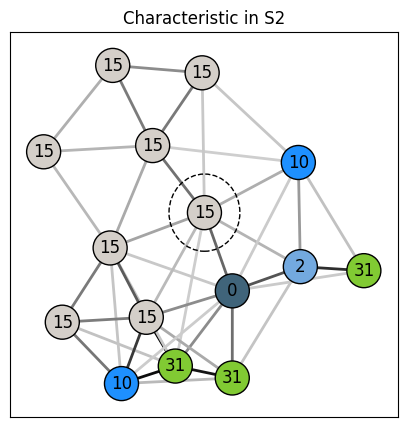

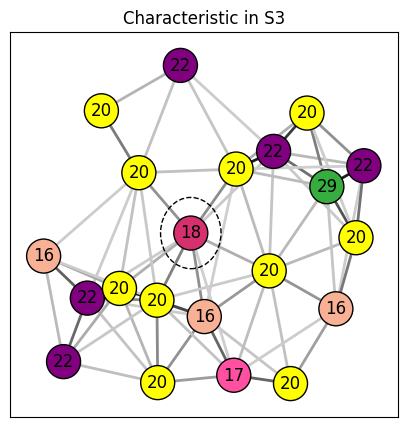

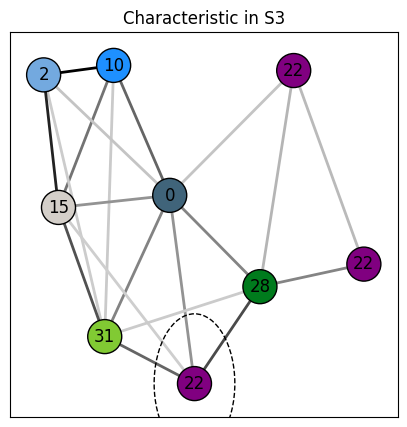

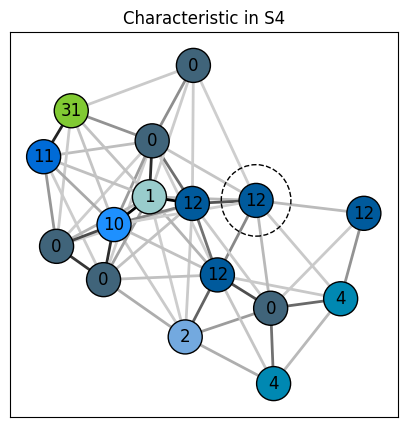

...

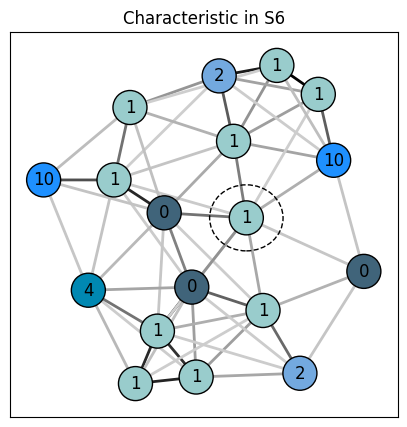

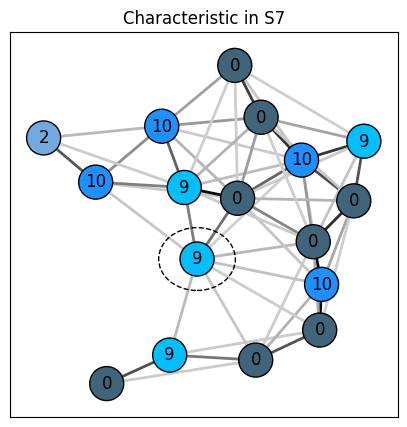

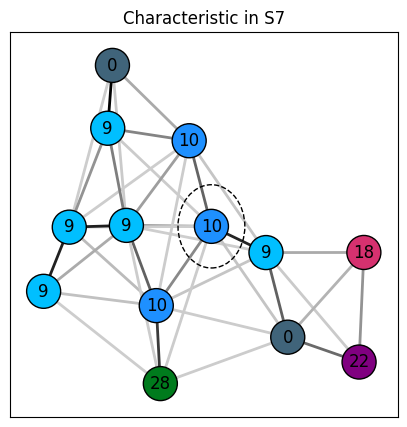

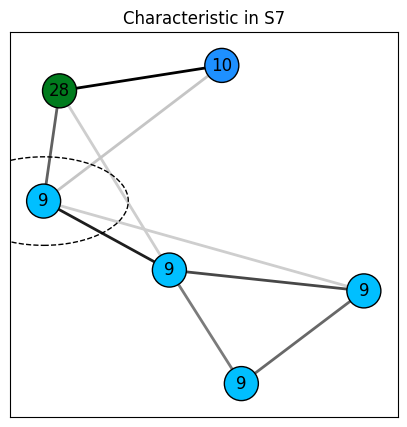

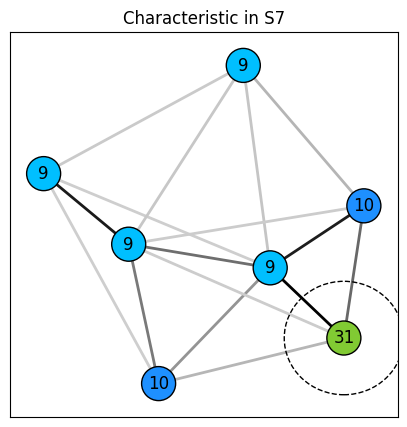

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


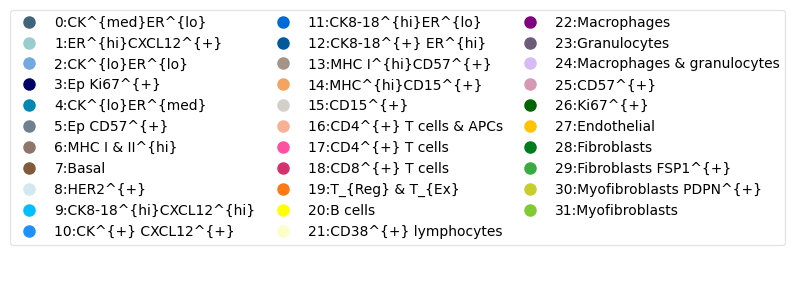

In [74]:
def get_pos(G):
    x = nx.get_node_attributes(G, "coorX")
    y = nx.get_node_attributes(G, "coorY")
    pos = {}
    for key, _ in x.items():
        pos[key] = (x[key], y[key])
    return pos


def normalize_pos(pos):
    x = np.array([pos[key][0] for key in pos.keys()])
    y = np.array([pos[key][1] for key in pos.keys()])
    x = x - np.mean(x)
    y = y - np.mean(y)
    pos_normalized = {}
    for i, key in enumerate(pos.keys()):
        pos_normalized[key] = (x[i], y[i])
    return pos_normalized


def decide_subtree_boundary(root_idx, Adj, iteration, boundary_weight_threshold=0.1):
    W = Adj.copy()
    for i in range(iteration):
        W = np.matmul(W, Adj)
    leaf_indices = list(np.where(W[root_idx, :] > boundary_weight_threshold)[0])
    return leaf_indices


for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    for pattern_index in range(len(characteristic_patterns)):
        pattern_id = characteristic_patterns[pattern_index]
        representative_subtrees = explainer_.find_representative_subtrees(
            X_prime, Signatures, pattern_id, n=1
        )
        for patient_id, subtree_root_local_idx in representative_subtrees:
            adj = X_prime[patient_ids_discovery.index(patient_id)][1]
            subtree_leaves_local_idx = decide_subtree_boundary(
                subtree_root_local_idx, adj, 2, boundary_weight_threshold=0.1
            )
            cells_ = SC_d.loc[SC_d.patientID == patient_id].reset_index(drop=True)
            adj_ = adj.copy()
            adj_[adj_ < 0.01] = 0
            np.fill_diagonal(adj_, 0)
            cellular_graph = nx.from_numpy_array(adj_)
            nx.set_node_attributes(cellular_graph, cells_["coorX"], "coorX")
            nx.set_node_attributes(cellular_graph, cells_["coorY"], "coorY")
            nx.set_node_attributes(cellular_graph, cells_["celltypeID"], "celltypeID")
            nx.set_node_attributes(
                cellular_graph, cells_["meta_description"], "meta_description"
            )
            subtree_graph = nx.subgraph(cellular_graph, subtree_leaves_local_idx)
            edge_list = list(subtree_graph.edges())
            edge_alpha = [
                (
                    10 * subtree_graph[u][v]["weight"]
                    if subtree_graph[u][v]["weight"] > 0.01
                    else 0
                )
                for u, v in edge_list
            ]
            edge_alpha = np.array(edge_alpha)
            cmap_greys = plt.get_cmap("Greys")
            start_point = 0.3
            end_point = 1.0
            new_cmap_colors = cmap_greys(np.linspace(start_point, end_point, 256))
            new_cmap = mcolors.LinearSegmentedColormap.from_list(
                "Greys_RightHalf", new_cmap_colors
            )
            f, ax = plt.subplots(figsize=(5, 5))
            circle = plt.Circle(
                (
                    normalize_pos(get_pos(subtree_graph))[subtree_root_local_idx][0],
                    normalize_pos(get_pos(subtree_graph))[subtree_root_local_idx][1],
                ),
                5,
                color="k",
                fill=False,
                linestyle="--",
            )
            nx.draw_networkx(
                subtree_graph,
                normalize_pos(get_pos(subtree_graph)),
                node_size=600,
                node_color=[
                    get_node_color("Danenberg", "CellType")[cell_type]
                    for cell_type in list(
                        nx.get_node_attributes(
                            subtree_graph, "meta_description"
                        ).values()
                    )
                ],
                labels=nx.get_node_attributes(subtree_graph, "celltypeID"),
                font_color="k",
                with_labels=True,
                edgecolors="k",
                ax=ax,
                edge_color=edge_alpha,
                edge_cmap=new_cmap,
                width=2,
            )
            ax.add_patch(circle)
            ax.set_title("Characteristic in {}".format(subgroup_id), fontsize=12)
fig, ax = plt.subplots(figsize=(10, 0.4), tight_layout=True)
func = lambda m, c: plt.plot([], [], marker=m, color=c, ls="none", markersize=8)[0]
cell_types = [
    str(i) + ":" + reverse_dict(get_node_id("Danenberg", "CellType"))[i]
    for i in range(len(get_node_id("Danenberg", "CellType")))
]
handles = [
    func("o", get_node_color("Danenberg", "CellType")[i.split(":")[1]])
    for i in cell_types
]
ax.legend(
    handles,
    cell_types,
    loc=3,
    framealpha=0.5,
    frameon=1,
    ncols=3,
    bbox_to_anchor=(0, 1.02, 1, 0.2),
    mode="expand",
    borderaxespad=0.0,
    fontsize=10,
)

ax.axis("off")
plt.show()

## Fig.11 Prognostic impacts of the characteristic TME patterns.

In [24]:
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)

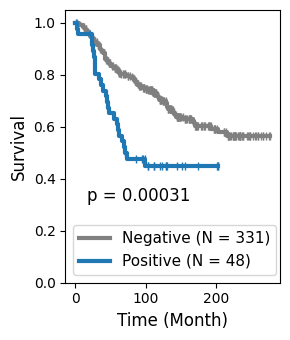

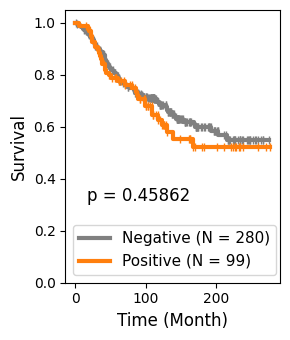

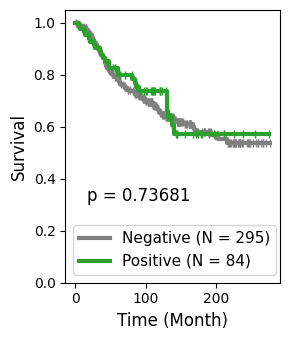

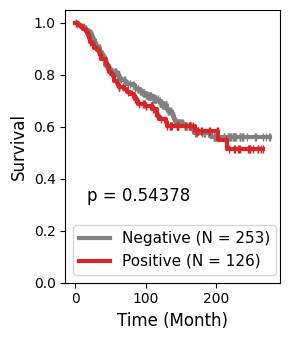

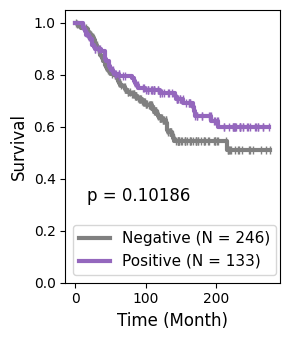

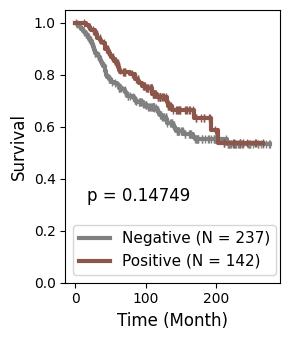

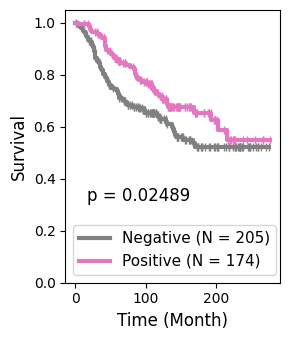

NameError: name 'clinical_subtypes_discovery' is not defined

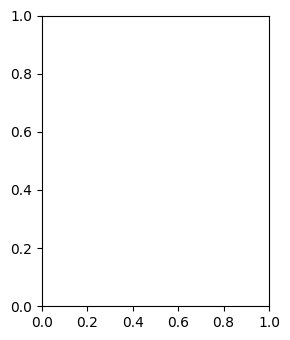

In [25]:
threshold = 0.01
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    f, ax = plt.subplots(figsize=(3, 3.5), tight_layout=True)
    proportion = Proportions[:, np.array(characteristic_patterns)].sum(axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(
        np.array(lengths_discovery)[proportion < threshold],
        np.array(statuses_discovery)[proportion < threshold],
        label="Negative (N = {})".format(np.sum(proportion < threshold)),
    )
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color="grey",
        linewidth=3,
    )
    kmf.fit(
        np.array(lengths_discovery)[(proportion >= threshold)],
        np.array(statuses_discovery)[(proportion >= threshold)],
        label="Positive (N = {})".format(np.sum((proportion >= threshold))),
    )
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color=color_palette_Bigraph[subgroup_id],
        linewidth=3,
    )
    test = logrank_test(
        np.array(lengths_discovery)[(proportion < threshold)],
        np.array(lengths_discovery)[(proportion >= threshold)],
        np.array(statuses_discovery)[proportion < threshold],
        np.array(statuses_discovery)[(proportion >= threshold)],
    )
    ax.text(
        0.1, 0.3, "p = {:.5f}".format(test.p_value), fontsize=12, transform=ax.transAxes
    )
    ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
    ax.set_xlabel("Time (Month)", fontsize=12)
    ax.set_ylabel("Survival", fontsize=12)
    ax.legend(fontsize=11)
    plt.show()

# S4 and TNBC
characteristic_patterns = patient_subgroups_discovery[3]["characteristic_patterns"]
clinical_subtype = "TNBC"
f, ax = plt.subplots(figsize=(3, 3.5), tight_layout=True)
proportion = Proportions[:, np.array(characteristic_patterns)].sum(axis=1)
kmf = KaplanMeierFitter()
kmf.fit(
        np.array(lengths_discovery)[(proportion < threshold) & (clinical_subtypes_discovery == clinical_subtype)],
        np.array(statuses_discovery)[(proportion < threshold) & (clinical_subtypes_discovery == clinical_subtype)],
        label="Negative (N = {})".format(np.sum((proportion < threshold) & (clinical_subtypes_discovery == clinical_subtype))),
    )
kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color="grey",
        linewidth=3,
    )
kmf.fit(
        np.array(lengths_discovery)[(proportion >= threshold)& (clinical_subtypes_discovery == clinical_subtype)],
        np.array(statuses_discovery)[(proportion >= threshold)& (clinical_subtypes_discovery == clinical_subtype)],
        label="Positive (N = {})".format(np.sum((proportion >= threshold)& (clinical_subtypes_discovery == clinical_subtype))),
    )
kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color=color_palette_Bigraph['S4'],
        linewidth=3,
    )
test = logrank_test(
        np.array(lengths_discovery)[(proportion < threshold) & (clinical_subtypes_discovery == clinical_subtype)],
        np.array(lengths_discovery)[(proportion >= threshold)& (clinical_subtypes_discovery == clinical_subtype)],
        np.array(statuses_discovery)[(proportion <= threshold) & (clinical_subtypes_discovery == clinical_subtype)],
        np.array(statuses_discovery)[(proportion > threshold)& (clinical_subtypes_discovery == clinical_subtype)],
    )
ax.text(
        0.1, 0.3, "p = {:.5f}".format(test.p_value), fontsize=12, transform=ax.transAxes
    )
ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
ax.set_xlabel("Time (Month)", fontsize=12)
ax.set_ylabel("Survival", fontsize=12)
ax.legend(fontsize=11)
plt.show()

#### Prognostic value of characteristic patterns in each clincially patients subgroups

379 patients in total, 54 Unkonw, 32 HER2+, 243 HR+/HER2-, 50 TNBC


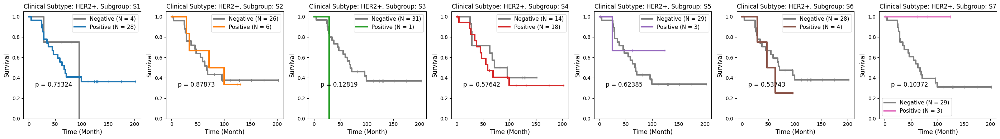

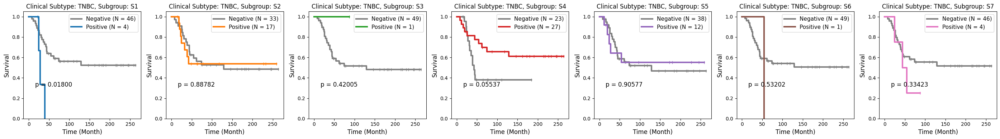

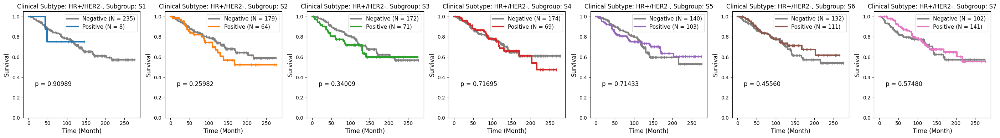

In [15]:
clinical_subtypes_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
clinical_subtypes_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    er = survival_d.loc[survival_d["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_d.loc[survival_d["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_d.loc[survival_d["patientID"] == patient_id, "HER2 Status"].values[
        0
    ]
    if her2 == "Positive":
        clinical_subtypes_discovery[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_discovery),
        np.sum(clinical_subtypes_discovery == "Unknown"),
        np.sum(clinical_subtypes_discovery == "HER2+"),
        np.sum(clinical_subtypes_discovery == "HR+/HER2-"),
        np.sum(clinical_subtypes_discovery == "TNBC"),
    )
)
threshold = 0.01
for clinical_subtype in ["HER2+", "TNBC", "HR+/HER2-"]:
    f, ax = plt.subplots(
        1,
        len(patient_subgroups_discovery),
        figsize=(4 * len(patient_subgroups_discovery), 4),
        tight_layout=True,
    )
    for i in range(len(patient_subgroups_discovery)):
        subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
        characteristic_patterns = patient_subgroups_discovery[i][
            "characteristic_patterns"
        ]

        proportion = Proportions[:, np.array(characteristic_patterns)].sum(axis=1)
        test = logrank_test(
            np.array(lengths_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(lengths_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
        )
        # if test.p_value > 0.5:
        #     continue

        kmf = KaplanMeierFitter()

        kmf.fit(
            np.array(lengths_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            label="Negative (N = {})".format(
                np.sum(
                    (proportion < threshold)
                    & (clinical_subtypes_discovery == clinical_subtype)
                )
            ),
        )
        kmf.plot_survival_function(
            ax=ax[i],
            ci_show=False,
            show_censors=True,
            censor_styles={"ms": 6, "marker": "|"},
            color="grey",
            linewidth=3,
        )
        kmf.fit(
            np.array(lengths_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            label="Positive (N = {})".format(
                np.sum(
                    (proportion >= threshold)
                    & (clinical_subtypes_discovery == clinical_subtype)
                )
            ),
        )
        kmf.plot_survival_function(
            ax=ax[i],
            ci_show=False,
            show_censors=True,
            censor_styles={"ms": 6, "marker": "|"},
            color=color_palette_Bigraph[subgroup_id],
            linewidth=3,
        )

        ax[i].text(
            0.1,
            0.3,
            "p = {:.5f}".format(test.p_value),
            fontsize=12,
            transform=ax[i].transAxes,
        )
        ax[i].set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
        ax[i].set_xlabel("Time (Month)", fontsize=12)
        ax[i].set_ylabel("Survival", fontsize=12)
        ax[i].set_title(
            "Clinical Subtype: {}, Subgroup: {}".format(clinical_subtype, subgroup_id),
            fontsize=12,
        )
        ax[i].legend(fontsize=11)
    plt.show()

379 patients in total, 54 Unkonw, 32 HER2+, 243 HR+/HER2-, 50 TNBC


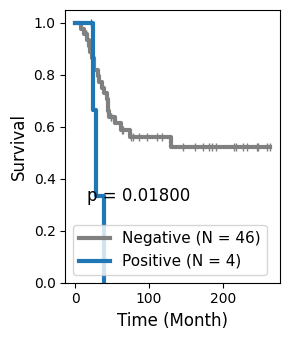

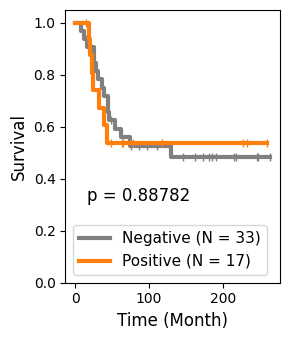

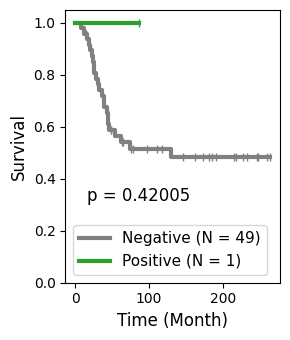

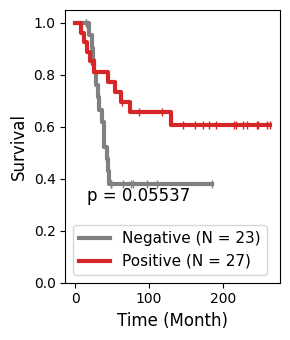

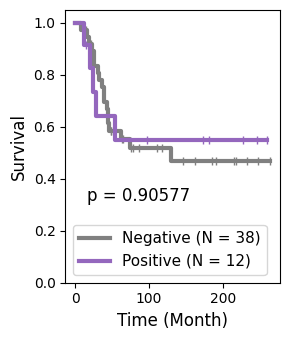

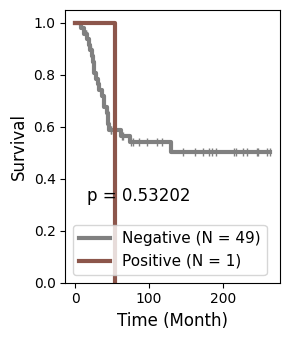

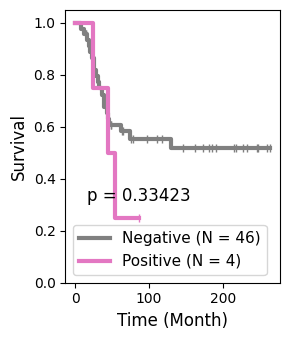

In [21]:
clinical_subtypes_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
clinical_subtypes_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    er = survival_d.loc[survival_d["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_d.loc[survival_d["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_d.loc[survival_d["patientID"] == patient_id, "HER2 Status"].values[
        0
    ]
    if her2 == "Positive":
        clinical_subtypes_discovery[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_discovery),
        np.sum(clinical_subtypes_discovery == "Unknown"),
        np.sum(clinical_subtypes_discovery == "HER2+"),
        np.sum(clinical_subtypes_discovery == "HR+/HER2-"),
        np.sum(clinical_subtypes_discovery == "TNBC"),
    )
)
threshold = 0.01
for clinical_subtype in [ "TNBC"]:
    
    for i in range(len(patient_subgroups_discovery)):
        subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
        characteristic_patterns = patient_subgroups_discovery[i][
            "characteristic_patterns"
        ]
        f, ax = plt.subplots(
        1,
        1,
        figsize=(3, 3.5),
        tight_layout=True,
    )
        proportion = Proportions[:, np.array(characteristic_patterns)].sum(axis=1)
        test = logrank_test(
            np.array(lengths_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(lengths_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
        )
        # if test.p_value > 0.5:
        #     continue

        kmf = KaplanMeierFitter()

        kmf.fit(
            np.array(lengths_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion < threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            label="Negative (N = {})".format(
                np.sum(
                    (proportion < threshold)
                    & (clinical_subtypes_discovery == clinical_subtype)
                )
            ),
        )
        kmf.plot_survival_function(
            ax=ax,
            ci_show=False,
            show_censors=True,
            censor_styles={"ms": 6, "marker": "|"},
            color="grey",
            linewidth=3,
        )
        kmf.fit(
            np.array(lengths_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            np.array(statuses_discovery)[
                (proportion >= threshold)
                & (clinical_subtypes_discovery == clinical_subtype)
            ],
            label="Positive (N = {})".format(
                np.sum(
                    (proportion >= threshold)
                    & (clinical_subtypes_discovery == clinical_subtype)
                )
            ),
        )
        kmf.plot_survival_function(
            ax=ax,
            ci_show=False,
            show_censors=True,
            censor_styles={"ms": 6, "marker": "|"},
            color=color_palette_Bigraph[subgroup_id],
            linewidth=3,
        )

        ax.text(
            0.1,
            0.3,
            "p = {:.5f}".format(test.p_value),
            fontsize=12,
            transform=ax.transAxes,
        )
        ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
        ax.set_xlabel("Time (Month)", fontsize=12)
        ax.set_ylabel("Survival", fontsize=12)
        # ax.set_title(
        #     "Clinical Subtype: {}, Subgroup: {}".format(clinical_subtype, subgroup_id),
        #     fontsize=12,
        # )
        ax.legend(fontsize=11)
    plt.show()

## Fig.12 Correlation between TME patterns and tumor grade.

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:2.305e-01 U_stat=2.358e+03
2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:4.605e-05 U_stat=1.110e+04
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:2.047e-03 U_stat=2.421e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:8.008e-01 U_stat=4.000e+00
2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:7.842e-01 U_stat=1.320e+02
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:2.438e-01 U_stat=3.500e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
    

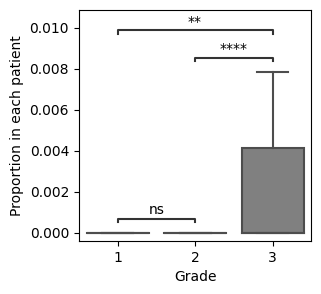

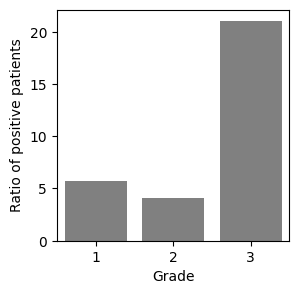

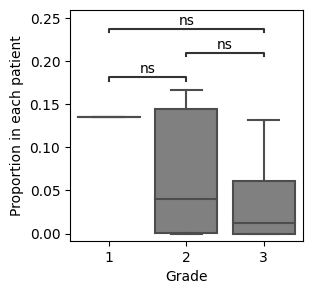

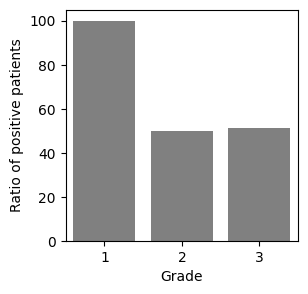

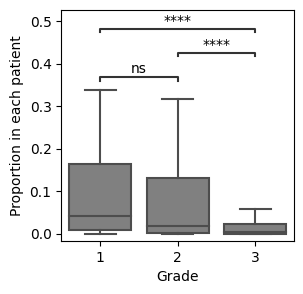

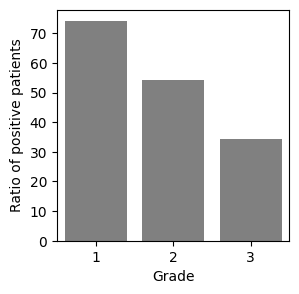

In [131]:
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
patient_ids_discovery = np.array(list(SC_d["patientID"].unique()))

from itertools import combinations

feature_name = "Grade"
feature_list = [1, 2, 3]
compare_list = [(1, 2), (2, 3), (1, 3)]

for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if subgroup_id not in ["S1", "S4", "S7"]:
        continue
    proportion = np.sum(Proportions[:, np.array(characteristic_patterns)], axis=1)
    if subgroup_id == "S4":
        DF_presentation = pd.DataFrame(
        {
            "Proportion": proportion[clinical_subtypes_discovery == "TNBC"],
            feature_name: [
                survival_d.loc[
                    survival_d["patientID"] == patient_id, feature_name
                ].values[0]
                for patient_id in np.array(patient_ids_discovery)[clinical_subtypes_discovery == "TNBC"]
            ],
        }
    )
    else:
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion,
                feature_name: [
                    survival_d.loc[
                        survival_d["patientID"] == patient_id, feature_name
                    ].values[0]
                    for patient_id in patient_ids_discovery
                ],
            }
        )

    DF_presentation = DF_presentation.dropna()
    f, ax = plt.subplots(figsize=(3, 3))
    sns.boxplot(
        x=feature_name,
        y="Proportion",
        data=DF_presentation,
        showfliers=False,
        order=feature_list,
        color = 'grey',


        # order=["HR+/HER2-", "HR+/HER2+", "HR-/HER2+", "TNBC"],
    )
    from statannotations.Annotator import Annotator

    annot = Annotator(
        ax,
        compare_list,
        data=DF_presentation,
        x=feature_name,
        y="Proportion",
        order=feature_list,
    )
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="inside",
        verbose=2,
    )
    annot.apply_test()
    ax, test_results = annot.annotate()

    # ax.set(title = 'Proportion of pattern {} in each grade'.format(pattern_id[0]+1))
    ax.set(ylabel="Proportion in each patient")

    DF_existence = pd.DataFrame(
        {
            feature_name: feature_list,
        }
    )
    for feature in feature_list:
        data = DF_presentation.loc[
            DF_presentation[feature_name] == feature, "Proportion"
        ].values

        exisitence_ratio = np.sum(data > 0.01) / len(data)
        DF_existence.loc[DF_existence[feature_name] == feature, "Existence (%)"] = (
            exisitence_ratio * 100
        )

    f, ax = plt.subplots(figsize=(3,3 ))
    sns.barplot(
        x=feature_name,
        y="Existence (%)",
        data=DF_existence,
        order=feature_list,
        color = 'grey',
    )
    ax.set(ylabel="Ratio of positive patients")

## Fig. 13 Validation of the risk stratification results.

### Fig.13.I Validation on inner-validation set

In [25]:
patient_ids_iv = list(SC_iv["patientID"].unique())
subgroup_ids_iv = np.zeros(len(patient_ids_iv), dtype=object)
subgroup_ids_iv[:] = "Unclassified"
for i in range(len(patient_subgroups_iv)):
    subgroup = patient_subgroups_iv[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_iv[np.isin(patient_ids_iv, patient_ids)] = subgroup_id

#### Fig.13.I.a Population Graph

[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.75, 0, ''),
  Text(-0.5, 0, ''),
  Text(-0.25, 0, ''),
  Text(0.0, 0, ''),
  Text(0.25, 0, ''),
  Text(0.5, 0, ''),
  Text(0.75, 0, ''),
  Text(1.0, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')]]

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)


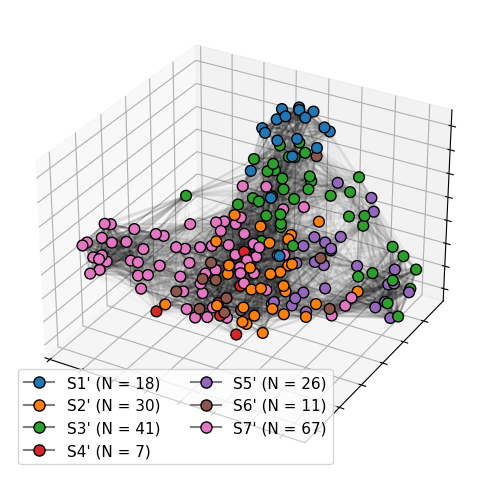

In [80]:
pos = nx.spring_layout(
    population_graph_iv,
    seed=100,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_iv)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in population_graph_iv.edges()])
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i[:-1]] for i in subgroup_ids_iv],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_iv.edges())
edge_alpha = [
    (
        0.2 * population_graph_iv[u][v]["weight"]
        if population_graph_iv[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_iv == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_iv == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_iv:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id[:-1]],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_iv == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

#### Fig.13.I.b Survival plots

Patient subgroup S1': N = 19, HR = 1.86 (0.88-3.92), p = 1.02e-01
Patient subgroup S2': N = 26, HR = 0.82 (0.37-1.80), p = 6.25e-01
Patient subgroup S3': N = 7, HR = 0.38 (0.05-2.75), p = 3.38e-01
Patient subgroup S4': N = 41, HR = 1.65 (0.96-2.85), p = 7.17e-02
Patient subgroup S5': N = 26, HR = 1.02 (0.51-2.07), p = 9.47e-01
Patient subgroup S6': N = 19, HR = 0.86 (0.35-2.16), p = 7.56e-01
Patient subgroup S7': N = 62, HR = 0.65 (0.37-1.14), p = 1.32e-01


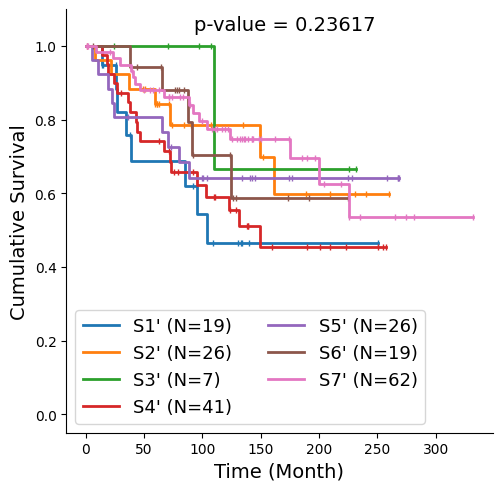

In [40]:
for i in range(len(patient_subgroups_iv)):
    print(
        "Patient subgroup {}: N = {}, HR = {:.2f} ({:.2f}-{:.2f}), p = {:.2e}".format(
            patient_subgroups_iv[i]["subgroup_id"],
            len(patient_subgroups_iv[i]["patient_ids"]),
            patient_subgroups_iv[i]["hr"],
            patient_subgroups_iv[i]["hr_lower"],
            patient_subgroups_iv[i]["hr_upper"],
            patient_subgroups_iv[i]["p"],
        )
    )

lengths_iv = [
    survival_iv.loc[survival_iv["patientID"] == i, "time"].values[0]
    for i in patient_ids_iv
]
statuses_iv = [
    survival_iv.loc[survival_iv["patientID"] == i, "status"].values[0]
    for i in patient_ids_iv
]
kmf = KaplanMeierFitter()
f, ax = plt.subplots(figsize=(5.5, 5.5))
for subgroup in patient_subgroups_iv:
    subgroup_id = subgroup["subgroup_id"]
    length_A, event_observed_A = (
        np.array(lengths_iv)[subgroup_ids_iv == subgroup_id],
        np.array(statuses_iv)[subgroup_ids_iv == subgroup_id],
    )
    label = "{} (N={})".format(
        subgroup["subgroup_id"], np.sum(subgroup_ids_iv == subgroup_id)
    )
    kmf.fit(length_A, event_observed_A, label=label)
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        color=color_palette_Bigraph[subgroup_id[:-1]],
        show_censors=True,
        linewidth=2,
        censor_styles={"ms": 5, "marker": "|"},
    )
log_rank_test = multivariate_logrank_test(
    np.array(lengths_iv)[subgroup_ids_iv != 0],
    np.array(subgroup_ids_iv)[subgroup_ids_iv != 0],
    np.array(statuses_iv)[subgroup_ids_iv != 0],
)
p_value = log_rank_test.p_value
ax.legend(ncol=2, fontsize=13)
ax.text(
    x=0.3,
    y=0.95,
    s="p-value = {:.5f}".format(p_value),
    fontsize=14,
    transform=ax.transAxes,
)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.1),
)
sns.despine()

#### Fig.13.I.c Hazard ratios

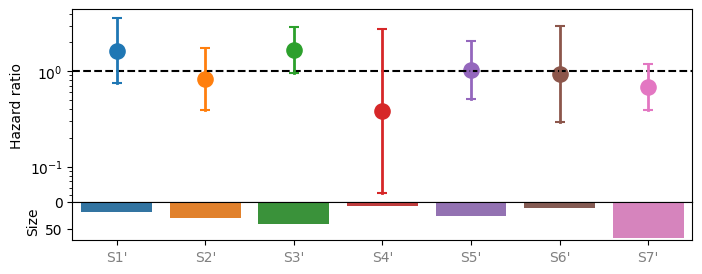

In [82]:
# Plot hazard ratio
f, ax = plt.subplots(2, 1, height_ratios=[5, 1], figsize=(8, 3), sharex=True)
f.subplots_adjust(hspace=0)
ax[0].hlines(1, -1, len(patient_subgroups_iv), color="k", linestyle="--")
N, xticklabels, xtickcolors = [], [], []
for i in range(len(patient_subgroups_iv)):
    subgroup = patient_subgroups_iv[i]
    subgroup_id = subgroup["subgroup_id"]
    hr, hr_lb, hr_ub, p = (
        subgroup["hr"],
        subgroup["hr_lower"],
        subgroup["hr_upper"],
        subgroup["p"],
    )
    ax[0].plot(
        [i, i],
        [hr_lb, hr_ub],
        color=color_palette_Bigraph[subgroup_id[:-1]],
        linewidth=2,
    )
    ax[0].scatter([i], [hr], color=color_palette_Bigraph[subgroup_id[:-1]], s=120)
    ax[0].scatter(
        [i], [hr_lb], color=color_palette_Bigraph[subgroup_id[:-1]], s=60, marker="_"
    )
    ax[0].scatter(
        [i], [hr_ub], color=color_palette_Bigraph[subgroup_id[:-1]], s=60, marker="_"
    )
    N.append(np.sum(subgroup_ids_iv == subgroup_id))
    xticklabels.append("{}".format(subgroup_id))
    if p < 0.05:
        xtickcolors.append("k")
    else:
        xtickcolors.append("grey")
ax[0].set_xticks(range(len(patient_subgroups_iv)))
ax[0].set_xticklabels(xticklabels)
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[0].set_xlabel("Patient Subgroups")
ax[0].set_ylabel("Hazard ratio")
ax[0].set_yscale("log")
DF = pd.DataFrame({"N": N, "subgroup_id": xticklabels})
g = sns.barplot(
    data=DF,
    x="subgroup_id",
    y="N",
    palette={key + "'": value for key, value in color_palette_Bigraph.items()},
    ax=ax[1],
)
g.invert_yaxis()
ax[1].set_ylabel("Size")
ax[1].set_xlabel("")
plt.show()

### Fig.13.E Validation on external-validation set

In [83]:
patient_ids_ev = list(SC_ev["patientID"].unique())
subgroup_ids_ev = np.zeros(len(patient_ids_ev), dtype=object)
subgroup_ids_ev[:] = "Unclassified"
for i in range(len(patient_subgroups_ev)):
    subgroup = patient_subgroups_ev[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_ev[np.isin(patient_ids_ev, patient_ids)] = subgroup_id

#### Fig.13.E.a Population Graph

[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.75, 0, ''),
  Text(-0.5, 0, ''),
  Text(-0.25, 0, ''),
  Text(0.0, 0, ''),
  Text(0.25, 0, ''),
  Text(0.5, 0, ''),
  Text(0.75, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.75, 0, ''),
  Text(-0.5, 0, ''),
  Text(-0.25, 0, ''),
  Text(0.0, 0, ''),
  Text(0.25, 0, ''),
  Text(0.5, 0, ''),
  Text(0.75, 0, ''),
  Text(1.0, 0, '')]]

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)


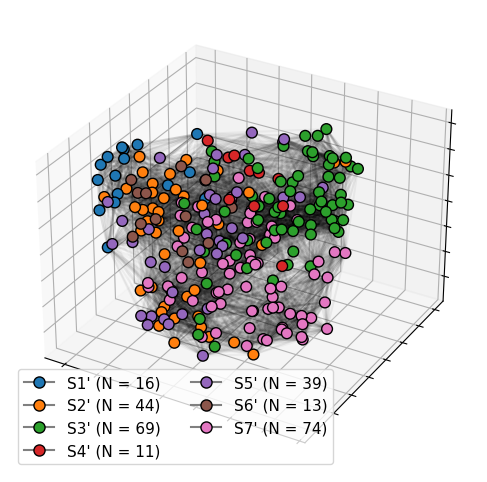

In [84]:
pos = nx.spring_layout(
    population_graph_ev,
    seed=1,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_ev)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in population_graph_ev.edges()])
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i[:-1]] for i in subgroup_ids_ev],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_ev.edges())
edge_alpha = [
    (
        0.2 * population_graph_ev[u][v]["weight"]
        if population_graph_ev[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_ev == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_ev == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_ev:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id[:-1]],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_ev == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2, loc="lower left")
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

#### Fig.13.E.b Survival Plots

Patient subgroup S1': N = 16, HR = 3.03 (1.59-5.75), p = 7.24e-04
Patient subgroup S2': N = 44, HR = 1.56 (0.92-2.65), p = 1.00e-01
Patient subgroup S3': N = 69, HR = 0.67 (0.37-1.22), p = 1.89e-01
Patient subgroup S4': N = 11, HR = 0.81 (0.26-2.59), p = 7.28e-01
Patient subgroup S5': N = 39, HR = 0.89 (0.46-1.74), p = 7.38e-01
Patient subgroup S6': N = 13, HR = 1.18 (0.43-3.23), p = 7.49e-01
Patient subgroup S7': N = 74, HR = 0.65 (0.38-1.11), p = 1.19e-01


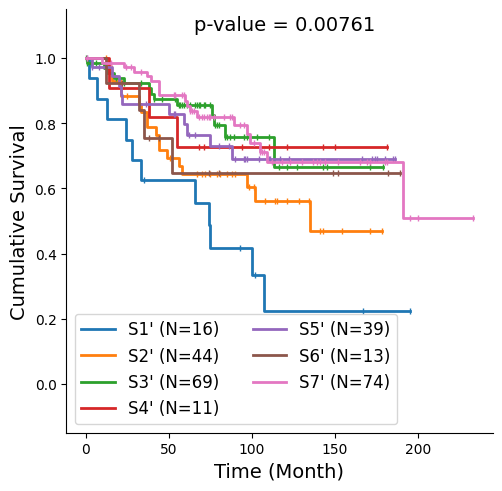

In [85]:
for i in range(len(patient_subgroups_ev)):
    print(
        "Patient subgroup {}: N = {}, HR = {:.2f} ({:.2f}-{:.2f}), p = {:.2e}".format(
            patient_subgroups_ev[i]["subgroup_id"],
            len(patient_subgroups_ev[i]["patient_ids"]),
            patient_subgroups_ev[i]["hr"],
            patient_subgroups_ev[i]["hr_lower"],
            patient_subgroups_ev[i]["hr_upper"],
            patient_subgroups_ev[i]["p"],
        )
    )

lengths_ev = [
    survival_ev.loc[survival_ev["patientID"] == i, "time"].values[0]
    for i in patient_ids_ev
]
statuses_ev = [
    survival_ev.loc[survival_ev["patientID"] == i, "status"].values[0]
    for i in patient_ids_ev
]
kmf = KaplanMeierFitter()
f, ax = plt.subplots(figsize=(5.5, 5.5))
for subgroup in patient_subgroups_ev:
    subgroup_id = subgroup["subgroup_id"]
    length_A, event_observed_A = (
        np.array(lengths_ev)[subgroup_ids_ev == subgroup_id],
        np.array(statuses_ev)[subgroup_ids_ev == subgroup_id],
    )
    label = "{} (N={})".format(
        subgroup["subgroup_id"], np.sum(subgroup_ids_ev == subgroup_id)
    )
    kmf.fit(length_A, event_observed_A, label=label)
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        color=color_palette_Bigraph[subgroup_id[:-1]],
        show_censors=True,
        linewidth=2,
        censor_styles={"ms": 5, "marker": "|"},
    )
log_rank_test = multivariate_logrank_test(
    np.array(lengths_ev)[subgroup_ids_ev != 0],
    np.array(subgroup_ids_ev)[subgroup_ids_ev != 0],
    np.array(statuses_ev)[subgroup_ids_ev != 0],
)
p_value = log_rank_test.p_value
ax.legend(ncol=2, fontsize=12, loc="lower left")
ax.text(
    x=0.3,
    y=0.95,
    s="p-value = {:.5f}".format(p_value),
    fontsize=14,
    transform=ax.transAxes,
)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.15, 1.15),
)
sns.despine()

#### Fig.13.E.c Hazard ratios

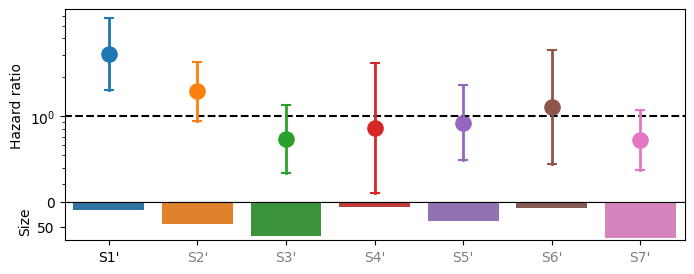

In [86]:
# Plot hazard ratio
f, ax = plt.subplots(2, 1, height_ratios=[5, 1], figsize=(8, 3), sharex=True)
f.subplots_adjust(hspace=0)
ax[0].hlines(1, -1, len(patient_subgroups_ev), color="k", linestyle="--")
N, xticklabels, xtickcolors = [], [], []
for i in range(len(patient_subgroups_ev)):
    subgroup = patient_subgroups_ev[i]
    subgroup_id = subgroup["subgroup_id"]
    hr, hr_lb, hr_ub, p = (
        subgroup["hr"],
        subgroup["hr_lower"],
        subgroup["hr_upper"],
        subgroup["p"],
    )
    ax[0].plot(
        [i, i],
        [hr_lb, hr_ub],
        color=color_palette_Bigraph[subgroup_id[:-1]],
        linewidth=2,
    )
    ax[0].scatter([i], [hr], color=color_palette_Bigraph[subgroup_id[:-1]], s=120)
    ax[0].scatter(
        [i], [hr_lb], color=color_palette_Bigraph[subgroup_id[:-1]], s=60, marker="_"
    )
    ax[0].scatter(
        [i], [hr_ub], color=color_palette_Bigraph[subgroup_id[:-1]], s=60, marker="_"
    )
    N.append(np.sum(subgroup_ids_ev == subgroup_id))
    xticklabels.append("{}".format(subgroup_id))
    if p < 0.05:
        xtickcolors.append("k")
    else:
        xtickcolors.append("grey")
ax[0].set_xticks(range(len(patient_subgroups_ev)))
ax[0].set_xticklabels(xticklabels)
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[0].set_xlabel("Patient Subgroups")
ax[0].set_ylabel("Hazard ratio")
ax[0].set_yscale("log")
DF = pd.DataFrame({"N": N, "subgroup_id": xticklabels})
g = sns.barplot(
    data=DF,
    x="subgroup_id",
    y="N",
    palette={key + "'": value for key, value in color_palette_Bigraph.items()},
    ax=ax[1],
)
g.invert_yaxis()
ax[1].set_ylabel("Size")
ax[1].set_xlabel("")
plt.show()

### Additional External validaiton set (TNBC)

#### Baseline

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


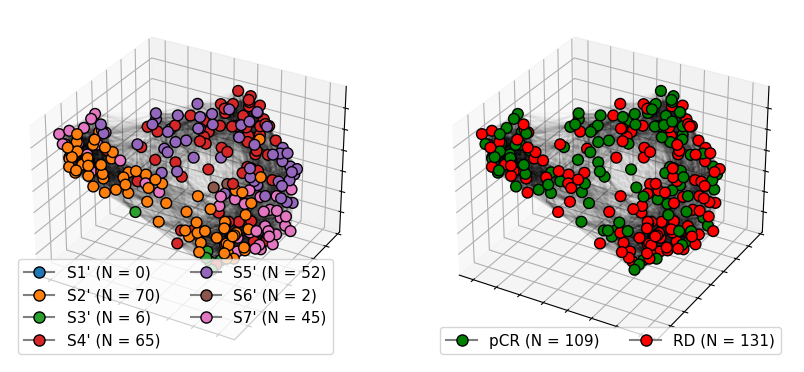

In [39]:
patient_ids_ev_tnbc_baseline = list(SC_ev_tnbc_baseline["patientID"].unique())
subgroup_ids_ev_tnbc_baseline= np.zeros(len(patient_ids_ev_tnbc_baseline), dtype=object)
subgroup_ids_ev_tnbc_baseline[:] = "Unclassified"
for i in range(len(patient_subgroups_ev_tnbc_baseline)):
    subgroup = patient_subgroups_ev_tnbc_baseline[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_ev_tnbc_baseline[np.isin(patient_ids_ev_tnbc_baseline, patient_ids)] = subgroup_id
response_baseline = [
    survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "pCR"].values[0]
    for i in patient_ids_ev_tnbc_baseline
]

pos = nx.spring_layout(
    population_graph_ev_tnbc_baseline,
    seed=1,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(10, 5), tight_layout=True)
ax = fig.add_subplot(121, projection="3d")
ax1 = fig.add_subplot(122, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_ev_tnbc_baseline)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in population_graph_ev_tnbc_baseline.edges()])
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i[:-1]] for i in subgroup_ids_ev_tnbc_baseline],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
ax1.scatter(
    *node_xyz.T,
    s=60,
    c=['red' if i=='RD' else 'green' for i in response_baseline],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_ev_tnbc_baseline.edges())
edge_alpha = [
    (
        0.2 * population_graph_ev_tnbc_baseline[u][v]["weight"]
        if population_graph_ev_tnbc_baseline[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")
    ax1.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
ax1.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_ev_tnbc_baseline == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_ev_tnbc_baseline == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_ev_tnbc_baseline:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id[:-1]],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_ev_tnbc_baseline == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2, loc="lower left")
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

handles = []
if np.sum(response_baseline == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(response_baseline == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for response in ["pCR", "RD"]:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor='red' if response == "RD" else 'green',
            label="{} (N = {})".format(
                response, np.sum(np.array(response_baseline) == response)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax1.legend(handles=handles, fontsize=11, ncols=2, loc="lower left")
ax1.set(yticklabels=[], xticklabels=[], zticklabels=[])
plt.show()

131 0
Response: RD, Subgroup: S1', correlation_coefficient: nan, p_val: nan
131 70
Response: RD, Subgroup: S2', correlation_coefficient: 0.09, p_val: 1.73e-01
131 6
Response: RD, Subgroup: S3', correlation_coefficient: 0.04, p_val: 5.49e-01
131 65
Response: RD, Subgroup: S4', correlation_coefficient: -0.08, p_val: 1.93e-01
131 52
Response: RD, Subgroup: S5', correlation_coefficient: -0.05, p_val: 4.55e-01
131 2
Response: RD, Subgroup: S6', correlation_coefficient: -0.01, p_val: 8.97e-01
131 45
Response: RD, Subgroup: S7', correlation_coefficient: 0.03, p_val: 6.35e-01
109 0
Response: pCR, Subgroup: S1', correlation_coefficient: nan, p_val: nan
109 70
Response: pCR, Subgroup: S2', correlation_coefficient: -0.09, p_val: 1.73e-01
109 6
Response: pCR, Subgroup: S3', correlation_coefficient: -0.04, p_val: 5.49e-01
109 65
Response: pCR, Subgroup: S4', correlation_coefficient: 0.08, p_val: 1.93e-01
109 52
Response: pCR, Subgroup: S5', correlation_coefficient: 0.05, p_val: 4.55e-01
109 2
Respo

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


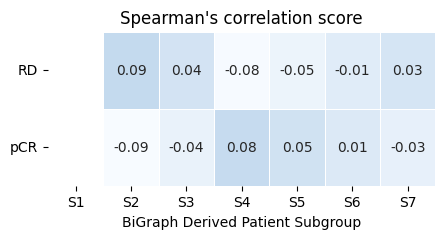

In [54]:
import numpy as np

spearmanr_corr = np.zeros((2, 7))
P_value = np.zeros((2, 7))
for i in range(2):
    response = ["RD", 'pCR'][i]
    for j in range(7):
        subgroup_id = ["S1'", "S2'", "S3'", "S4'", "S5'", "S6'", "S7'"][j]
        variable_1 = np.array(response_baseline) == response
        variable_2 = np.array(subgroup_ids_ev_tnbc_baseline) == subgroup_id
        print(np.sum(variable_1), np.sum(variable_2))
        correlation_coefficient, p_value = spearmanr(variable_1, variable_2)
        print(
            "Response: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
                response, subgroup_id, correlation_coefficient, p_value
            )
        )
        spearmanr_corr[i, j] = correlation_coefficient
        P_value[i, j] = p_value
        if p_value < 0.05 / (3 * 7):
            print(
                "Clinical Subtype: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
                    clinical_subtype, subgroup_id, correlation_coefficient, p_value
                )
            )

f, ax = plt.subplots(figsize=(5, 2))
sns.heatmap(
    spearmanr_corr,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=False,
    linewidths=0.5,
    linecolor="white",
    ax=ax,
    vmax=0.6,
)

ax.set_xlabel("BiGraph Derived Patient Subgroup")
# ax.set_ylabel("Clinical Subtype")
ax.set_xticklabels(["S1", "S2", "S3", "S4", "S5", "S6", "S7"], rotation=0)
ax.set_yticklabels(
    [
        "RD",
        "pCR",
    ],
    rotation=0,
)
ax.set(title="Spearman's correlation score")
plt.show()

#### On-treatment

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


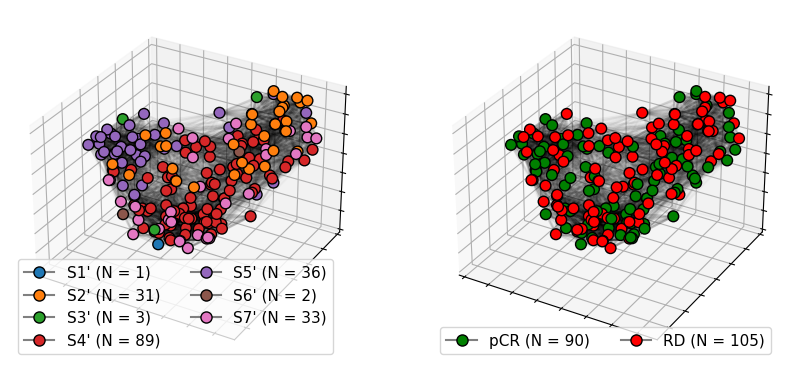

In [41]:
patient_ids_ev_tnbc_ot = list(SC_ev_tnbc_ot["patientID"].unique())
subgroup_ids_ev_tnbc_ot= np.zeros(len(patient_ids_ev_tnbc_ot), dtype=object)
subgroup_ids_ev_tnbc_ot[:] = "Unclassified"
for i in range(len(patient_subgroups_ev_tnbc_ot)):
    subgroup = patient_subgroups_ev_tnbc_ot[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_ev_tnbc_ot[np.isin(patient_ids_ev_tnbc_ot, patient_ids)] = subgroup_id
response_ot = [
    survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "pCR"].values[0]
    for i in patient_ids_ev_tnbc_ot
]

pos = nx.spring_layout(
    population_graph_ev_tnbc_ot,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(10, 5), tight_layout=True)
ax = fig.add_subplot(121, projection="3d")
ax1 = fig.add_subplot(122, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_ev_tnbc_ot)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in population_graph_ev_tnbc_ot.edges()])
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i[:-1]] for i in subgroup_ids_ev_tnbc_ot],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
ax1.scatter(
    *node_xyz.T,
    s=60,
    c=['red' if i=='RD' else 'green' for i in response_ot],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_ev_tnbc_ot.edges())
edge_alpha = [
    (
        0.2 * population_graph_ev_tnbc_ot[u][v]["weight"]
        if population_graph_ev_tnbc_ot[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")
    ax1.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
ax1.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_ev_tnbc_ot == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_ev_tnbc_ot == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_ev_tnbc_baseline:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id[:-1]],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_ev_tnbc_ot == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=11, ncols=2, loc="lower left")
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

handles = []
if np.sum(response_ot == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(response_ot == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for response in ["pCR", "RD"]:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor='red' if response == "RD" else 'green',
            label="{} (N = {})".format(
                response, np.sum(np.array(response_ot) == response)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax1.legend(handles=handles, fontsize=11, ncols=2, loc="lower left")
ax1.set(yticklabels=[], xticklabels=[], zticklabels=[])
plt.show()

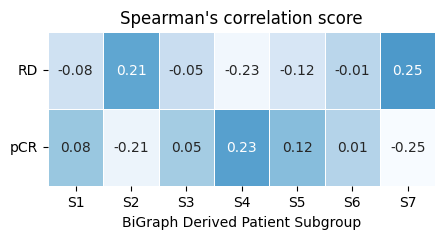

In [56]:
import numpy as np

spearmanr_corr = np.zeros((2, 7))
P_value = np.zeros((2, 7))
for i in range(2):
    response = ["RD", 'pCR'][i]
    for j in range(7):
        subgroup_id = ["S1'", "S2'", "S3'", "S4'", "S5'", "S6'", "S7'"][j]
        variable_1 = np.array(response_ot) == response
        variable_2 = np.array(subgroup_ids_ev_tnbc_ot) == subgroup_id
        
        correlation_coefficient, p_value = spearmanr(variable_1, variable_2)
        spearmanr_corr[i, j] = correlation_coefficient
        P_value[i, j] = p_value
        # if p_value < 0.05 / (3 * 7):
        #     print(
        #         "Clinical Subtype: {}, Subgroup: {}, correlation_coefficient: {:.2f}, p_val: {:.2e}".format(
        #             clinical_subtype, subgroup_id, correlation_coefficient, p_value
        #         )
        #     )

f, ax = plt.subplots(figsize=(5, 2))
sns.heatmap(
    spearmanr_corr,
    annot=True,
    fmt=".2f",
    cmap="Blues",
    cbar=False,
    linewidths=0.5,
    linecolor="white",
    ax=ax,
    vmax=0.6,
)

ax.set_xlabel("BiGraph Derived Patient Subgroup")
# ax.set_ylabel("Clinical Subtype")
ax.set_xticklabels(["S1", "S2", "S3", "S4", "S5", "S6", "S7"], rotation=0)
ax.set_yticklabels(
    [
        "RD",
        "pCR",
    ],
    rotation=0,
)
ax.set(title="Spearman's correlation score")
plt.show()

## Fig. 14 Validation of the enhancement of risk stratification 

### Fig.14.I Inner-validation set

In [136]:
patient_ids_iv = list(SC_iv["patientID"].unique())
subgroup_ids_iv = np.zeros(len(patient_ids_iv), dtype=object)
subgroup_ids_iv[:] = "Unclassified"
for i in range(len(patient_subgroups_iv)):
    subgroup = patient_subgroups_iv[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_iv[np.isin(patient_ids_iv, patient_ids)] = subgroup_id

lengths_iv = [
    survival_iv.loc[survival_iv["patientID"] == i, "time"].values[0]
    for i in patient_ids_iv
]
statuses_iv = [
    survival_iv.loc[survival_iv["patientID"] == i, "status"].values[0]
    for i in patient_ids_iv
]

clinical_subtypes_iv = np.zeros(len(patient_ids_iv), dtype=object)
clinical_subtypes_iv[:] = "Unknown"
for i in range(len(patient_ids_iv)):
    patient_id = patient_ids_iv[i]
    er = survival_iv.loc[survival_iv["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_iv.loc[survival_iv["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_iv.loc[
        survival_iv["patientID"] == patient_id, "HER2 Status"
    ].values[0]
    if her2 == "Positive":
        clinical_subtypes_iv[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_iv[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_iv[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_iv),
        np.sum(clinical_subtypes_iv == "Unknown"),
        np.sum(clinical_subtypes_iv == "HER2+"),
        np.sum(clinical_subtypes_iv == "HR+/HER2-"),
        np.sum(clinical_subtypes_iv == "TNBC"),
    )
)

200 patients in total, 24 Unkonw, 29 HER2+, 116 HR+/HER2-, 31 TNBC


#### Fig.14.I.a HER2+ and S1'

     test_statistic         p  -log2(p)
1 2        9.365519  0.002211  8.821050
  3        0.417797  0.518038  0.948869
2 3        2.039883  0.153221  2.706310


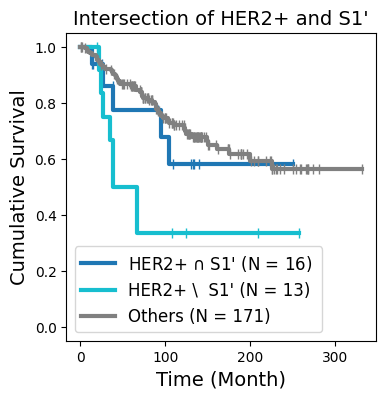

In [88]:
clinical_subtype = "HER2+"
subgroup_id = "S1'"
lengths_iv = np.array(lengths_iv)
statuses_iv = np.array(statuses_iv)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_iv == subgroup_id) & (
    clinical_subtypes_iv == clinical_subtype
)
length_A, event_observed_A = (
    lengths_iv[Indices_A],
    statuses_iv[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id[:-1]],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_iv != subgroup_id) & (
    clinical_subtypes_iv == clinical_subtype
)
length_C, event_observed_C = (
    lengths_iv[Indices_C],
    statuses_iv[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_iv != clinical_subtype
length_B, event_observed_B = (
    lengths_iv[Indices_B],
    statuses_iv[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_iv, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_iv == clinical_subtype)) & (subgroup_ids_iv != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_iv == clinical_subtype)) & (subgroup_ids_iv == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_iv,
    groups,
    statuses_iv,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

#### Fig.14.I.b TNBC and S2'

     test_statistic         p  -log2(p)
1 2        1.156851  0.282120  1.825621
  3        0.028358  0.866270  0.207112
2 3        0.619989  0.431052  1.214068


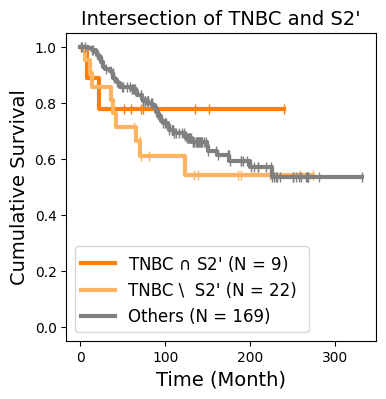

In [89]:
clinical_subtype = "TNBC"
subgroup_id = "S2'"
lengths_iv = np.array(lengths_iv)
statuses_iv = np.array(statuses_iv)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_iv == subgroup_id) & (
    clinical_subtypes_iv == clinical_subtype
)
length_A, event_observed_A = (
    lengths_iv[Indices_A],
    statuses_iv[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id[:-1]],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_iv != subgroup_id) & (
    clinical_subtypes_iv == clinical_subtype
)
length_C, event_observed_C = (
    lengths_iv[Indices_C],
    statuses_iv[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_iv != clinical_subtype
length_B, event_observed_B = (
    lengths_iv[Indices_B],
    statuses_iv[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_iv, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_iv == clinical_subtype)) & (subgroup_ids_iv != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_iv == clinical_subtype)) & (subgroup_ids_iv == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_iv,
    groups,
    statuses_iv,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

#### Fig.14.I.a HR+/HER2- and S7'

     test_statistic         p  -log2(p)
1 2        8.209400  0.004167  7.906639
  3        7.153855  0.007480  7.062687
2 3        0.120046  0.728984  0.456040


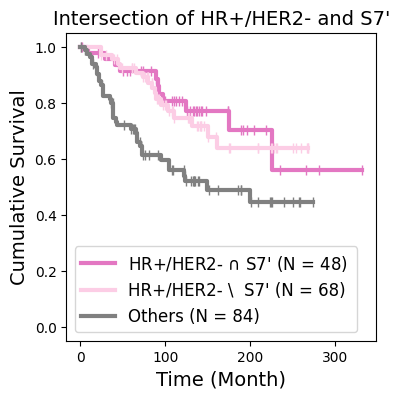

In [90]:
clinical_subtype = "HR+/HER2-"
subgroup_id = "S7'"
lengths_iv = np.array(lengths_iv)
statuses_iv = np.array(statuses_iv)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_iv == subgroup_id) & (
    clinical_subtypes_iv == clinical_subtype
)
length_A, event_observed_A = (
    lengths_iv[Indices_A],
    statuses_iv[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id[:-1]],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_iv != subgroup_id) & (
    clinical_subtypes_iv == clinical_subtype
)
length_C, event_observed_C = (
    lengths_iv[Indices_C],
    statuses_iv[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_iv != clinical_subtype
length_B, event_observed_B = (
    lengths_iv[Indices_B],
    statuses_iv[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_iv, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_iv == clinical_subtype)) & (subgroup_ids_iv != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_iv == clinical_subtype)) & (subgroup_ids_iv == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_iv,
    groups,
    statuses_iv,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

### Fig.14.E External-validation set

In [91]:
patient_ids_ev = list(SC_ev["patientID"].unique())
subgroup_ids_ev = np.zeros(len(patient_ids_ev), dtype=object)
subgroup_ids_ev[:] = "Unclassified"
for i in range(len(patient_subgroups_ev)):
    subgroup = patient_subgroups_ev[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_ev[np.isin(patient_ids_ev, patient_ids)] = subgroup_id

lengths_ev = [
    survival_ev.loc[survival_ev["patientID"] == i, "time"].values[0]
    for i in patient_ids_ev
]
statuses_ev = [
    survival_ev.loc[survival_ev["patientID"] == i, "status"].values[0]
    for i in patient_ids_ev
]

clinical_subtypes_ev = np.zeros(len(patient_ids_ev), dtype=object)
clinical_subtypes_ev[:] = "Unknown"
for i in range(len(patient_ids_ev)):
    patient_id = patient_ids_ev[i]
    er = survival_ev.loc[survival_ev["patientID"] == patient_id, "ERStatus"].values[0]
    pr = survival_ev.loc[survival_ev["patientID"] == patient_id, "PRStatus"].values[0]
    her2 = survival_ev.loc[survival_ev["patientID"] == patient_id, "HER2Status"].values[
        0
    ]
    if her2 == "positive":
        clinical_subtypes_ev[i] = "HER2+"  # Her2+
    if (er == "positive" or pr == "positive") and her2 == "negative":
        clinical_subtypes_ev[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "negative" and pr == "negative") and her2 == "negative":
        clinical_subtypes_ev[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_iv),
        np.sum(clinical_subtypes_ev == "Unknown"),
        np.sum(clinical_subtypes_ev == "HER2+"),
        np.sum(clinical_subtypes_ev == "HR+/HER2-"),
        np.sum(clinical_subtypes_ev == "TNBC"),
    )
)

200 patients in total, 1 Unkonw, 47 HER2+, 173 HR+/HER2-, 45 TNBC


#### Fig.14.E.a HER2+ and S1'

     test_statistic         p  -log2(p)
1 2        0.097256  0.755147  0.405170
  3        2.583070  0.108012  3.210737
2 3        1.905317  0.167484  2.577901


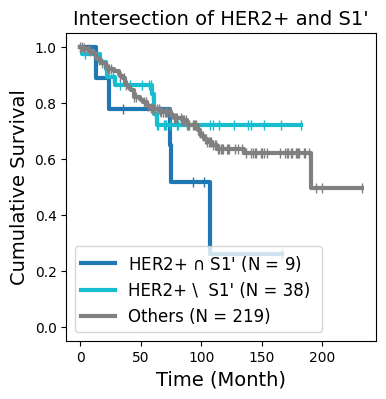

In [92]:
clinical_subtype = "HER2+"
subgroup_id = "S1'"
lengths_ev = np.array(lengths_ev)
statuses_ev = np.array(statuses_ev)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_ev == subgroup_id) & (
    clinical_subtypes_ev == clinical_subtype
)
length_A, event_observed_A = (
    lengths_ev[Indices_A],
    statuses_ev[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id[:-1]],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_ev != subgroup_id) & (
    clinical_subtypes_ev == clinical_subtype
)
length_C, event_observed_C = (
    lengths_ev[Indices_C],
    statuses_ev[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_ev != clinical_subtype
length_B, event_observed_B = (
    lengths_ev[Indices_B],
    statuses_ev[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_ev, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_ev == clinical_subtype)) & (subgroup_ids_ev != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_ev == clinical_subtype)) & (subgroup_ids_ev == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_ev,
    groups,
    statuses_ev,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

#### Fig.14.E.b TNBC and S2'

     test_statistic         p   -log2(p)
1 2        4.830528  0.027960   5.160488
  3       11.360074  0.000750  10.380056
2 3        1.549866  0.213155   2.230024


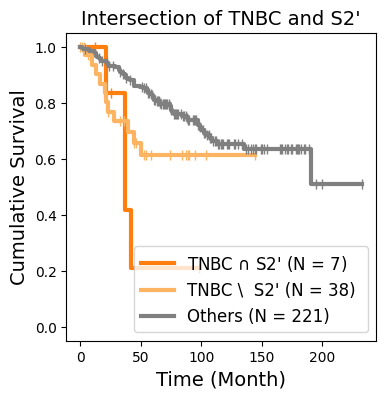

In [93]:
clinical_subtype = "TNBC"
subgroup_id = "S2'"
lengths_ev = np.array(lengths_ev)
statuses_ev = np.array(statuses_ev)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_ev == subgroup_id) & (
    clinical_subtypes_ev == clinical_subtype
)
length_A, event_observed_A = (
    lengths_ev[Indices_A],
    statuses_ev[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id[:-1]],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_ev != subgroup_id) & (
    clinical_subtypes_ev == clinical_subtype
)
length_C, event_observed_C = (
    lengths_ev[Indices_C],
    statuses_ev[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_ev != clinical_subtype
length_B, event_observed_B = (
    lengths_ev[Indices_B],
    statuses_ev[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_ev, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_ev == clinical_subtype)) & (subgroup_ids_ev != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_ev == clinical_subtype)) & (subgroup_ids_ev == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_ev,
    groups,
    statuses_ev,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

#### Fig.14.E.c HR+/HER2- and S7'

     test_statistic         p  -log2(p)
1 2        2.189188  0.138983  2.847025
  3        6.288181  0.012155  6.362357
2 3        1.714386  0.190417  2.392764


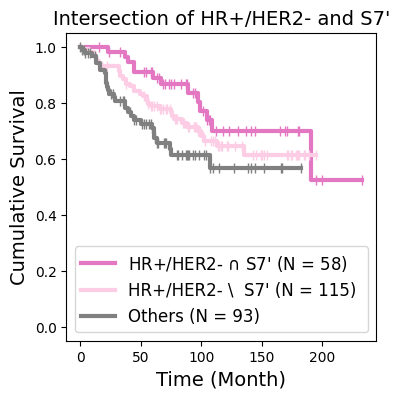

In [94]:
clinical_subtype = "HR+/HER2-"
subgroup_id = "S7'"
lengths_ev = np.array(lengths_ev)
statuses_ev = np.array(statuses_ev)
f, ax = plt.subplots(figsize=(4, 4))
kmf = KaplanMeierFitter()
Indices_A = (subgroup_ids_ev == subgroup_id) & (
    clinical_subtypes_ev == clinical_subtype
)
length_A, event_observed_A = (
    lengths_ev[Indices_A],
    statuses_ev[Indices_A],
)
label = r"{} $\cap$ {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_A))
kmf.fit(length_A, event_observed_A, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_Bigraph[subgroup_id[:-1]],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
    label=label,
)

Indices_C = (subgroup_ids_ev != subgroup_id) & (
    clinical_subtypes_ev == clinical_subtype
)
length_C, event_observed_C = (
    lengths_ev[Indices_C],
    statuses_ev[Indices_C],
)
label = r"{} \  {} (N = {}) ".format(clinical_subtype, subgroup_id, len(length_C))
kmf.fit(length_C, event_observed_C, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color=color_palette_clinical[clinical_subtype],
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    markerfacecolor="grey",
    linewidth=3,
)

Indices_B = clinical_subtypes_ev != clinical_subtype
length_B, event_observed_B = (
    lengths_ev[Indices_B],
    statuses_ev[Indices_B],
)
label = r"Others (N = {})".format(len(length_B))
kmf.fit(length_B, event_observed_B, label=label)
kmf.plot_survival_function(
    ax=ax,
    ci_show=False,
    color="grey",
    show_censors=True,
    censor_styles={"ms": 7, "marker": "|"},
    linewidth=3,
    label=label,
)


groups = np.zeros_like(clinical_subtypes_ev, dtype=int)
groups[:] = 1
groups[
    ((clinical_subtypes_ev == clinical_subtype)) & (subgroup_ids_ev != subgroup_id)
] = 2
groups[
    ((clinical_subtypes_ev == clinical_subtype)) & (subgroup_ids_ev == subgroup_id)
] = 3


log_rank_test = pairwise_logrank_test(
    lengths_ev,
    groups,
    statuses_ev,
)
print(log_rank_test.summary)


ax.legend(fontsize=12)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
ax.set_title(
    "Intersection of {} and {}".format(clinical_subtype, subgroup_id), fontsize=14
)
plt.show()

## Fig. 15 Validation of the prognostic impacts of TME patterns

### Fig.15.I Inner-validation set

In [27]:
patient_ids_iv = list(SC_iv["patientID"].unique())
proportions_iv = histograms_iv / np.sum(histograms_iv, axis=1, keepdims=True)
lengths_iv = [
    survival_iv.loc[survival_iv["patientID"] == i, "time"].values[0]
    for i in patient_ids_iv
]
statuses_iv = [
    survival_iv.loc[survival_iv["patientID"] == i, "status"].values[0]
    for i in patient_ids_iv
]

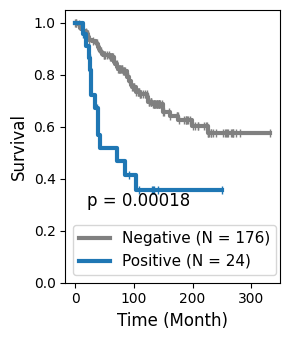

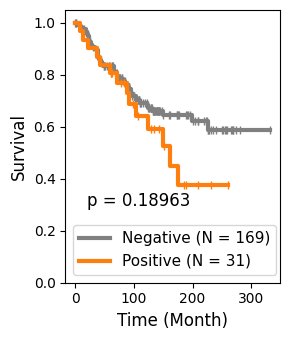

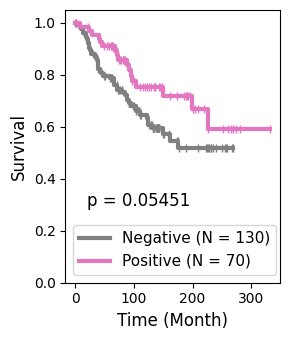

In [36]:
threshold = 0.01
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    if subgroup_id not in ["S1", "S2", "S7"]:
        continue
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    f, ax = plt.subplots(figsize=(3, 3.5), tight_layout=True)
    proportion = proportions_iv[:, np.array(characteristic_patterns)].sum(axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(
        np.array(lengths_iv)[proportion < threshold],
        np.array(statuses_iv)[proportion < threshold],
        label="Negative (N = {})".format(np.sum(proportion < threshold)),
    )
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color="grey",
        linewidth=3,
    )
    kmf.fit(
        np.array(lengths_iv)[(proportion >= threshold)],
        np.array(statuses_iv)[(proportion >= threshold)],
        label="Positive (N = {})".format(np.sum((proportion >= threshold))),
    )
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color=color_palette_Bigraph[subgroup_id],
        linewidth=3,
    )
    test = logrank_test(
        np.array(lengths_iv)[proportion <= threshold],
        np.array(lengths_iv)[(proportion > threshold)],
        np.array(statuses_iv)[proportion <= threshold],
        np.array(statuses_iv)[(proportion > threshold)],
    )
    ax.text(
        0.1,
        0.28,
        "p = {:.5f}".format(test.p_value),
        fontsize=12,
        transform=ax.transAxes,
    )
    ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
    ax.set_xlabel("Time (Month)", fontsize=12)
    ax.set_ylabel("Survival", fontsize=12)
    ax.legend(fontsize=11)
    plt.show()



200 patients in total, 24 Unkonw, 29 HER2+, 116 HR+/HER2-, 31 TNBC


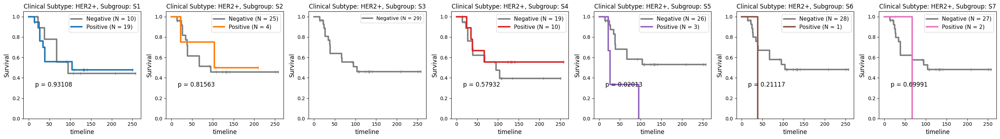

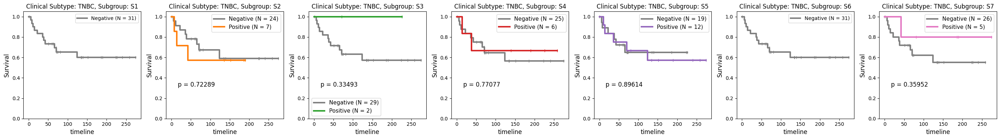

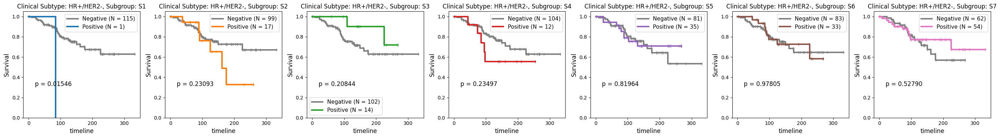

In [29]:
clinical_subtypes_clinical_subtypes_iv = np.zeros(len(patient_ids_iv), dtype=object)
clinical_subtypes_iv[:] = "Unknown"
for i in range(len(patient_ids_iv)):
    patient_id = patient_ids_iv[i]
    er = survival_iv.loc[survival_iv["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_iv.loc[survival_iv["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_iv.loc[
        survival_iv["patientID"] == patient_id, "HER2 Status"
    ].values[0]
    if her2 == "Positive":
        clinical_subtypes_iv[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_iv[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_iv[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_iv),
        np.sum(clinical_subtypes_iv == "Unknown"),
        np.sum(clinical_subtypes_iv == "HER2+"),
        np.sum(clinical_subtypes_iv == "HR+/HER2-"),
        np.sum(clinical_subtypes_iv == "TNBC"),
    )
)
threshold = 0.01
for clinical_subtype in ["HER2+", "TNBC", "HR+/HER2-"]:
    f, ax = plt.subplots(
        1,
        len(patient_subgroups_iv),
        figsize=(4 * len(patient_subgroups_iv), 4),
        tight_layout=True,
    )
    for i in range(len(patient_subgroups_iv)):
        subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
        characteristic_patterns = patient_subgroups_discovery[i][
            "characteristic_patterns"
        ]
        try:
            ax[i].set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
            ax[i].set_xlabel("Time (Month)", fontsize=12)
            ax[i].set_ylabel("Survival", fontsize=12)
            ax[i].set_title(
                "Clinical Subtype: {}, Subgroup: {}".format(
                    clinical_subtype, subgroup_id
                ),
                fontsize=12,
            )

            proportion = proportions_iv[:, np.array(characteristic_patterns)].sum(
                axis=1
            )
            test = logrank_test(
                np.array(lengths_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(lengths_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
            )
            # if test.p_value > 0.5:
            #     continue

            kmf = KaplanMeierFitter()

            kmf.fit(
                np.array(lengths_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                label="Negative (N = {})".format(
                    np.sum(
                        (proportion < threshold)
                        & (clinical_subtypes_iv == clinical_subtype)
                    )
                ),
            )
            kmf.plot_survival_function(
                ax=ax[i],
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color="grey",
                linewidth=3,
            )
            kmf.fit(
                np.array(lengths_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                label="Positive (N = {})".format(
                    np.sum(
                        (proportion >= threshold)
                        & (clinical_subtypes_iv == clinical_subtype)
                    )
                ),
            )
            kmf.plot_survival_function(
                ax=ax[i],
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color=color_palette_Bigraph[subgroup_id],
                linewidth=3,
            )

            ax[i].text(
                0.1,
                0.3,
                "p = {:.5f}".format(test.p_value),
                fontsize=12,
                transform=ax[i].transAxes,
            )
            ax[i].legend(fontsize=11)

        except:
            pass
    plt.show()

200 patients in total, 24 Unkonw, 29 HER2+, 116 HR+/HER2-, 31 TNBC


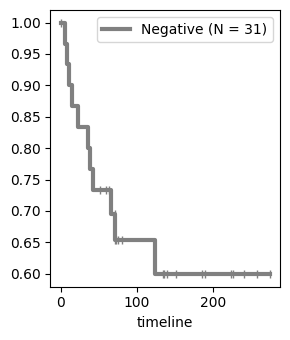

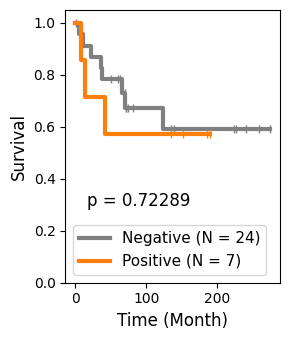

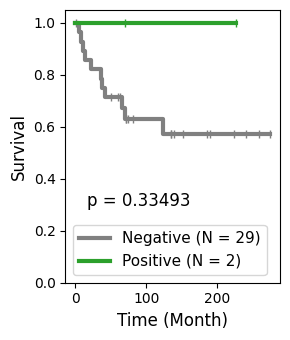

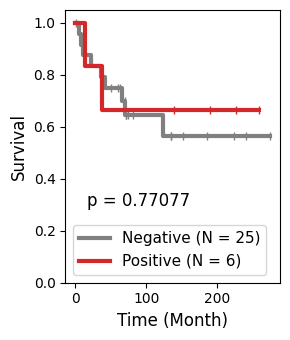

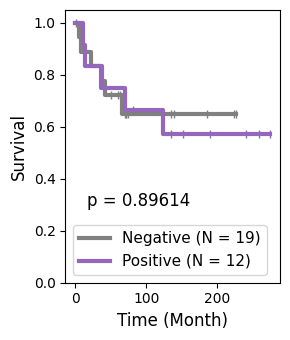

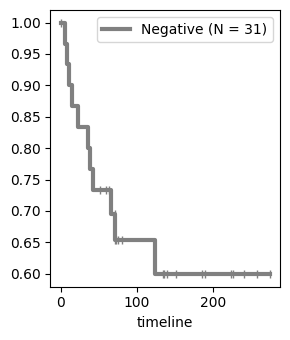

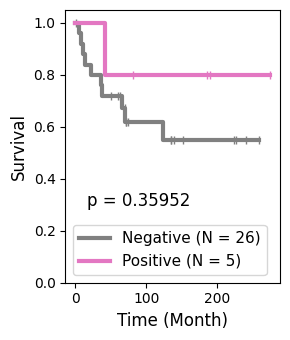

In [37]:
clinical_subtypes_clinical_subtypes_iv = np.zeros(len(patient_ids_iv), dtype=object)
clinical_subtypes_iv[:] = "Unknown"
for i in range(len(patient_ids_iv)):
    patient_id = patient_ids_iv[i]
    er = survival_iv.loc[survival_iv["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_iv.loc[survival_iv["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_iv.loc[
        survival_iv["patientID"] == patient_id, "HER2 Status"
    ].values[0]
    if her2 == "Positive":
        clinical_subtypes_iv[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_iv[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_iv[i] = "TNBC"  # TNBC
print(
    "{} patients in total, {} Unkonw, {} HER2+, {} HR+/HER2-, {} TNBC".format(
        len(clinical_subtypes_iv),
        np.sum(clinical_subtypes_iv == "Unknown"),
        np.sum(clinical_subtypes_iv == "HER2+"),
        np.sum(clinical_subtypes_iv == "HR+/HER2-"),
        np.sum(clinical_subtypes_iv == "TNBC"),
    )
)
threshold = 0.01
for clinical_subtype in ["TNBC"]:
    # f, ax = plt.subplots(
    #     1,
    #     len(patient_subgroups_iv),
    #     figsize=(4 * len(patient_subgroups_iv), 4),
    #     tight_layout=True,
    # )
    for i in range(len(patient_subgroups_iv)):
        f, ax = plt.subplots(figsize=(3, 3.5), tight_layout=True)
        subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
        characteristic_patterns = patient_subgroups_discovery[i][
            "characteristic_patterns"
        ]
        try:

            # ax.set_title(
            #     "Clinical Subtype: {}, Subgroup: {}".format(
            #         clinical_subtype, subgroup_id
            #     ),
            #     fontsize=12,
            # )

            proportion = proportions_iv[:, np.array(characteristic_patterns)].sum(
                axis=1
            )
            test = logrank_test(
                np.array(lengths_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(lengths_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
            )
            # if test.p_value > 0.5:
            #     continue

            kmf = KaplanMeierFitter()

            kmf.fit(
                np.array(lengths_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion < threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                label="Negative (N = {})".format(
                    np.sum(
                        (proportion < threshold)
                        & (clinical_subtypes_iv == clinical_subtype)
                    )
                ),
            )
            kmf.plot_survival_function(
                ax=ax,
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color="grey",
                linewidth=3,
            )
            kmf.fit(
                np.array(lengths_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                np.array(statuses_iv)[
                    (proportion >= threshold)
                    & (clinical_subtypes_iv == clinical_subtype)
                ],
                label="Positive (N = {})".format(
                    np.sum(
                        (proportion >= threshold)
                        & (clinical_subtypes_iv == clinical_subtype)
                    )
                ),
            )
            kmf.plot_survival_function(
                ax=ax,
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color=color_palette_Bigraph[subgroup_id],
                linewidth=3,
            )

            
            ax.text(
                0.1,
                0.28,
                "p = {:.5f}".format(test.p_value),
                fontsize=12,
                transform=ax.transAxes,
            )
            ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
            ax.set_xlabel("Time (Month)", fontsize=12)
            ax.set_ylabel("Survival", fontsize=12)
            ax.legend(fontsize=11)
            plt.show()

        except:
            pass
    plt.show()

### Fig.15.E  External-validation set

In [144]:
patient_ids_ev = list(SC_ev["patientID"].unique())
proportions_ev = histograms_ev / np.sum(histograms_ev, axis=1, keepdims=True)
lengths_ev = [
    survival_ev.loc[survival_ev["patientID"] == i, "time"].values[0]
    for i in patient_ids_ev
]
statuses_ev = [
    survival_ev.loc[survival_ev["patientID"] == i, "status"].values[0]
    for i in patient_ids_ev
]

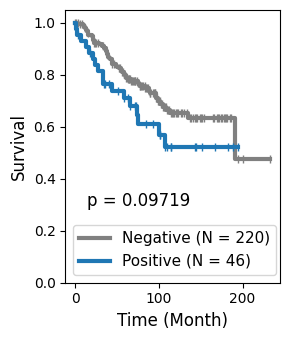

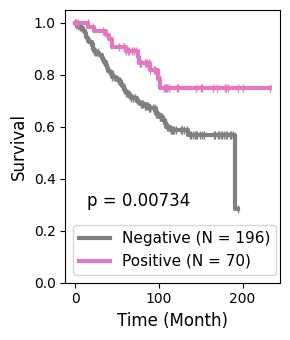

In [145]:
threshold = 0.01
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    if subgroup_id not in ["S1", "S7"]:
        continue
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    f, ax = plt.subplots(figsize=(3, 3.5), tight_layout=True)
    proportion = proportions_ev[:, np.array(characteristic_patterns)].sum(axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(
        np.array(lengths_ev)[proportion < threshold],
        np.array(statuses_ev)[proportion < threshold],
        label="Negative (N = {})".format(np.sum(proportion < threshold)),
    )
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color="grey",
        linewidth=3,
    )
    kmf.fit(
        np.array(lengths_ev)[(proportion >= threshold)],
        np.array(statuses_ev)[(proportion >= threshold)],
        label="Positive (N = {})".format(np.sum((proportion >= threshold))),
    )
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        show_censors=True,
        censor_styles={"ms": 6, "marker": "|"},
        color=color_palette_Bigraph[subgroup_id],
        linewidth=3,
    )
    test = logrank_test(
        np.array(lengths_ev)[proportion <= threshold],
        np.array(lengths_ev)[(proportion > threshold)],
        np.array(statuses_ev)[proportion <= threshold],
        np.array(statuses_ev)[(proportion > threshold)],
    )
    ax.text(
        0.1,
        0.28,
        "p = {:.5f}".format(test.p_value),
        fontsize=12,
        transform=ax.transAxes,
    )
    ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
    ax.set_xlabel("Time (Month)", fontsize=12)
    ax.set_ylabel("Survival", fontsize=12)
    ax.legend(fontsize=11)
    plt.show()

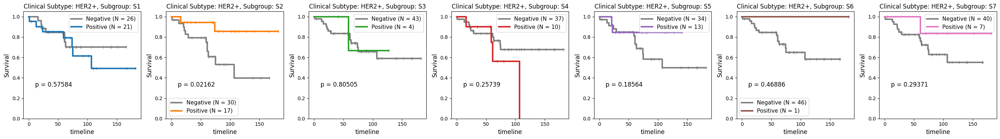

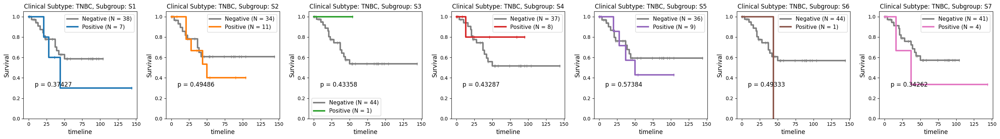

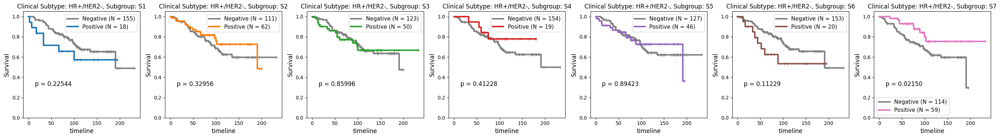

In [146]:
clinical_subtypes_ev = np.zeros(len(patient_ids_ev), dtype=object)
clinical_subtypes_ev[:] = "Unknown"
for i in range(len(patient_ids_ev)):
    patient_id = patient_ids_ev[i]
    er = survival_ev.loc[survival_ev["patientID"] == patient_id, "ERStatus"].values[0]
    pr = survival_ev.loc[survival_ev["patientID"] == patient_id, "PRStatus"].values[0]
    her2 = survival_ev.loc[survival_ev["patientID"] == patient_id, "HER2Status"].values[
        0
    ]
    if her2 == "positive":
        clinical_subtypes_ev[i] = "HER2+"  # Her2+
    if (er == "positive" or pr == "positive") and her2 == "negative":
        clinical_subtypes_ev[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "negative" and pr == "negative") and her2 == "negative":
        clinical_subtypes_ev[i] = "TNBC"  # TNBC
threshold = 0.01
for clinical_subtype in ["HER2+", "TNBC", "HR+/HER2-"]:
    f, ax = plt.subplots(
        1,
        len(patient_subgroups_ev),
        figsize=(4 * len(patient_subgroups_ev), 4),
        tight_layout=True,
    )
    for i in range(len(patient_subgroups_ev)):
        subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
        characteristic_patterns = patient_subgroups_discovery[i][
            "characteristic_patterns"
        ]
        try:
            ax[i].set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
            ax[i].set_xlabel("Time (Month)", fontsize=12)
            ax[i].set_ylabel("Survival", fontsize=12)
            ax[i].set_title(
                "Clinical Subtype: {}, Subgroup: {}".format(
                    clinical_subtype, subgroup_id
                ),
                fontsize=12,
            )

            proportion = proportions_ev[:, np.array(characteristic_patterns)].sum(
                axis=1
            )
            test = logrank_test(
                np.array(lengths_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(lengths_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
            )
            # if test.p_value > 0.5:
            #     continue

            kmf = KaplanMeierFitter()

            kmf.fit(
                np.array(lengths_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                label="Negative (N = {})".format(
                    np.sum(
                        (proportion < threshold)
                        & (clinical_subtypes_ev == clinical_subtype)
                    )
                ),
            )
            kmf.plot_survival_function(
                ax=ax[i],
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color="grey",
                linewidth=3,
            )
            kmf.fit(
                np.array(lengths_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                label="Positive (N = {})".format(
                    np.sum(
                        (proportion >= threshold)
                        & (clinical_subtypes_ev == clinical_subtype)
                    )
                ),
            )
            kmf.plot_survival_function(
                ax=ax[i],
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color=color_palette_Bigraph[subgroup_id],
                linewidth=3,
            )

            ax[i].text(
                0.1,
                0.3,
                "p = {:.5f}".format(test.p_value),
                fontsize=12,
                transform=ax[i].transAxes,
            )
            ax[i].legend(fontsize=11)

        except:
            pass
    plt.show()

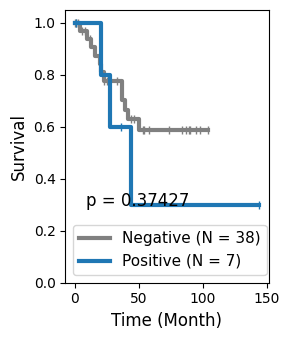

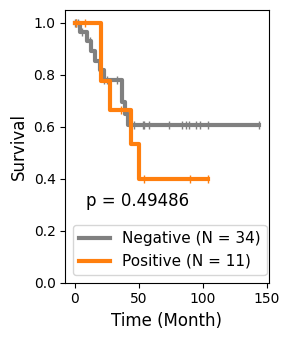

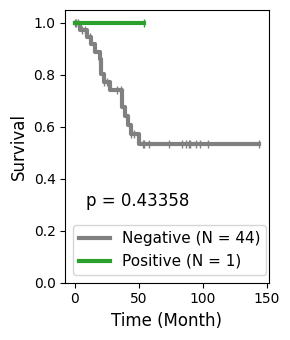

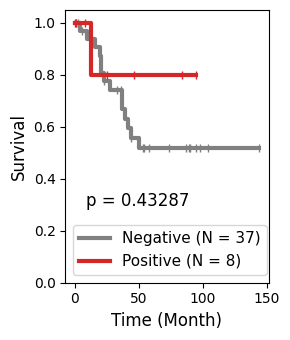

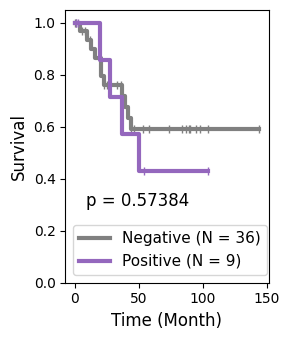

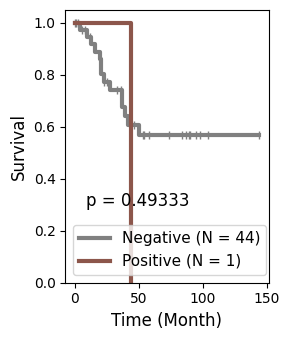

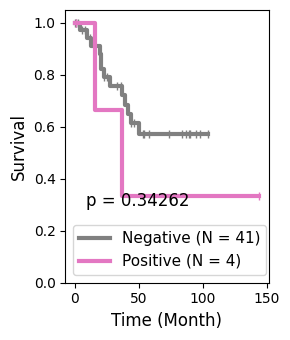

In [147]:
clinical_subtypes_ev = np.zeros(len(patient_ids_ev), dtype=object)
clinical_subtypes_ev[:] = "Unknown"
for i in range(len(patient_ids_ev)):
    patient_id = patient_ids_ev[i]
    er = survival_ev.loc[survival_ev["patientID"] == patient_id, "ERStatus"].values[0]
    pr = survival_ev.loc[survival_ev["patientID"] == patient_id, "PRStatus"].values[0]
    her2 = survival_ev.loc[survival_ev["patientID"] == patient_id, "HER2Status"].values[
        0
    ]
    if her2 == "positive":
        clinical_subtypes_ev[i] = "HER2+"  # Her2+
    if (er == "positive" or pr == "positive") and her2 == "negative":
        clinical_subtypes_ev[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "negative" and pr == "negative") and her2 == "negative":
        clinical_subtypes_ev[i] = "TNBC"  # TNBC
threshold = 0.01
for clinical_subtype in ["TNBC"]:
    # f, ax = plt.subplots(
    #     1,
    #     len(patient_subgroups_iv),
    #     figsize=(4 * len(patient_subgroups_iv), 4),
    #     tight_layout=True,
    # )
    for i in range(len(patient_subgroups_ev)):
        f, ax = plt.subplots(figsize=(3, 3.5), tight_layout=True)
        subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
        characteristic_patterns = patient_subgroups_discovery[i][
            "characteristic_patterns"
        ]
        proportion = proportions_ev[:, np.array(characteristic_patterns)].sum(
                axis=1
            )
        test = logrank_test(
                np.array(lengths_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(lengths_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
            )
            # if test.p_value > 0.5:
            #     continue

        kmf = KaplanMeierFitter()

        kmf.fit(
                np.array(lengths_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion < threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                label="Negative (N = {})".format(
                    np.sum(
                        (proportion < threshold)
                        & (clinical_subtypes_ev == clinical_subtype)
                    )
                ),
            )
        kmf.plot_survival_function(
                ax=ax,
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color="grey",
                linewidth=3,
            )
        kmf.fit(
                np.array(lengths_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                np.array(statuses_ev)[
                    (proportion >= threshold)
                    & (clinical_subtypes_ev == clinical_subtype)
                ],
                label="Positive (N = {})".format(
                    np.sum(
                        (proportion >= threshold)
                        & (clinical_subtypes_ev == clinical_subtype)
                    )
                ),
            )
        kmf.plot_survival_function(
                ax=ax,
                ci_show=False,
                show_censors=True,
                censor_styles={"ms": 6, "marker": "|"},
                color=color_palette_Bigraph[subgroup_id],
                linewidth=3,
            )

            
        ax.text(
                0.1,
                0.28,
                "p = {:.5f}".format(test.p_value),
                fontsize=12,
                transform=ax.transAxes,
            )
        ax.set(ylim=[0, 1.05], xlabel="Time (Month)", ylabel="Survival")
        ax.set_xlabel("Time (Month)", fontsize=12)
        ax.set_ylabel("Survival", fontsize=12)
        ax.legend(fontsize=11)
        plt.show()



### External validation (TNBC)

#### Baseline (Treatment Naive)

In [87]:
survival_ev_tnbc = survival_ev_tnbc.rename(
        columns={
            "PatientID": "patientID"}
    )


[0]
pCR  Existence
RD   False        100
     True          31
pCR  False         80
     True          29
dtype: int64
MannwhitneyuResult(statistic=1846.0, pvalue=0.14609623081679224)
MannwhitneyuResult(statistic=2202.5, pvalue=0.054271326694252754)
C&I_RD vs. C&I_pCR: p = 0.05427
C_RD vs. C_pCR: p = 0.14610


[Text(0.5, 3.722222222222216, 'Therapy'),
 Text(3.972222222222223, 0.5, 'Proportion of TLS-like niche'),
 [Text(0, 0, 'C'), Text(1, 0, 'C&I')],
 Text(0.5, 1.0, 'Pre-Treatment')]

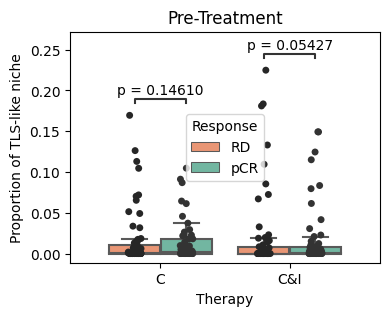

In [89]:
patient_ids_ev_tnbc_baseline = list(SC_ev_tnbc_baseline["patientID"].unique())
response_baseline = [
    survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "pCR"].values[0]
    for i in patient_ids_ev_tnbc_baseline
]
arm_baseline = [
    survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "Arm"].values[0]
    for i in patient_ids_ev_tnbc_baseline
]
characteristic_patterns = patient_subgroups_discovery[3]["characteristic_patterns"]
print(characteristic_patterns)
proportions_ev_tnbc_baseline = histograms_ev_tnbc_baseline / np.sum(
    histograms_ev_tnbc_baseline, axis=1, keepdims=True
)
df = pd.DataFrame(
    {
        "pCR": response_baseline,
        "Proportion": proportions_ev_tnbc_baseline[:, characteristic_patterns].sum(
            axis=1
        ),
        "Existence": proportions_ev_tnbc_baseline[:, characteristic_patterns].sum(
            axis=1
        )
        >= 0.01,
        "Arm": arm_baseline,
    }
)
print(df.groupby(["pCR", "Existence"]).size())
a = df.groupby(["pCR", "Existence"]).size()

import scipy.stats as stats

pvalues = []
res = stats.mannwhitneyu(
    df.loc[(df["pCR"] == "pCR") & (df["Arm"] == "C"), "Proportion"],
    df.loc[(df["pCR"] == "RD") & (df["Arm"] == "C"), "Proportion"],
    alternative="greater",
)
print(res)
pvalues.append(res.pvalue)
res = stats.mannwhitneyu(
    df.loc[(df["pCR"] == "pCR") & (df["Arm"] == "C&I"), "Proportion"],
    df.loc[(df["pCR"] == "RD") & (df["Arm"] == "C&I"), "Proportion"],
    alternative="greater",
)
print(res)
pvalues.append(res.pvalue)

# show boxplot of proportion of RD and pCR
f, ax = plt.subplots(1, 1, figsize=(4, 3))
sns.boxplot(
    data=df,
    x="Arm",
    hue="pCR",
    y="Proportion",
    ax=ax,
    order=["C", "C&I"],
    showfliers=False,
    palette={"RD": sns.color_palette("Set2")[1], "pCR": sns.color_palette("Set2")[0]},
)
sns.stripplot(data=df, x="Arm", hue="pCR", y="Proportion", ax=ax, order=["C", "C&I"], dodge=True, color=".2")
from statannotations.Annotator import Annotator

annot = Annotator(
    ax,
    [(("C", "RD"), ("C", "pCR")), (("C&I", "RD"), ("C&I", "pCR"))],
    data=df,
    x="Arm",
    hue="pCR",
    y="Proportion",
    order=["C", "C&I"],
)
annot.configure(
    test="Mann-Whitney",
    text_format="simple",
    loc="inside",
    verbose=2,
    # alternative = 'two-sided',
)
annot.apply_test()
formatted_pvalues = [f"p = {pvalue:.5f}" for pvalue in pvalues]
annot.set_custom_annotations(formatted_pvalues)

ax, test_results = annot.annotate()

handles, labels = ax.get_legend_handles_labels()
# put the legend out of the plot
ax.legend(
    title="Response",
    handles=handles,
    labels=["RD", "pCR"],
    # loc="upper left",
    # bbox_to_anchor=(1, 1),
)
# not show the legend
# ax.legend().remove()
ax.set(
    xlabel="Therapy",
    ylabel="Proportion of TLS-like niche",
    xticklabels=["C", "C&I"],
    title="Pre-Treatment",
)

pCR  Existence
RD   False        100
     True          31
pCR  False         80
     True          29
dtype: int64
MannwhitneyuResult(statistic=8095.0, pvalue=0.028513287924882023)
RD vs. pCR: p = 0.02851


[Text(0.5, 3.722222222222216, 'Response'),
 Text(3.972222222222223, 0.5, 'Proportion of TLS niche'),
 [Text(0, 0, 'RD'), Text(1, 0, 'pCR')],
 Text(0.5, 1.0, 'Pre-Treatment')]

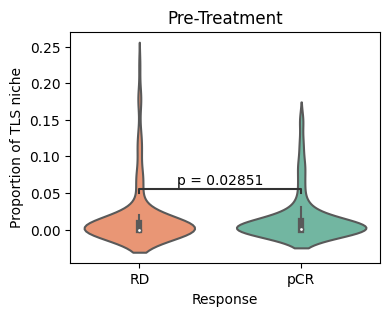

In [93]:
patient_ids_ev_tnbc_baseline = list(SC_ev_tnbc_baseline["patientID"].unique())
response_baseline = [survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "pCR"].values[0] for i in patient_ids_ev_tnbc_baseline]
arm_baseline = [survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "Arm"].values[0] for i in patient_ids_ev_tnbc_baseline]
characteristic_patterns = patient_subgroups_discovery[3][
            "characteristic_patterns"
        ]
proportions_ev_tnbc_baseline = histograms_ev_tnbc_baseline / np.sum(histograms_ev_tnbc_baseline, axis=1, keepdims=True)
df = pd.DataFrame({
    'pCR': response_baseline,
    'Proportion': proportions_ev_tnbc_baseline[:, characteristic_patterns].sum(axis = 1),
    'Existence': proportions_ev_tnbc_baseline[:, characteristic_patterns].sum(axis = 1)>=0.01,
    'Arm': arm_baseline
})
print(df.groupby(['pCR',  'Existence']).size())
a = df.groupby(['pCR', 'Existence']).size()

import scipy.stats as stats
res = stats.mannwhitneyu(
    df.loc[(df['pCR']=='pCR') , 'Proportion'],
    df.loc[(df['pCR']=='RD'), 'Proportion'],
    alternative='greater'
)
print(res)

# show boxplot of proportion of RD and pCR
f, ax = plt.subplots(1, 1, figsize=(4, 3))
sns.boxplot(data = df, x='pCR', y='Proportion',ax=ax, showfliers=False, palette = {
    'RD': sns.color_palette("Set2")[1],
    'pCR': sns.color_palette("Set2")[0]
})

# sns.violinplot(data = df, x='pCR', y='Proportion',ax=ax, dodge=True, color=".2")
from statannotations.Annotator import Annotator
annot = Annotator(
        ax,
        [('RD', 'pCR'),],
        data=df,
        x="pCR",
        y="Proportion",


    )
annot.configure(
        test="Mann-Whitney",
        text_format="simple",
        loc="inside",
        verbose=2,
        # alternative = 'two-sided',

    )
annot.apply_test()
formatted_pvalues = f'p = {res.pvalue:.5f}'
annot.set_custom_annotations([formatted_pvalues])

ax, test_results = annot.annotate()


ax.set(
    xlabel="Response",
    ylabel="Proportion of TLS niche",
    xticklabels=["RD", "pCR"],
    title = "Pre-Treatment",
)

#### On-treatment

pCR  Existence
RD   False        79
     True         26
pCR  False        57
     True         33
dtype: int64
MannwhitneyuResult(statistic=5769.0, pvalue=0.002735830733084264)
RD vs. pCR: p = 0.00274


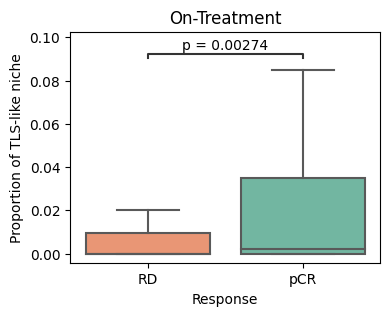

In [55]:
patient_ids_ev_tnbc_ot = list(SC_ev_tnbc_ot["patientID"].unique())
response_ot = [survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "pCR"].values[0] for i in patient_ids_ev_tnbc_ot]
arm_ot = [survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "Arm"].values[0] for i in patient_ids_ev_tnbc_ot]
characteristic_patterns = patient_subgroups_discovery[3][
            "characteristic_patterns"
        ]
proportions_ev_tnbc_ot = histograms_ev_tnbc_ot / np.sum(histograms_ev_tnbc_ot, axis=1, keepdims=True)
df = pd.DataFrame({
    'pCR': response_ot,
    'Proportion': proportions_ev_tnbc_ot[:, characteristic_patterns].sum(axis = 1),
    'Existence': proportions_ev_tnbc_ot[:, characteristic_patterns].sum(axis = 1)>=0.01,
    'Arm': arm_ot
})
print(df.groupby(['pCR',  'Existence']).size())
a = df.groupby(['pCR', 'Existence']).size()

import scipy.stats as stats
res = stats.mannwhitneyu(
    df.loc[(df['pCR']=='pCR') , 'Proportion'],
    df.loc[(df['pCR']=='RD'), 'Proportion'],
    alternative='greater'
)
print(res)

# show boxplot of proportion of RD and pCR
f, ax = plt.subplots(1, 1, figsize=(4, 3))
sns.boxplot(data = df, x='pCR', y='Proportion',ax=ax, showfliers=False, palette = {
    'RD': sns.color_palette("Set2")[1],
    'pCR': sns.color_palette("Set2")[0]
})

from statannotations.Annotator import Annotator
annot = Annotator(
        ax,
        [('RD', 'pCR'),],
        data=df,
        x="pCR",
        y="Proportion",


    )
annot.configure(
        test="Mann-Whitney",
        text_format="simple",
        loc="inside",
        verbose=2,
        # alternative = 'two-sided',

    )
annot.apply_test()
formatted_pvalues = f'p = {res.pvalue:.5f}'
annot.set_custom_annotations([formatted_pvalues])

ax, test_results = annot.annotate()

ax.set(
    xlabel="Response",
    ylabel="Proportion of TLS-like niche",
    xticklabels=["RD", "pCR"],
    title = "On-Treatment",
)

plt.show()



pCR  Existence
RD   False        79
     True         26
pCR  False        57
     True         33
dtype: int64
MannwhitneyuResult(statistic=1245.0, pvalue=0.22983100641504928)
MannwhitneyuResult(statistic=1639.0, pvalue=0.0008519119751315489)
C&I_RD vs. C&I_pCR: p = 0.00085
C_RD vs. C_pCR: p = 0.22983


[Text(0.5, 3.722222222222216, 'Therapy'),
 Text(3.972222222222223, 0.5, 'Proportion of TLS-like niche'),
 [Text(0, 0, 'C'), Text(1, 0, 'C&I')],
 Text(0.5, 1.0, 'On-Treatment')]

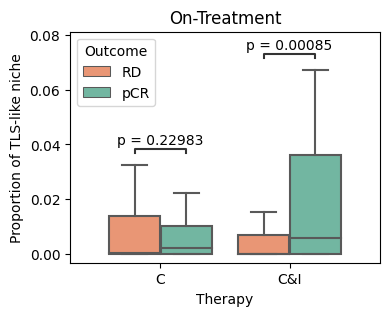

In [67]:
patient_ids_ev_tnbc_ot = list(SC_ev_tnbc_ot["patientID"].unique())
response_ot = [
    survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "pCR"].values[0]
    for i in patient_ids_ev_tnbc_ot
]
arm_ot = [
    survival_ev_tnbc.loc[survival_ev_tnbc["patientID"] == i, "Arm"].values[0]
    for i in patient_ids_ev_tnbc_ot
]
characteristic_patterns = patient_subgroups_discovery[3]["characteristic_patterns"]
proportions_ev_tnbc_ot = histograms_ev_tnbc_ot / np.sum(
    histograms_ev_tnbc_ot, axis=1, keepdims=True
)
df = pd.DataFrame(
    {
        "pCR": response_ot,
        "Proportion": proportions_ev_tnbc_ot[:, characteristic_patterns[0]],
        "Existence": proportions_ev_tnbc_ot[:, characteristic_patterns[0]] >= 0.01,
        "Arm": arm_ot,
    }
)
print(df.groupby(["pCR", "Existence"]).size())
a = df.groupby(["pCR", "Existence"]).size()

import scipy.stats as stats

pvalues = []
res = stats.mannwhitneyu(
    df.loc[(df["pCR"] == "pCR") & (df["Arm"] == "C"), "Proportion"],
    df.loc[(df["pCR"] == "RD") & (df["Arm"] == "C"), "Proportion"],
    alternative="greater",
)
print(res)
pvalues.append(res.pvalue)
res = stats.mannwhitneyu(
    df.loc[(df["pCR"] == "pCR") & (df["Arm"] == "C&I"), "Proportion"],
    df.loc[(df["pCR"] == "RD") & (df["Arm"] == "C&I"), "Proportion"],
    alternative="greater",
)
print(res)
pvalues.append(res.pvalue)

# show boxplot of proportion of RD and pCR
f, ax = plt.subplots(1, 1, figsize=(4, 3))
sns.boxplot(data=df, x="Arm", hue="pCR", y="Proportion", ax=ax, order=["C", "C&I"], showfliers=False, 
            palette = {
                'RD': sns.color_palette("Set2")[1],
                'pCR': sns.color_palette("Set2")[0]
            })
from statannotations.Annotator import Annotator

annot = Annotator(
    ax,
    [(("C", "RD"), ("C", "pCR")), (("C&I", "RD"), ("C&I", "pCR"))],
    data=df,
    x="Arm",
    hue="pCR",
    y="Proportion",
    order=["C", "C&I"],
)
annot.configure(
    test="Mann-Whitney",
    text_format="simple",
    loc="inside",
    verbose=2,
    # alternative = 'two-sided',
)
annot.apply_test()
formatted_pvalues = [f"p = {pvalue:.5f}" for pvalue in pvalues]
annot.set_custom_annotations(formatted_pvalues)

ax, test_results = annot.annotate()

handles, labels = ax.get_legend_handles_labels()
# put the legend out of the plot
ax.legend(
    title="Outcome",
    handles=handles,
    labels=["RD", "pCR"],
    loc="upper left",
#     bbox_to_anchor=(1, 1),
)
ax.set(
    xlabel="Therapy",
    ylabel="Proportion of TLS-like niche",
    xticklabels=["C", "C&I"],
    title="On-Treatment",
)

## Fig.16 Validation of correlation between clinical variables and patterns

### Fig.16.I Inner-validation Set

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:3.623e-01 U_stat=4.320e+02
2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:2.820e-04 U_stat=2.654e+03
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:1.375e-02 U_stat=6.960e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:1.827e-01 U_stat=2.400e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:5.088e-01 U_stat=5.060e+02


2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:3.823e-06 U_stat=4.956e+03
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:7.890e-04 U_stat=1.461e+03


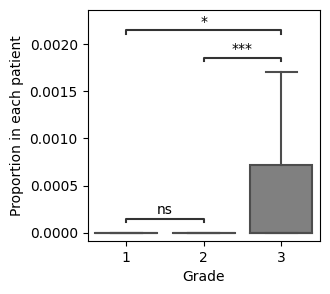

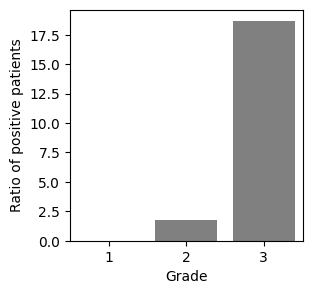

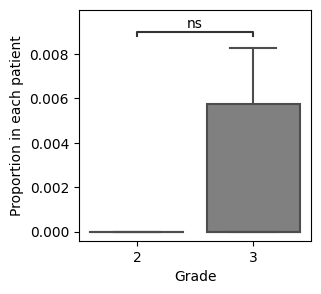

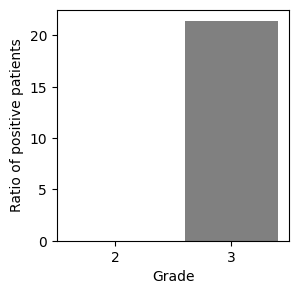

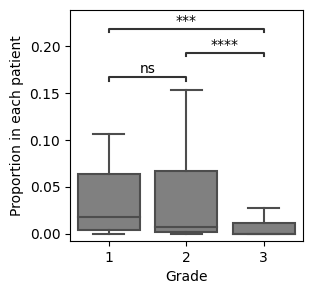

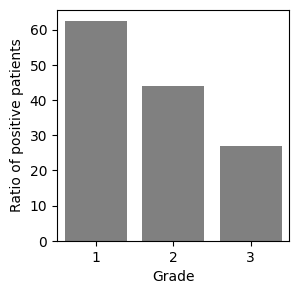

In [156]:
Histograms = histograms_iv
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
patient_ids_iv = list(SC_iv["patientID"].unique())

from itertools import combinations

feature_name = "Grade"
feature_list = [1, 2, 3]
compare_list = [(1, 2), (2, 3), (1, 3)]


for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if subgroup_id not in ["S1", "S4", "S7"]:
        continue
    proportion = np.sum(Proportions[:, np.array(characteristic_patterns)], axis=1)
    if subgroup_id == "S4":
        feature_list = [2,3]
        compare_list = [ (2, 3)]
        DF_presentation = pd.DataFrame(
        {
            "Proportion": proportion[clinical_subtypes_iv == "TNBC"],
            feature_name: [
                survival_iv.loc[
                    survival_iv["patientID"] == patient_id, feature_name
                ].values[0]
                for patient_id in np.array(patient_ids_iv)[clinical_subtypes_iv == "TNBC"]
            ],
        }
    )
    else:
        feature_list = [1, 2, 3]
        compare_list = [(1, 2), (2, 3), (1, 3)]
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion,
                feature_name: [
                    survival_iv.loc[
                        survival_iv["patientID"] == patient_id, feature_name
                    ].values[0]
                    for patient_id in patient_ids_iv
                ],
            }
        )

    DF_presentation = DF_presentation.dropna()
    f, ax = plt.subplots(figsize=(3, 3))
    sns.boxplot(
        x=feature_name,
        y="Proportion",
        data=DF_presentation,
        showfliers=False,
        order=feature_list,
        color = 'grey',


        # order=["HR+/HER2-", "HR+/HER2+", "HR-/HER2+", "TNBC"],
    )
    from statannotations.Annotator import Annotator

    annot = Annotator(
        ax,
        compare_list,
        data=DF_presentation,
        x=feature_name,
        y="Proportion",
        order=feature_list,
    )
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="inside",
        verbose=2,
    )
    annot.apply_test()
    ax, test_results = annot.annotate()

    # ax.set(title = 'Proportion of pattern {} in each grade'.format(pattern_id[0]+1))
    ax.set(ylabel="Proportion in each patient")

    DF_existence = pd.DataFrame(
        {
            feature_name: feature_list,
        }
    )
    for feature in feature_list:
        data = DF_presentation.loc[
            DF_presentation[feature_name] == feature, "Proportion"
        ].values

        exisitence_ratio = np.sum(data > 0.01) / len(data)
        DF_existence.loc[DF_existence[feature_name] == feature, "Existence (%)"] = (
            exisitence_ratio * 100
        )

    f, ax = plt.subplots(figsize=(3,3 ))
    sns.barplot(
        x=feature_name,
        y="Existence (%)",
        data=DF_existence,
        order=feature_list,
        color = 'grey',
    )
    ax.set(ylabel="Ratio of positive patients")

plt.show()

### Fig.16.E External-validation Set

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:6.897e-01 U_stat=1.894e+03
2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:7.596e-01 U_stat=6.813e+03
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:8.511e-01 U_stat=2.024e+03
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:3.132e-01 U_stat=8.900e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:9.454e-01 U_stat=1.993e+03


2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:6.933e-06 U_stat=8.864e+03
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:1.618e-03 U_stat=2.749e+03


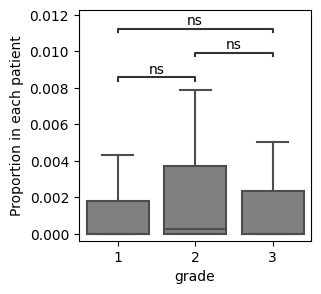

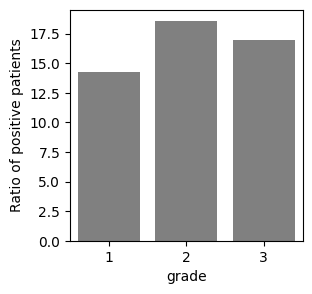

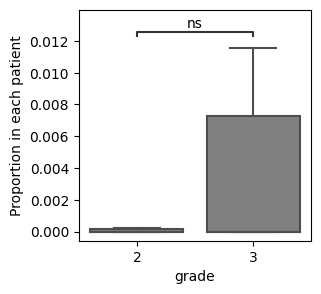

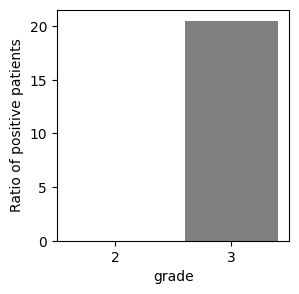

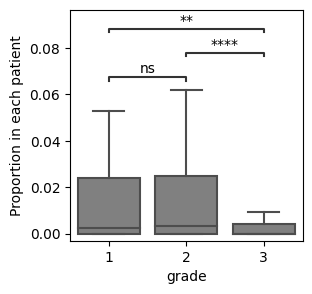

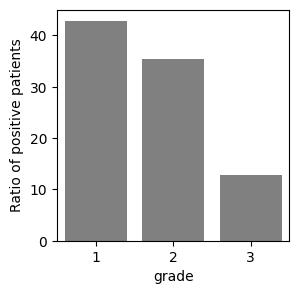

In [155]:
Histograms = histograms_ev
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
patient_ids_ev = list(SC_ev["patientID"].unique())

from itertools import combinations

feature_name = "grade"
f



for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if subgroup_id not in ["S1", "S4", "S7"]:
        continue
    proportion = np.sum(Proportions[:, np.array(characteristic_patterns)], axis=1)
    if subgroup_id == "S4":
        feature_list = [2,3]
        compare_list = [ (2, 3)]
        DF_presentation = pd.DataFrame(
        {
            "Proportion": proportion[clinical_subtypes_ev == "TNBC"],
            feature_name: [
                survival_ev.loc[
                    survival_ev["patientID"] == patient_id, feature_name
                ].values[0]
                for patient_id in np.array(patient_ids_ev)[clinical_subtypes_ev == "TNBC"]
            ],
        }
    )
    else:
        feature_list = [1, 2, 3]
        compare_list = [(1, 2), (2, 3), (1, 3)]
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion,
                feature_name: [
                    survival_ev.loc[
                        survival_ev["patientID"] == patient_id, feature_name
                    ].values[0]
                    for patient_id in patient_ids_ev
                ],
            }
        )

    DF_presentation = DF_presentation.dropna()
    f, ax = plt.subplots(figsize=(3, 3))
    sns.boxplot(
        x=feature_name,
        y="Proportion",
        data=DF_presentation,
        showfliers=False,
        order=feature_list,
        color = 'grey',


        # order=["HR+/HER2-", "HR+/HER2+", "HR-/HER2+", "TNBC"],
    )
    from statannotations.Annotator import Annotator

    annot = Annotator(
        ax,
        compare_list,
        data=DF_presentation,
        x=feature_name,
        y="Proportion",
        order=feature_list,
    )
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="inside",
        verbose=2,
    )
    annot.apply_test()
    ax, test_results = annot.annotate()

    # ax.set(title = 'Proportion of pattern {} in each grade'.format(pattern_id[0]+1))
    ax.set(ylabel="Proportion in each patient")

    DF_existence = pd.DataFrame(
        {
            feature_name: feature_list,
        }
    )
    for feature in feature_list:
        data = DF_presentation.loc[
            DF_presentation[feature_name] == feature, "Proportion"
        ].values

        exisitence_ratio = np.sum(data > 0.01) / len(data)
        DF_existence.loc[DF_existence[feature_name] == feature, "Existence (%)"] = (
            exisitence_ratio * 100
        )

    f, ax = plt.subplots(figsize=(3,3 ))
    sns.barplot(
        x=feature_name,
        y="Existence (%)",
        data=DF_existence,
        order=feature_list,
        color = 'grey',
    )
    ax.set(ylabel="Ratio of positive patients")

plt.show()

## Fig.17 Comparative Methods

### Cell type Abundance

### Graph embedding (Feather)

In [19]:
import pickle
import pandas as pd

with open(
    "/cis/home/zwang/Projects/BiGraph4TME/Demo/cell_graphs_discovery.pkl", "rb"
) as f:
    To_save = pickle.load(f)
Cell_graphs_nx = [i[1] for i in To_save]
Patient_ids = [i[0] for i in To_save]
with open("feather_embeddings_discovery.pkl", "rb") as f:
    X = pickle.load(f)
from sklearn.metrics.pairwise import cosine_similarity

Similarity_matrix = cosine_similarity(X)

In [21]:
print("Start generating population graph.")
import sys

sys.path.append("./..")
from population_graph import Population_Graph
import numpy as np
from bi_graph import BiGraph

population_graph_ = Population_Graph(
    k_clustering=30,
    resolution=1,
    size_smallest_cluster=10,
    seed=0,
)  # initialize Population_Graph class with parameters k, resolution, size_smallest_cluster, and seed
Population_graph = population_graph_.generate(
    Similarity_matrix, Patient_ids
)  # generate population graph
print("Population graph generated.")
print("Start detecting patient subgroups.")
patient_subgroups_discovery_c = population_graph_.community_detection(
    Population_graph
)  # detect patient subgroups
print("Patient subgroups detected.")
bigraph_ge = BiGraph(k_patient_clustering=30)
patient_subgroups_discovery_c = bigraph_ge.analyze_survival(
    patient_subgroups_discovery_c, survival_d, Patient_ids
)
patient_subgroups_discovery_c = sorted(
    patient_subgroups_discovery_c, key=lambda x: x["hr"], reverse=True
)
print("Patient subgroups sorted by hazard ratio.")  # Assign subgroup id
for i in range(len(patient_subgroups_discovery_c)):
    patient_subgroups_discovery_c[i]["subgroup_id"] = "S" + str(i + 1)


patient_ids_discovery_c = Patient_ids
subgroup_ids_discovery_c = np.zeros(len(Patient_ids), dtype=object)
subgroup_ids_discovery_c[:] = "Unclassified"
for i in range(len(patient_subgroups_discovery_c)):
    subgroup = patient_subgroups_discovery_c[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_discovery_c[np.isin(Patient_ids, patient_ids)] = subgroup_id
Num_patients_in_subgroups = [
    len(subgroup["patient_ids"]) for subgroup in patient_subgroups_discovery_c
]
print(
    "There are {} patient subgroups, {} ungrouped patients".format(
        len(patient_subgroups_discovery_c),
        len(patient_ids_discovery_c) - sum(Num_patients_in_subgroups),
    )
)

Start generating population graph.
Population graph generated.
Start detecting patient subgroups.
Patient subgroups detected.
Patient subgroups sorted by hazard ratio.
There are 5 patient subgroups, 0 ungrouped patients


[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, '')],
 [Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, '')]]

/cis/home/zwang/venv/cell-gnn/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  func(*args, **kwargs)


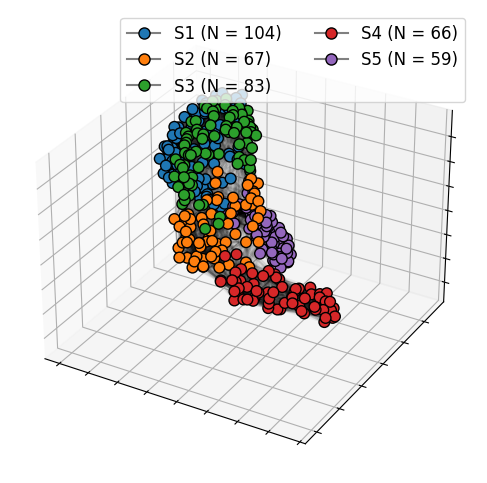

In [22]:
# For visualization purpose, we make nodes distant from each other
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    Similarity_matrix, patient_ids_discovery_c
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i] for i in subgroup_ids_discovery_c],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_discovery_c == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_discovery_c == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_discovery_c:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_discovery_c == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=12, ncols=2, loc = 'upper right')
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

Patient subgroup S1: N = 104, HR = 1.32 (0.91-1.91), p = 1.48e-01
Patient subgroup S2: N = 67, HR = 0.97 (0.61-1.55), p = 8.95e-01
Patient subgroup S3: N = 83, HR = 0.95 (0.63-1.45), p = 8.24e-01
Patient subgroup S4: N = 66, HR = 0.95 (0.59-1.51), p = 8.21e-01
Patient subgroup S5: N = 59, HR = 0.75 (0.45-1.25), p = 2.72e-01


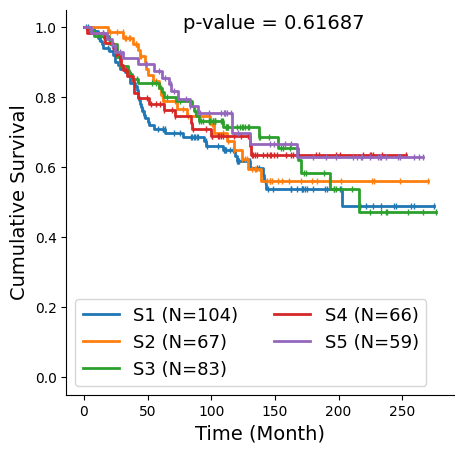

In [28]:
for i in range(len(patient_subgroups_discovery_c)):
    print(
        "Patient subgroup {}: N = {}, HR = {:.2f} ({:.2f}-{:.2f}), p = {:.2e}".format(
            patient_subgroups_discovery_c[i]["subgroup_id"],
            len(patient_subgroups_discovery_c[i]["patient_ids"]),
            patient_subgroups_discovery_c[i]["hr"],
            patient_subgroups_discovery_c[i]["hr_lower"],
            patient_subgroups_discovery_c[i]["hr_upper"],
            patient_subgroups_discovery_c[i]["p"],
        )
    )

lengths_discovery = [
    survival_d.loc[survival_d["patientID"] == i, "time"].values[0]
    for i in patient_ids_discovery
]
statuses_discovery = [
    (survival_d.loc[survival_d["patientID"] == i, "status"].values[0])
    for i in patient_ids_discovery
]
kmf = KaplanMeierFitter()
f, ax = plt.subplots(figsize=(5, 5))
for subgroup in patient_subgroups_discovery_c:
    subgroup_id = subgroup["subgroup_id"]
    length_A, event_observed_A = (
        np.array(lengths_discovery)[subgroup_ids_discovery_c == subgroup_id],
        np.array(statuses_discovery)[subgroup_ids_discovery_c == subgroup_id],
    )
    label = "{} (N={})".format(
        subgroup["subgroup_id"], np.sum(subgroup_ids_discovery_c == subgroup_id)
    )
    kmf.fit(length_A, event_observed_A, label=label)
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        color=color_palette_Bigraph[subgroup_id],
        show_censors=True,
        linewidth=2,
        censor_styles={"ms": 5, "marker": "|"},
    )
log_rank_test = multivariate_logrank_test(
    np.array(lengths_discovery)[subgroup_ids_discovery_c != 0],
    np.array(subgroup_ids_discovery_c)[subgroup_ids_discovery_c != 0],
    np.array(statuses_discovery)[subgroup_ids_discovery_c != 0],
)
p_value = log_rank_test.p_value
ax.legend(ncol=2, fontsize=13)
ax.text(
    x=0.3,
    y=0.95,
    s="p-value = {:.5f}".format(p_value),
    fontsize=14,
    transform=ax.transAxes,
)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
sns.despine()

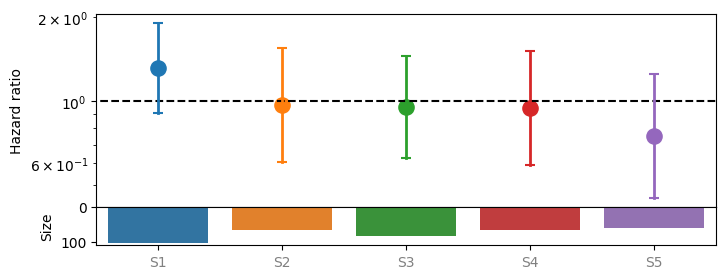

In [30]:
# Plot hazard ratio
f, ax = plt.subplots(2, 1, height_ratios=[5, 1], figsize=(8, 3), sharex=True)
f.subplots_adjust(hspace=0)
ax[0].hlines(1, -1, len(patient_subgroups_discovery_c), color="k", linestyle="--")
N, xticklabels, xtickcolors = [], [], []
for i in range(len(patient_subgroups_discovery_c)):
    subgroup = patient_subgroups_discovery_c[i]
    subgroup_id = subgroup["subgroup_id"]
    hr, hr_lb, hr_ub, p = (
        subgroup["hr"],
        subgroup["hr_lower"],
        subgroup["hr_upper"],
        subgroup["p"],
    )
    ax[0].plot(
        [i, i], [hr_lb, hr_ub], color=color_palette_Bigraph[subgroup_id], linewidth=2
    )
    ax[0].scatter([i], [hr], color=color_palette_Bigraph[subgroup_id], s=120)
    ax[0].scatter(
        [i], [hr_lb], color=color_palette_Bigraph[subgroup_id], s=60, marker="_"
    )
    ax[0].scatter(
        [i], [hr_ub], color=color_palette_Bigraph[subgroup_id], s=60, marker="_"
    )
    N.append(np.sum(subgroup_ids_discovery_c == subgroup_id))
    xticklabels.append("{}".format(subgroup_id))
    if p < 0.05:
        xtickcolors.append("k")
    else:
        xtickcolors.append("grey")
ax[0].set_xticks(range(len(patient_subgroups_discovery_c)))
ax[0].set_xticklabels(xticklabels)
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[0].set_xlabel("Patient Subgroups")
ax[0].set_ylabel("Hazard ratio")
ax[0].set_yscale("log")
DF = pd.DataFrame({"N": N, "subgroup_id": xticklabels})
g = sns.barplot(
    data=DF, x="subgroup_id", y="N", palette=color_palette_Bigraph, ax=ax[1]
)
g.invert_yaxis()
ax[1].set_ylabel("Size")
ax[1].set_xlabel("")
plt.show()

## Appendix

### Fig.A.1.a Median protein profiling for Danenberg et al

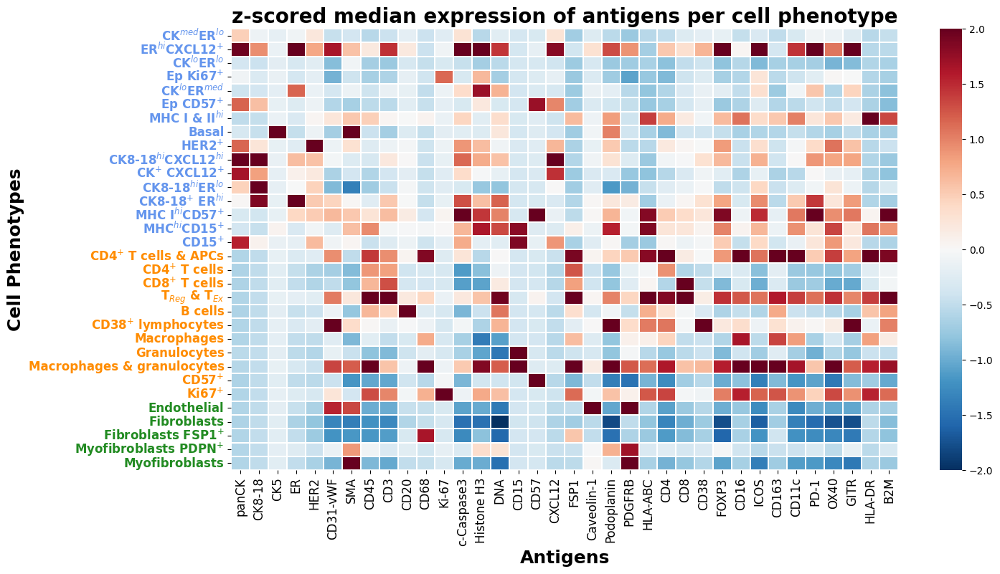

In [104]:
Cell_type_name_list = [
    reverse_dict(get_node_id("Danenberg", "CellType"))[i] for i in range(32)
]
SC_d_raw["meta_description"] = pd.Categorical(
    SC_d_raw["meta_description"], categories=Cell_type_name_list, ordered=True
)
expression_per_phenoptype = SC_d_raw.groupby("meta_description")[
    Protein_list_Danenberg
].median()
expression_per_phenoptype_scaled = (
    expression_per_phenoptype - expression_per_phenoptype.mean()
) / expression_per_phenoptype.std()


f, ax = plt.subplots(figsize=(15, 8))
sns.heatmap(
    expression_per_phenoptype_scaled,
    ax=ax,
    cmap="RdBu_r",
    center=0,
    vmin=-2,
    vmax=2,
    cbar=True,
    linewidth=0.1,
)
ax.set_xticklabels(
    Protein_list_display_Danenberg,
    fontsize=12,
)

ax.set_yticklabels(Cell_types_displayed_Danenberg, fontsize=12, fontweight="bold")
# ax.set_yticklabels(ax.get_yticklabels(), fontsize = 12, fontweight='bold')
ax.set_xlabel("Antigens", fontsize=18, fontweight="bold")
ax.set_ylabel("Cell Phenotypes", fontsize=18, fontweight="bold")
ytickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["forestgreen"] * 5
for ytick, color in zip(ax.get_yticklabels(), ytickcolors):
    ytick.set_color(color)
ax.set_title(
    "z-scored median expression of antigens per cell phenotype",
    fontsize=20,
    fontweight="bold",
)
f.show()

### Fig A.1.b Median Protein profiling for Jackson et al

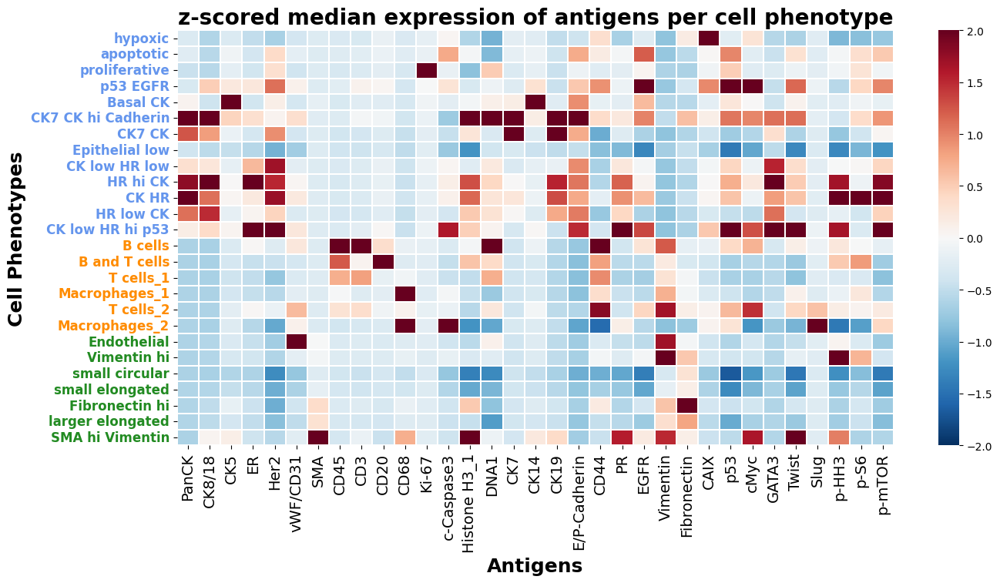

In [99]:
SC_ev_raw["cell_type"] = pd.Categorical(
    SC_ev_raw["cell_type"], categories=Cell_types_displayed_Jackson, ordered=True
)
expression_per_phenoptype = SC_ev_raw.groupby("cell_type")[
    Protein_list_Jackson
].median()
expression_per_phenoptype_scaled = (
    expression_per_phenoptype - expression_per_phenoptype.mean()
) / expression_per_phenoptype.std()


f, ax = plt.subplots(figsize=(15, 7))
sns.heatmap(
    expression_per_phenoptype_scaled,
    ax=ax,
    cmap="RdBu_r",
    center=0,
    vmin=-2,
    vmax=2,
    cbar=True,
    linewidth=0.1,
)
ax.set_xticklabels(Protein_list_display_Jackson, fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, fontweight="bold")
ax.set_xlabel("Antigens", fontsize=18, fontweight="bold")
ax.set_ylabel("Cell Phenotypes", fontsize=18, fontweight="bold")
ax.set_title(
    "z-scored median expression of antigens per cell phenotype",
    fontsize=20,
    fontweight="bold",
)
ytickcolors = ["cornflowerblue"] * 13 + ["darkorange"] * 6 + ["forestgreen"] * 7
for ytick, color in zip(ax.get_yticklabels(), ytickcolors):
    ytick.set_color(color)
f.show()

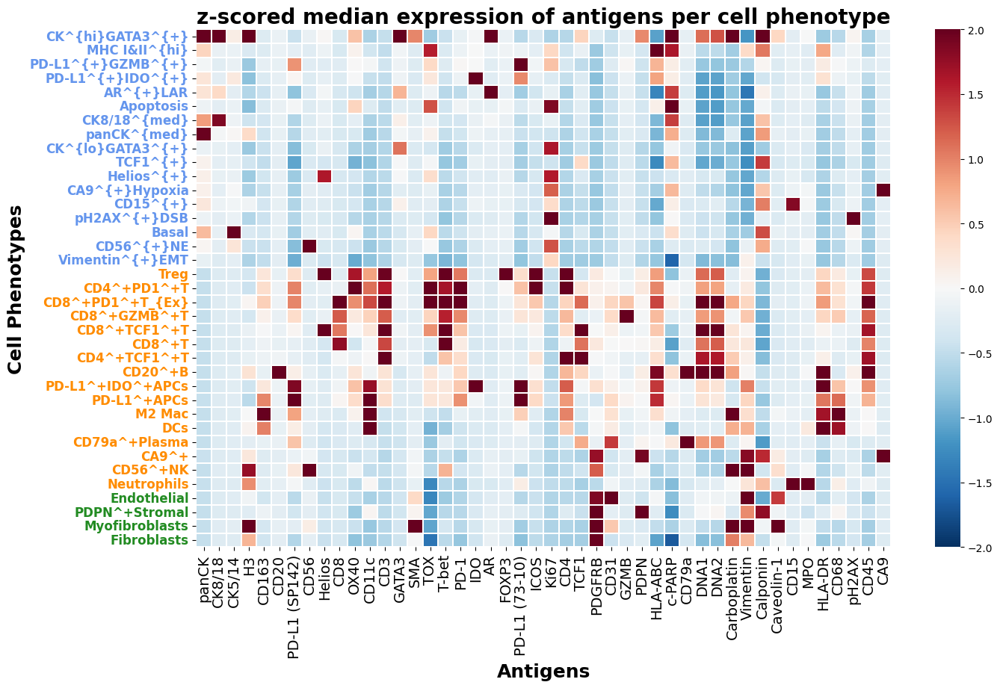

In [103]:
SC_ev_tnbc_raw["cell_type"] = pd.Categorical(
    SC_ev_tnbc_raw["Label"], categories=Cell_types_Wang, ordered=True
)
expression_per_phenoptype = SC_ev_tnbc_raw.groupby("cell_type")[
    Protein_list_Wang
].median()
expression_per_phenoptype_scaled = (
    expression_per_phenoptype - expression_per_phenoptype.mean()
) / expression_per_phenoptype.std()


f, ax = plt.subplots(figsize=(15, 9))
sns.heatmap(
    expression_per_phenoptype_scaled,
    ax=ax,
    cmap="RdBu_r",
    center=0,
    vmin=-2,
    vmax=2,
    cbar=True,
    linewidth=0.1,
)
ax.set_xticklabels(Protein_list_Wang, fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, fontweight="bold")
ax.set_xlabel("Antigens", fontsize=18, fontweight="bold")
ax.set_ylabel("Cell Phenotypes", fontsize=18, fontweight="bold")
ax.set_title(
    "z-scored median expression of antigens per cell phenotype",
    fontsize=20,
    fontweight="bold",
)
ytickcolors = ["cornflowerblue"] * 17 + ["darkorange"] * 16 + ["forestgreen"] * 4
for ytick, color in zip(ax.get_yticklabels(), ytickcolors):
    ytick.set_color(color)
f.show()

### Fig.A.2 Distribution of TME pattern expression in each of the seven patient subgroups

In [34]:
Signatures = bigraph_.fitted_soft_wl_subtree.Signatures
# Define tumor niches, immune niches, stromal niches, and interfacing niches
threshold = 0.5  # does not impact the downstream analysis, only imapct the presentation of the signature map
tumor_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 16:] > threshold, axis=1) == 0)
)[0]
immune_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) == 0)
)[0]
stromal_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) > 0)
)[0]
interacting_niche = [
    i
    for i in range(Signatures.shape[0])
    if i not in np.concatenate([tumor_niche, immune_niche, stromal_niche])
]
print("There are {} identified TME patterns.".format(Signatures.shape[0]))
print(
    "There are {} tumor niches, {} immune niches, {} stromal niches, and {} interacting niches.".format(
        len(tumor_niche), len(immune_niche), len(stromal_niche), len(interacting_niche)
    )
)
tme_pattern_orders = np.concatenate(
    [tumor_niche, immune_niche, stromal_niche, interacting_niche]
)

There are 66 identified TME patterns.
There are 37 tumor niches, 4 immune niches, 11 stromal niches, and 14 interacting niches.


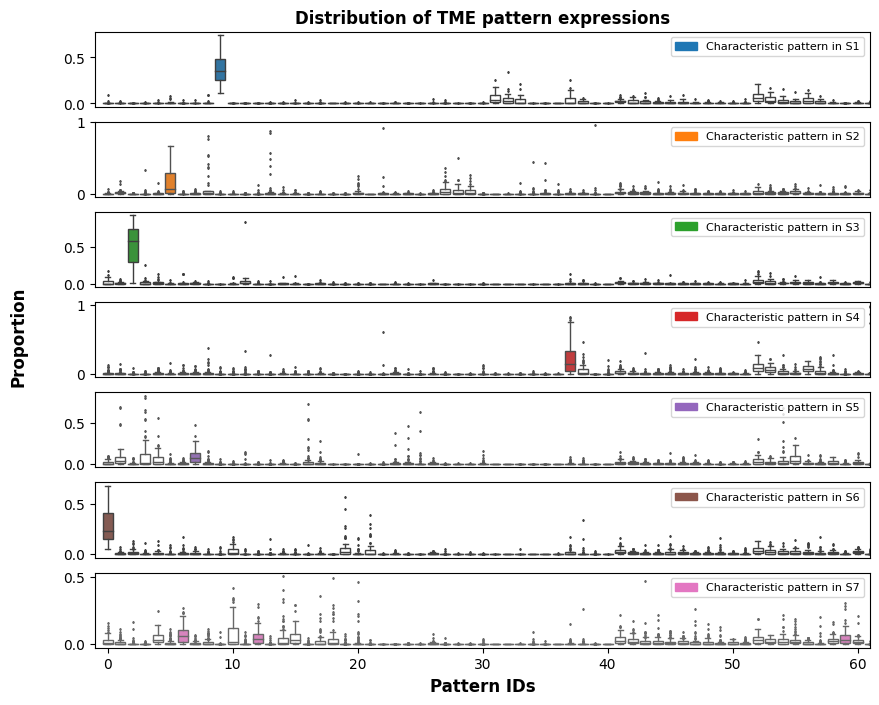

In [35]:
f, ax = plt.subplots(len(patient_subgroups_discovery), 1, figsize=(10, 8), sharex=True)
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    proportions_in_group = patient_subgroups_discovery[i]["proportions_in_group"]
    hodges_lehmanns = patient_subgroups_discovery[i]["hodges_lehmanns"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    DF_proportion = pd.DataFrame(proportions_in_group)
    DF_proportion = DF_proportion.melt(var_name="pattern_id", value_name="proportion")
    DF_proportion["characteristic"] = np.isin(
        DF_proportion["pattern_id"], characteristic_patterns
    )
    sns.boxplot(
        data=DF_proportion,
        x="pattern_id",
        y="proportion",
        ax=ax[i],
        hue="characteristic",
        showfliers=True,
        fliersize=1,
        palette={True: color_palette_Bigraph[subgroup_id], False: "white"},
        dodge=False,
        linewidth=1,
        order=tme_pattern_orders,
    )
    handles = [
        patches.Rectangle(
            (0.4, 0.1),
            1,
            1,
            edgecolor=color_palette_Bigraph[subgroup_id],
            facecolor=color_palette_Bigraph[subgroup_id],
            label="Characteristic pattern in {}".format(subgroup_id),
        ),
    ]
    ax[i].legend(handles=handles, fontsize=8, loc="upper right")
    ax[i].set_ylabel("", fontsize=8)
    ax[i].get_xaxis().set_visible(False)
    ax[i].set(xlim=(-1, 61))

ax[0].set_title(
    "Distribution of TME pattern expressions".format(subgroup_id), fontweight="bold"
)
ax[-1].get_xaxis().set_visible(True)
ax[-1].set(
    xticks=[0, 10, 20, 30, 40, 50, 60],
    xticklabels=[0, 10, 20, 30, 40, 50, 60],
)
ax[-1].set_xlabel("Pattern IDs", fontsize=12, fontweight="bold")
f.text(
    0.04,
    0.5,
    "Proportion",
    va="center",
    rotation="vertical",
    fontweight="bold",
    fontsize=12,
)
plt.show()

### Fig.A.3 Hodge-lehmann statistics of TME pattern expressions in each of the seven patient subgroups

In [36]:
Signatures = bigraph_.fitted_soft_wl_subtree.Signatures
# Define tumor niches, immune niches, stromal niches, and interfacing niches
threshold = 0.5  # does not impact the downstream analysis, only imapct the presentation of the signature map
tumor_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 16:] > threshold, axis=1) == 0)
)[0]
immune_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) == 0)
)[0]
stromal_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) > 0)
)[0]
interacting_niche = [
    i
    for i in range(Signatures.shape[0])
    if i not in np.concatenate([tumor_niche, immune_niche, stromal_niche])
]
print("There are {} identified TME patterns.".format(Signatures.shape[0]))
print(
    "There are {} tumor niches, {} immune niches, {} stromal niches, and {} interacting niches.".format(
        len(tumor_niche), len(immune_niche), len(stromal_niche), len(interacting_niche)
    )
)
tme_pattern_orders = np.concatenate(
    [tumor_niche, immune_niche, stromal_niche, interacting_niche]
)

There are 66 identified TME patterns.
There are 37 tumor niches, 4 immune niches, 11 stromal niches, and 14 interacting niches.


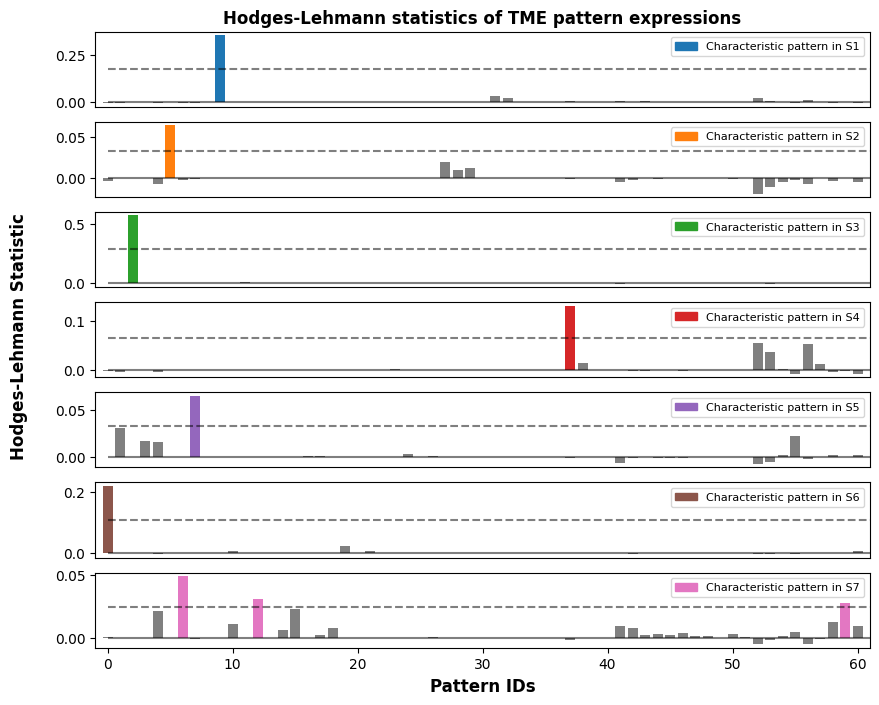

In [37]:
f, ax = plt.subplots(
    len(patient_subgroups_discovery),
    1,
    figsize=(10, 8),
    sharex=True,
)
for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    hodges_lehmanns = patient_subgroups_discovery[i]["hodges_lehmanns"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    ax[i].bar(
        np.arange(len(hodges_lehmanns)),
        np.array(hodges_lehmanns)[tme_pattern_orders],
        color=[
            (
                color_palette_Bigraph[subgroup_id]
                if i in characteristic_patterns
                else "grey"
            )
            for i in tme_pattern_orders
        ],
    )
    handles = [
        patches.Rectangle(
            (0.6, 0.2),
            1,
            1,
            edgecolor=color_palette_Bigraph[subgroup_id],
            facecolor=color_palette_Bigraph[subgroup_id],
            label="Characteristic pattern in {}".format(subgroup_id),
        ),
    ]
    ax[i].legend(handles=handles, fontsize=8, loc="upper right")
    ax[i].set_ylabel("", fontsize=8)
    ax[i].get_xaxis().set_visible(False)
    ax[i].set(xlim=(-1, 61))
    ax[i].hlines(
        0.5 * np.max(hodges_lehmanns),
        0,
        len(hodges_lehmanns),
        color="k",
        linestyle="--",
        alpha=0.5,
    )
    ax[i].hlines(0, 0, len(hodges_lehmanns), color="k", alpha=0.5)


ax[0].set_title(
    "Hodges-Lehmann statistics of TME pattern expressions", fontweight="bold"
)
ax[-1].get_xaxis().set_visible(True)
ax[-1].set_xlabel("Pattern IDs", fontsize=10, fontweight="bold")
ax[-1].set(
    xticks=[0, 10, 20, 30, 40, 50, 60],
    xticklabels=[0, 10, 20, 30, 40, 50, 60],
)
ax[-1].set_xlabel("Pattern IDs", fontsize=12)
f.text(
    0.04,
    0.5,
    "Hodges-Lehmann Statistic",
    va="center",
    rotation="vertical",
    fontweight="bold",
    fontsize=12,
)
plt.show()

In [171]:
survival_d

,Unnamed: 0,patientID,patient_id,Cohort,Overall Survival (Months),Overall Survival Status,Relapse Free Status (Months),Relapse Free Status,Chemotherapy,Radio Therapy,...,time,status,ERStatus,ERBB2_pos,Grade,sizeOrdinal,LymphNodesOrdinal,PAM50,isDiscovery,IntClust
3,3,MB-0006,6,1.0,164.933333,0:LIVING,162.76,0:Not Recurred,YES,YES,...,162.562628,0,pos,False,2.0,20-50mm,2-3,Luminal B,True,IntClust 9
5,5,MB-0010,10,1.0,7.800000,1:DECEASED,2.89,1:Recurred,NO,YES,...,7.687885,1,pos,False,3.0,20-50mm,0,Luminal B,True,IntClust 7
6,6,MB-0014,14,1.0,164.333333,0:LIVING,162.17,0:Not Recurred,YES,YES,...,161.971253,0,pos,False,2.0,5-10mm,1,Luminal B,True,IntClust 3
8,8,MB-0022,22,1.0,99.533333,1:DECEASED,98.22,0:Not Recurred,NO,YES,...,98.102669,0,pos,False,2.0,20-50mm,1,Luminal B,True,IntClust 3
10,10,MB-0028,28,1.0,36.566667,1:DECEASED,36.09,0:Not Recurred,NO,YES,...,36.041068,0,pos,False,3.0,10-20mm,1,Luminal B,True,IntClust 9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2591,2591,MB-3495,3495,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,56.476386,0,pos,NaN,3.0,20-50mm,0,NaN,False,NaN
2593,2593,MB-3560,3560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,132.238193,0,pos,NaN,3.0,20-50mm,1,NaN,False,NaN
2595,2595,MB-3667,3667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,42.546201,1,pos,NaN,2.0,20-50mm,0,NaN,False,NaN
2600,2600,MB-3692,3692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,61.075975,1,pos,NaN,3.0,20-50mm,1,NaN,False,NaN


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HER2+ vs. HR+/HER2-: Mann-Whitney-Wilcoxon test two-sided, P_val:1.463e-08 U_stat=1.501e+03
HR+/HER2- vs. TNBC: Mann-Whitney-Wilcoxon test two-sided, P_val:2.246e-14 U_stat=1.021e+04
HER2+ vs. TNBC: Mann-Whitney-Wilcoxon test two-sided, P_val:2.189e-01 U_stat=9.110e+02


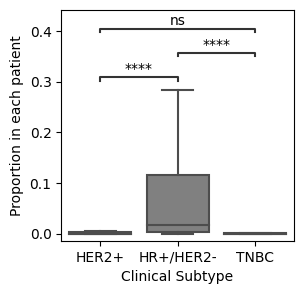

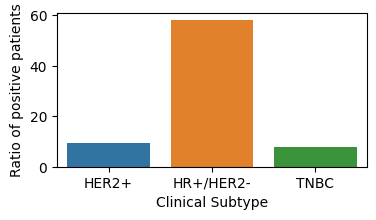

In [180]:
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
patient_ids_discovery = list(SC_d["patientID"].unique())

from itertools import combinations
survival_d['Clinical Subtype'] = clinical_subtypes_discovery
feature_name = "Clinical Subtype"
feature_list = [
    "HER2+",
    "HR+/HER2-",
    "TNBC",
   
]
compare_list = [
    ("HER2+", "HR+/HER2-"),
    ("HER2+", "TNBC"),
    ("HR+/HER2-", "TNBC"),

]

for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if subgroup_id not in ["S7"]:
        continue
    proportion = np.sum(Proportions[:, np.array(characteristic_patterns)], axis=1)
    DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion,
                feature_name: clinical_subtypes_discovery

                
            }
        )
    DF_presentation = DF_presentation.dropna()
    f, ax = plt.subplots(figsize=(3, 3))
    sns.boxplot(
        x=feature_name,
        y="Proportion",
        data=DF_presentation,
        showfliers=False,
        order=feature_list,
        color="grey",
        # order=["HR+/HER2-", "HR+/HER2+", "HR-/HER2+", "TNBC"],
    )
    from statannotations.Annotator import Annotator

    annot = Annotator(
        ax,
        compare_list,
        data=DF_presentation,
        x=feature_name,
        y="Proportion",
        order=feature_list,
    )
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="inside",
        verbose=2,
    )
    annot.apply_test()
    ax, test_results = annot.annotate()

    # ax.set(title = 'Proportion of pattern {} in each grade'.format(pattern_id[0]+1))
    ax.set(ylabel="Proportion in each patient")

    DF_existence = pd.DataFrame(
        {
            feature_name: feature_list,
        }
    )
    for feature in feature_list:
        data = DF_presentation.loc[
            DF_presentation[feature_name] == feature, "Proportion"
        ].values

        exisitence_ratio = np.sum(data > 0.01) / len(data)
        DF_existence.loc[DF_existence[feature_name] == feature, "Existence (%)"] = (
            exisitence_ratio * 100
        )

    f, ax = plt.subplots(figsize=(4, 2))
    sns.barplot(
        x=feature_name,
        y="Existence (%)",
        data=DF_existence,
        order=feature_list,
    )
    ax.set(ylabel="Ratio of positive patients")

### Fig.A.4 Correlation between TME patterns and tumor stage.

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1 vs. 2: Mann-Whitney-Wilcoxon test two-sided, P_val:9.426e-01 U_stat=1.675e+02
2 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:1.587e-01 U_stat=7.000e+01
1 vs. 3: Mann-Whitney-Wilcoxon test two-sided, P_val:2.650e-01 U_stat=2.400e+01


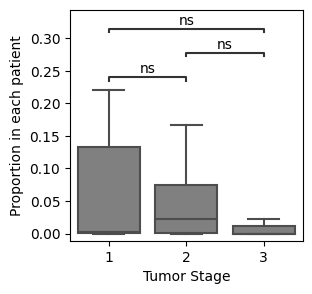

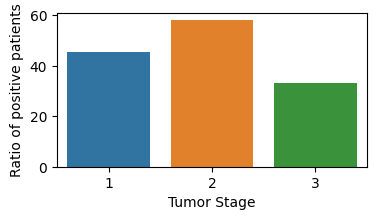

In [169]:
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
patient_ids_discovery = list(SC_d["patientID"].unique())

from itertools import combinations

feature_name = "Tumor Stage"
feature_list = [1, 2, 3, 4]
compare_list = [
    (1, 2),
    (1,3),
    (1,4),
    (3, 4),
    (2, 3),
    (2,4)
]

for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if subgroup_id not in ["S4"]:
        continue
    proportion = np.sum(Proportions[:, np.array(characteristic_patterns)], axis=1)
    if subgroup_id == "S4":
        feature_list = [1, 2, 3]
        compare_list = [
            (1, 2),
            (1, 3),
            # (3, 4),
            (2, 3),
        ]
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion[clinical_subtypes_discovery == "TNBC"],
                feature_name: [
                    survival_d.loc[
                        survival_d["patientID"] == patient_id, feature_name
                    ].values[0]
                    for patient_id in np.array(patient_ids_discovery)[
                        clinical_subtypes_discovery == "TNBC"
                    ]
                ],
            }
        )
    else:
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion,
                feature_name: [
                    survival_d.loc[
                        survival_d["patientID"] == patient_id, feature_name
                    ].values[0]
                    for patient_id in patient_ids_discovery
                ],
            }
        )
    DF_presentation = DF_presentation.dropna()
    f, ax = plt.subplots(figsize=(3, 3))
    sns.boxplot(
        x=feature_name,
        y="Proportion",
        data=DF_presentation,
        showfliers=False,
        order=feature_list,
        color="grey",
        # order=["HR+/HER2-", "HR+/HER2+", "HR-/HER2+", "TNBC"],
    )
    from statannotations.Annotator import Annotator

    annot = Annotator(
        ax,
        compare_list,
        data=DF_presentation,
        x=feature_name,
        y="Proportion",
        order=feature_list,
    )
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="inside",
        verbose=2,
    )
    annot.apply_test()
    ax, test_results = annot.annotate()

    # ax.set(title = 'Proportion of pattern {} in each grade'.format(pattern_id[0]+1))
    ax.set(ylabel="Proportion in each patient")

    DF_existence = pd.DataFrame(
        {
            feature_name: feature_list,
        }
    )
    for feature in feature_list:
        data = DF_presentation.loc[
            DF_presentation[feature_name] == feature, "Proportion"
        ].values

        exisitence_ratio = np.sum(data > 0.01) / len(data)
        DF_existence.loc[DF_existence[feature_name] == feature, "Existence (%)"] = (
            exisitence_ratio * 100
        )

    f, ax = plt.subplots(figsize=(4, 2))
    sns.barplot(
        x=feature_name,
        y="Existence (%)",
        data=DF_existence,
        order=feature_list,
    )
    ax.set(ylabel="Ratio of positive patients")

### Fig.A.5 Correlation between TME patterns and Metastasis

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Yes vs. No: Mann-Whitney-Wilcoxon test two-sided, P_val:6.716e-01 U_stat=3.300e+02


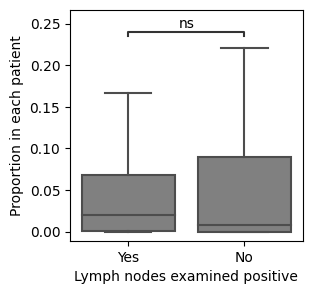

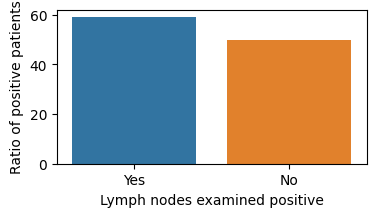

In [177]:
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
patient_ids_discovery = list(SC_d["patientID"].unique())

from itertools import combinations

feature_name = "Lymph nodes examined positive"
feature_list = ["Yes", "No"]
compare_list = [("Yes", "No")]

for i in range(len(patient_subgroups_discovery)):
    subgroup_id = patient_subgroups_discovery[i]["subgroup_id"]
    characteristic_patterns = patient_subgroups_discovery[i]["characteristic_patterns"]
    if subgroup_id not in ["S4"]:
        continue
    proportion = np.sum(Proportions[:, np.array(characteristic_patterns)], axis=1)
    if subgroup_id == "S4":
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion[clinical_subtypes_discovery == "TNBC"],
                feature_name: [
                    (
                        "Yes"
                        if survival_d.loc[
                            survival_d["patientID"] == patient_id, feature_name
                        ].values[0]
                        > 0
                        else "No"
                    )
                    for patient_id in np.array(patient_ids_discovery)[
                        clinical_subtypes_discovery == "TNBC"
                    ]
                ],
            }
        )
    else:
        DF_presentation = pd.DataFrame(
            {
                "Proportion": proportion,
                feature_name: [
                    (
                        "Yes"
                        if survival_d.loc[
                            survival_d["patientID"] == patient_id, feature_name
                        ].values[0]
                        > 0
                        else "No"
                    )
                    for patient_id in patient_ids_discovery
                ],
            }
        )
    DF_presentation = DF_presentation.dropna()
    f, ax = plt.subplots(figsize=(3, 3))
    sns.boxplot(
        x=feature_name,
        y="Proportion",
        data=DF_presentation,
        showfliers=False,
        order=feature_list,
        color="grey",
        # order=["HR+/HER2-", "HR+/HER2+", "HR-/HER2+", "TNBC"],
    )
    from statannotations.Annotator import Annotator

    annot = Annotator(
        ax,
        compare_list,
        data=DF_presentation,
        x=feature_name,
        y="Proportion",
        order=feature_list,
    )
    annot.configure(
        test="Mann-Whitney",
        text_format="star",
        loc="inside",
        verbose=2,
    )
    annot.apply_test()
    ax, test_results = annot.annotate()

    # ax.set(title = 'Proportion of pattern {} in each grade'.format(pattern_id[0]+1))
    ax.set(ylabel="Proportion in each patient")

    DF_existence = pd.DataFrame(
        {
            feature_name: feature_list,
        }
    )
    for feature in feature_list:
        data = DF_presentation.loc[
            DF_presentation[feature_name] == feature, "Proportion"
        ].values

        exisitence_ratio = np.sum(data > 0.01) / len(data)
        DF_existence.loc[DF_existence[feature_name] == feature, "Existence (%)"] = (
            exisitence_ratio * 100
        )

    f, ax = plt.subplots(figsize=(4, 2))
    sns.barplot(
        x=feature_name,
        y="Existence (%)",
        data=DF_existence,
        order=feature_list,
    )
    ax.set(ylabel="Ratio of positive patients")

### Fig.A.6 Alignment of cell phenotypes

#### Jackson et al.

In [11]:
Label_Query = SC_ev["celltypeID_original"].values
Label_Query_alignment = SC_ev["celltypeID"].values
Matching_heatmap = np.zeros(
    (len(np.unique(Label_Query)), len(np.unique(Label_Query_alignment)))
)
for i in range(len(Cell_types_displayed_Jackson)):
    for j in range(len(Cell_types_displayed_Danenberg)):
        id_i = get_node_id("Jackson", "CellType")[Cell_types_displayed_Jackson[i]]
        id_j = j
        a = list(np.where(Label_Query == id_i)[0])
        b = list(np.where(Label_Query_alignment == id_j)[0])
        IoU = len(set(a).intersection(set(b))) / len(set(a).union(set(b)))
        Matching_heatmap[i, j] = IoU

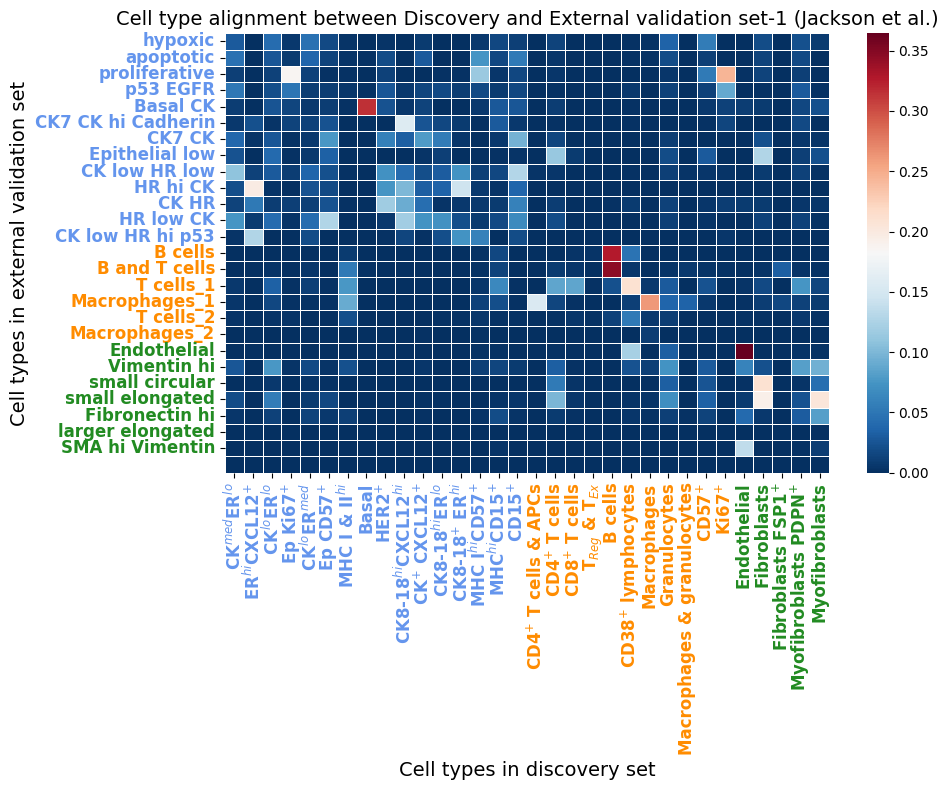

In [12]:
Cell_types_original = list(
    map(
        reverse_dict(get_node_id("Jackson", "CellType")).get,
        range(np.unique(Label_Query).shape[0]),
    )
)
Cell_types_aligned = list(
    map(
        reverse_dict(get_node_id("Danenberg", "CellType")).get,
        range(np.unique(Label_Query_alignment).shape[0]),
    )
)
f, ax = plt.subplots(figsize=(10, 8), tight_layout=True)
sns.heatmap(
    Matching_heatmap,
    ax=ax,
    xticklabels=Cell_types_displayed_Danenberg,
    yticklabels=Cell_types_displayed_Jackson,
    cmap="RdBu_r",
    vmin=0,
    # vmax=0.3,
    linewidths=0.5,
)
ax.set_ylabel("Cell types in external validation set", fontsize=14)
ax.set_xlabel("Cell types in discovery set", fontsize=14)
ax.set_title(
    "Cell type alignment between Discovery and External validation set-1 (Jackson et al.)", fontsize=14
)
ax.set_yticklabels(Cell_types_displayed_Jackson, fontsize=12, fontweight="bold")
ytickcolors = ["cornflowerblue"] * 13 + ["darkorange"] * 6 + ["forestgreen"] * 7
for ytick, color in zip(ax.get_yticklabels(), ytickcolors):
    ytick.set_color(color)
ax.set_xticklabels(Cell_types_displayed_Danenberg, fontsize=12, fontweight="bold")
xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["forestgreen"] * 5
for xtick, color in zip(ax.get_xticklabels(), xtickcolors):
    xtick.set_color(color)

plt.show()

#### Wang et al

In [25]:
Cell_types_Wang = [
    "CK^{hi}GATA3^{+}",
    "MHC I&II^{hi}",
    "PD-L1^{+}GZMB^{+}",
    "PD-L1^{+}IDO^{+}",
    "AR^{+}LAR",
    "Apoptosis",
    "CK8/18^{med}",
    "panCK^{med}",
    "CK^{lo}GATA3^{+}",
    "TCF1^{+}",
    "Helios^{+}",
    "CA9^{+}Hypoxia",
    "CD15^{+}",
    "pH2AX^{+}DSB",
    "Basal",
    "CD56^{+}NE",
    "Vimentin^{+}EMT",
    "Treg",
    "CD4^+PD1^+T",
    "CD8^+PD1^+T_{Ex}",
    "CD8^+GZMB^+T",
    "CD8^+TCF1^+T",
    "CD8^+T",
    "CD4^+TCF1^+T",
    "CD20^+B",
    "PD-L1^+IDO^+APCs",
    "PD-L1^+APCs",
    "M2 Mac",
    "DCs",
    "CD79a^+Plasma",
    "CA9^+",
    "CD56^+NK",
    "Neutrophils",
    "Endothelial",
    "PDPN^+Stromal",
    "Myofibroblasts",
    "Fibroblasts",
]

Label_Query = SC_ev_tnbc_baseline["celltypeID_original"].values
Label_Query_alignment = SC_ev_tnbc_baseline["celltypeID"].values
Matching_heatmap = np.zeros(
    (len(np.unique(Label_Query)), len(np.unique(Label_Query_alignment)))
)
for i in range(len(Cell_types_Wang)):
    for j in range(len(Cell_types_displayed_Danenberg)):
        id_i = get_node_id("Wang", "CellType")[Cell_types_Wang[i]]
        id_j = j
        a = list(np.where(Label_Query == id_i)[0])
        b = list(np.where(Label_Query_alignment == id_j)[0])
        IoU = len(set(a).intersection(set(b))) / len(set(a).union(set(b)))
        Matching_heatmap[i, j] = IoU

In [26]:
Matching_heatmap

array([[0.00000000e+00, 8.85896527e-04, 0.00000000e+00, ...,
        1.39207907e-04, 8.03793907e-05, 7.81432077e-04],
       [7.29303315e-02, 4.46175063e-03, 4.01580375e-02, ...,
        3.18314669e-04, 7.03627591e-03, 3.75875067e-03],
       [3.82007233e-02, 1.95731784e-03, 2.46423090e-02, ...,
        4.96277916e-03, 2.09638311e-03, 3.09643510e-03],
       ...,
       [6.93277572e-03, 3.50656827e-03, 3.00072101e-02, ...,
        9.36914428e-03, 6.46682823e-02, 1.57369665e-01],
       [1.67482327e-03, 4.60788658e-03, 4.67429817e-03, ...,
        2.94455258e-03, 9.49774099e-03, 2.90438533e-02],
       [1.11370161e-02, 1.04305997e-03, 3.22296940e-02, ...,
        5.61375816e-03, 2.34852903e-02, 2.11928286e-01]])

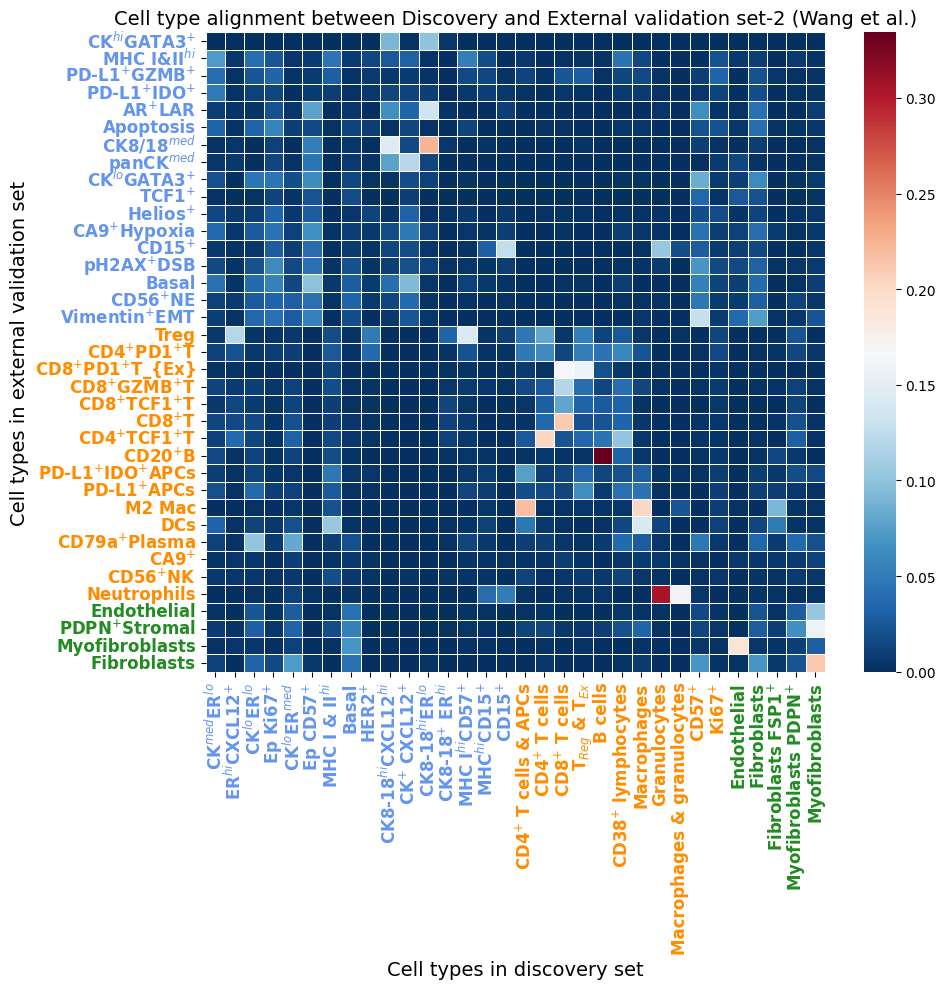

In [28]:

Cell_types_original = list(
    map(
        reverse_dict(get_node_id("Wang", "CellType")).get,
        range(np.unique(Label_Query).shape[0]),
    )
)
Cell_types_aligned = list(
    map(
        reverse_dict(get_node_id("Danenberg", "CellType")).get,
        range(np.unique(Label_Query_alignment).shape[0]),
    )
)
f, ax = plt.subplots(figsize=(10, 10), tight_layout=True)
sns.heatmap(
    Matching_heatmap,
    ax=ax,
    xticklabels=Cell_types_displayed_Danenberg,
    yticklabels=Cell_types_displayed_Wang,
    cmap="RdBu_r",
    vmin=0,
    # vmax=0.3,
    linewidths=0.5,
)
ax.set_ylabel("Cell types in external validation set", fontsize=14)
ax.set_xlabel("Cell types in discovery set", fontsize=14)
ax.set_title(
    "Cell type alignment between Discovery and External validation set-2 (Wang et al.)", fontsize=14
)
ax.set_yticklabels(Cell_types_displayed_Wang, fontsize=12, fontweight="bold")
ytickcolors = ["cornflowerblue"] * 17 + ["darkorange"] * 16 + ["forestgreen"] * 4
for ytick, color in zip(ax.get_yticklabels(), ytickcolors):
    ytick.set_color(color)
ax.set_xticklabels(Cell_types_displayed_Danenberg, fontsize=12, fontweight="bold")
xtickcolors = ["cornflowerblue"] * 16 + ["darkorange"] * 11 + ["forestgreen"] * 5
for xtick, color in zip(ax.get_xticklabels(), xtickcolors):
    xtick.set_color(color)

plt.show()

### Fig.A.7 Characterize patients with the abundance of four categories

There are 66 identified TME patterns.
There are 37 tumor niches, 4 immune niches, 11 stromal niches, and 14 interacting niches.


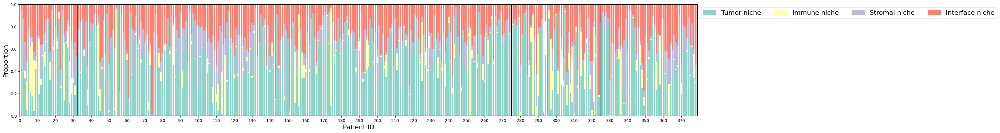

In [11]:
Signatures = bigraph_.fitted_soft_wl_subtree.Signatures
Histograms = bigraph_.fitted_soft_wl_subtree.Histograms
Proportions = Histograms / np.sum(Histograms, axis=1, keepdims=True)
# Proportion of each pattern presented in each patient's cellular graphs
DF_proportion = pd.DataFrame(Proportions)
DF_proportion = DF_proportion.melt(var_name="pattern_id", value_name="proportion")
DF_proportion["pattern_id"] = DF_proportion["pattern_id"].astype(str)
# Define tumor niches, immune niches, stromal niches, and interfacing niches
threshold = 0.5  # does not impact the downstream analysis, only imapct the presentation of the signature map
tumor_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 16:] > threshold, axis=1) == 0)
)[0]
immune_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) > 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) == 0)
)[0]
stromal_niche = np.where(
    (np.sum(Signatures[:, :16] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 16:27] > threshold, axis=1) == 0)
    & (np.sum(Signatures[:, 27:] > threshold, axis=1) > 0)
)[0]
interacting_niche = [
    i
    for i in range(Signatures.shape[0])
    if i not in np.concatenate([tumor_niche, immune_niche, stromal_niche])
]
print("There are {} identified TME patterns.".format(Signatures.shape[0]))
print(
    "There are {} tumor niches, {} immune niches, {} stromal niches, and {} interacting niches.".format(
        len(tumor_niche), len(immune_niche), len(stromal_niche), len(interacting_niche)
    )
)
tme_pattern_orders = np.concatenate(
    [tumor_niche, immune_niche, stromal_niche, interacting_niche]
)

Histograms_category = []
for i in range(len(Histograms)):
    Histograms_category.append(
        np.array([
            np.sum(Histograms[i][tumor_niche]),
            np.sum(Histograms[i][immune_niche]),
            np.sum(Histograms[i][stromal_niche]),
            np.sum(Histograms[i][ interacting_niche]),
        ])
    )
patient_ids_discovery = list(SC_d["patientID"].unique())
clinical_subtypes_discovery = np.zeros(len(patient_ids_discovery), dtype=object)
clinical_subtypes_discovery[:] = "Unknown"
for i in range(len(patient_ids_discovery)):
    patient_id = patient_ids_discovery[i]
    er = survival_d.loc[survival_d["patientID"] == patient_id, "ER Status"].values[0]
    pr = survival_d.loc[survival_d["patientID"] == patient_id, "PR Status"].values[0]
    her2 = survival_d.loc[survival_d["patientID"] == patient_id, "HER2 Status"].values[
        0
    ]
    if her2 == "Positive":
        clinical_subtypes_discovery[i] = "HER2+"  # Her2+
    if (er == "Positive" or pr == "Positive") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "HR+/HER2-"  # HR+/HER2-
    elif (er == "Negative" and pr == "Negative") and her2 == "Negative":
        clinical_subtypes_discovery[i] = "TNBC"  # TNBC
# check the proportion of each category in each patient
DF_proportion_category = pd.DataFrame(
    {
        "Tumor niche": np.sum(Proportions[:, tumor_niche], axis=1),
        "Immune niche": np.sum(Proportions[:, immune_niche], axis=1),
        "Stromal niche": np.sum(Proportions[:, stromal_niche], axis=1),
        "Interface niche": np.sum(Proportions[:, interacting_niche], axis=1),
        "Clinical Subtype": clinical_subtypes_discovery,
    }
)
DF_proportion_category = DF_proportion_category.sort_values(
    by="Clinical Subtype", 
    key=lambda x: x.map(
        {
            "HER2+": 0,
            "HR+/HER2-": 1,
            "TNBC": 2,
            "Unknown": 3,
        }
    ),


).reset_index(drop=True)
n_Her2 = np.sum(clinical_subtypes_discovery == "HER2+")
n_HR_Her2 = np.sum(clinical_subtypes_discovery == "HR+/HER2-")
n_TNBC = np.sum(clinical_subtypes_discovery == "TNBC")
n_Unknown = np.sum(clinical_subtypes_discovery == "Unknown")
# stacked bar plot
f, ax = plt.subplots(figsize=(30, 5))

# add bounding box for Her2+, HR+/Her2-, TNBC, and Unknown

ax.bar(
    DF_proportion_category.index,
    DF_proportion_category["Tumor niche"],
    color=sns.color_palette("Set3")[0],
    label="Tumor niche",
)
ax.bar(
    DF_proportion_category.index,
    DF_proportion_category["Immune niche"],
    bottom=DF_proportion_category["Tumor niche"],
    color=sns.color_palette("Set3")[1],
    label="Immune niche",
)
ax.bar(
    DF_proportion_category.index,
    DF_proportion_category["Stromal niche"],
    bottom=DF_proportion_category["Immune niche"]
    + DF_proportion_category["Tumor niche"],
    color=sns.color_palette("Set3")[2],
    label="Stromal niche",
)
ax.bar(
    DF_proportion_category.index,
    DF_proportion_category["Interface niche"],
    bottom=DF_proportion_category["Tumor niche"]
    + DF_proportion_category["Immune niche"]
    + DF_proportion_category["Stromal niche"],
    color=sns.color_palette("Set3")[3],
    label="Interface niche",
)
ax.add_patch(
    patches.Rectangle(
        (0, 0),
        n_Her2,
        1,
        edgecolor="black",
        facecolor="none",
        linewidth=2,
      
    )
)
ax.add_patch(
     patches.Rectangle(
        (n_Her2, 0),
        n_HR_Her2,
        1,
        edgecolor="black",
        facecolor="none",
        linewidth=2,
      
    )
)   
ax.add_patch(
     patches.Rectangle(
        (n_Her2+ n_HR_Her2, 0),
        n_TNBC,
        1,
        edgecolor="black",
        facecolor="none",
        linewidth=2,
    )
)   
ax.set_xticks(range(0, len(DF_proportion_category.index), 10))
ax.set(xlim=(0, len(DF_proportion_category.index)), ylim=(0, 1))
ax.set_xlabel("Patient ID", fontsize=16)
ax.set_ylabel("Proportion", fontsize=16)
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), fontsize=16, ncols = 4)
plt.show()

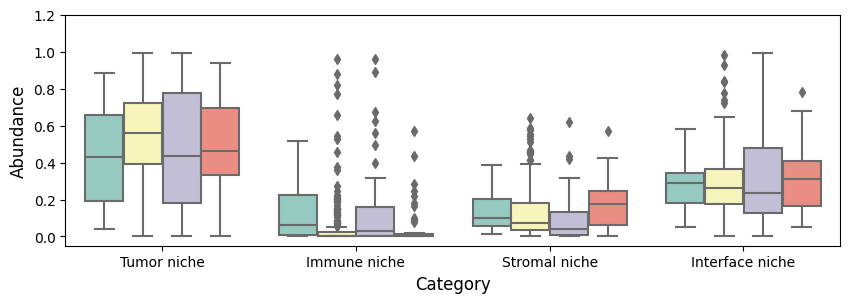

Mean and standard deviation of the proportion of each category in each patient
Tumor niche        0.511238
Immune niche       0.070210
Stromal niche      0.132864
Interface niche    0.285689
dtype: float64
Tumor niche        0.253878
Immune niche       0.158765
Stromal niche      0.132078
Interface niche    0.169615
dtype: float64


In [12]:
DF_proportion_category = pd.DataFrame(
    {
        "Tumor niche": np.sum(Proportions[:, tumor_niche], axis=1),
        "Immune niche": np.sum(Proportions[:, immune_niche], axis=1),
        "Stromal niche": np.sum(Proportions[:, stromal_niche], axis=1),
        "Interface niche": np.sum(Proportions[:, interacting_niche], axis=1),
    }
)
DF_proportion_category_ = DF_proportion_category.melt(value_name="Proportion")
DF_proportion_category_["Clinical Subtype"] = (
    clinical_subtypes_discovery.tolist()
    + clinical_subtypes_discovery.tolist()
    + clinical_subtypes_discovery.tolist()
    + clinical_subtypes_discovery.tolist()
)
# DF_proportion_category = DF_proportion_category[DF_proportion_category['Clinical Subtype']!='Unknown']
DF_proportion_category_ = DF_proportion_category_.sort_values(
    by="Clinical Subtype", 
    key=lambda x: x.map(
        {
            "HER2+": 0,
            "HR+/HER2-": 1,
            "TNBC": 2,
            "Unknown": 3,
        }
    ),
).reset_index(drop=True)
f, ax = plt.subplots(figsize=(10, 3))
sns.boxplot(
    data=DF_proportion_category_,
    x="variable",
    order = ['Tumor niche', 'Immune niche', 'Stromal niche', 'Interface niche'],
    y="Proportion",
    hue="Clinical Subtype",
    palette=sns.color_palette("Set3"),
    ax=ax,
)
ax.set_xlabel("Category", fontsize=12)
ax.set_ylabel("Abundance", fontsize=12)
ax.set(ylim = (-0.05, 1.2))
# not show legend
ax.legend().set_visible(False)
plt.show()
# print mean and standard deviation of the proportion of each category in each patient
print("Mean and standard deviation of the proportion of each category in each patient")
print(DF_proportion_category.mean())
print(DF_proportion_category.std())

In [13]:
print(
    "{}, {:.0f}% patients have all three nichees.".format(
         (
            (DF_proportion_category["Tumor niche"] > 0)
            * (DF_proportion_category["Immune niche"] > 0)
            * (DF_proportion_category["Stromal niche"] > 0)
            * (DF_proportion_category["Interface niche"] > 0)
        ).sum(),
        (
            
            (DF_proportion_category["Tumor niche"] > 0)
            * (DF_proportion_category["Immune niche"] > 0)
            * (DF_proportion_category["Stromal niche"] > 0)
            * (DF_proportion_category["Interface niche"] > 0)
        ).sum()
        / len(DF_proportion_category)
        * 100
    )
)
print(
    "{}, {:.0f}% patients have tumor niche.".format(
        (DF_proportion_category["Tumor niche"] > 0).sum(),
        (DF_proportion_category["Tumor niche"] > 0).sum()
        / len(DF_proportion_category)
        * 100
    )
)
print(
    "{}, {:.0f}% patients do not have immune niche.".format(
        (DF_proportion_category["Immune niche"] > 0).sum(),
        (DF_proportion_category["Immune niche"] > 0).sum()
        / len(DF_proportion_category)
        * 100
    )
)
print(
    "{}, {:.0f}% patients have stromal niche.".format(
         (DF_proportion_category["Stromal niche"] > 0).sum(),
         (DF_proportion_category["Stromal niche"] > 0).sum()
        / len(DF_proportion_category)
        * 100
    )
)
print(
    "{}, {:.0f}% patients have interfacing niche.".format(
         (DF_proportion_category["Interface niche"] > 0).sum(),
        (DF_proportion_category["Interface niche"] > 0).sum()
        / len(DF_proportion_category)
        * 100
    )
)

283, 75% patients have all three nichees.
371, 98% patients have tumor niche.
293, 77% patients do not have immune niche.
376, 99% patients have stromal niche.
379, 100% patients have interfacing niche.


In [14]:
print("Start generating population graph.")
import sys
sys.path.append("./..")
from population_graph import Population_Graph
import numpy as np
from bi_graph import BiGraph
from sklearn.metrics.pairwise import cosine_similarity
population_graph_ = Population_Graph(
    k_clustering=30,
    resolution=1,
    size_smallest_cluster=10,
    seed=0,
)  # initialize Population_Graph class with parameters k, resolution, size_smallest_cluster, and seed
Proportions_category = DF_proportion_category.values
Similarity_matrix = cosine_similarity(Proportions_category)  # calculate similarity matrix
Patient_ids = bigraph_.Patient_ids  # get patient ids
patient_ids_discovery = patient_ids_discovery = list(SC_d["patientID"].unique())
Population_graph = population_graph_.generate(
    Similarity_matrix, Patient_ids
)  # generate population graph
print("Population graph generated.")
print("Start detecting patient subgroups.")
patient_subgroups_discovery_c = population_graph_.community_detection(
    Population_graph
)  # detect patient subgroups
print("Patient subgroups detected.")
bigraph_category = BiGraph(k_patient_clustering=30)
explainer_ = Explainer(
            threshold_hodges_lehmann=0.5
        )  # initialize Explainer class
patient_subgroups_discovery_c = explainer_.find_characteristic_patterns(
            Patient_ids, patient_subgroups_discovery_c, Histograms_category
        )

patient_subgroups_discovery_c = bigraph_category.analyze_survival(
    patient_subgroups_discovery_c, survival_d, patient_ids_discovery
)
patient_subgroups_discovery_c = sorted(
    patient_subgroups_discovery_c, key=lambda x: x["hr"], reverse=True
)
print("Patient subgroups sorted by hazard ratio.")  # Assign subgroup id
for i in range(len(patient_subgroups_discovery_c)):
    patient_subgroups_discovery_c[i]["subgroup_id"] = "S" + str(i + 1)


patient_ids_discovery_c = Patient_ids
subgroup_ids_discovery_c = np.zeros(len(patient_ids_discovery), dtype=object)
subgroup_ids_discovery_c[:] = "Unclassified"
for i in range(len(patient_subgroups_discovery_c)):
    subgroup = patient_subgroups_discovery_c[i]
    subgroup_id = subgroup["subgroup_id"]
    patient_ids = subgroup["patient_ids"]
    subgroup_ids_discovery_c[np.isin(patient_ids_discovery, patient_ids)] = subgroup_id
Num_patients_in_subgroups = [
    len(subgroup["patient_ids"]) for subgroup in patient_subgroups_discovery_c
]
print(
    "There are {} patient subgroups, {} ungrouped patients".format(
        len(patient_subgroups_discovery_c),
        len(patient_ids_discovery_c) - sum(Num_patients_in_subgroups),
    )
)

Start generating population graph.


Population graph generated.
Start detecting patient subgroups.
Patient subgroups detected.
Patient subgroups sorted by hazard ratio.
There are 6 patient subgroups, 0 ungrouped patients


[[Text(-0.8, 0, ''),
  Text(-0.6000000000000001, 0, ''),
  Text(-0.4, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, ''),
  Text(1.0, 0, '')],
 [Text(-1.0, 0, ''),
  Text(-0.8, 0, ''),
  Text(-0.6, 0, ''),
  Text(-0.3999999999999999, 0, ''),
  Text(-0.19999999999999996, 0, ''),
  Text(0.0, 0, ''),
  Text(0.20000000000000018, 0, ''),
  Text(0.40000000000000013, 0, ''),
  Text(0.6000000000000001, 0, ''),
  Text(0.8, 0, '')],
 [Text(-0.6000000000000001, 0, ''),
  Text(-0.4000000000000001, 0, ''),
  Text(-0.20000000000000007, 0, ''),
  Text(0.0, 0, ''),
  Text(0.19999999999999996, 0, ''),
  Text(0.3999999999999999, 0, ''),
  Text(0.6000000000000001, 0, '')]]

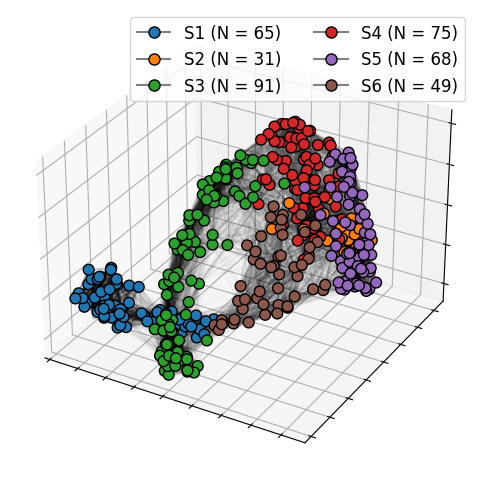

In [19]:
# For visualization purpose, we make nodes distant from each other
population_graph_for_visualization = Population_Graph(k_clustering=20).generate(
    Similarity_matrix, patient_ids_discovery_c
)  # generate population graph
pos = nx.spring_layout(
    population_graph_for_visualization,
    seed=3,
    k=1 / (np.sqrt(397)) * 10,
    iterations=100,
    dim=3,
)
fig = plt.figure(figsize=(5, 5), tight_layout=True)
ax = fig.add_subplot(111, projection="3d")
node_xyz = np.array([pos[v] for v in sorted(population_graph_for_visualization)])
edge_xyz = np.array(
    [(pos[u], pos[v]) for u, v in population_graph_for_visualization.edges()]
)
ax.scatter(
    *node_xyz.T,
    s=60,
    c=[color_palette_Bigraph[i] for i in subgroup_ids_discovery_c],
    edgecolors="black",
    linewidths=1,
    alpha=1
)
edge_list = list(population_graph_for_visualization.edges())
edge_alpha = [
    (
        0.2 * population_graph_for_visualization[u][v]["weight"]
        if population_graph_for_visualization[u][v]["weight"] > 0.1
        else 0
    )
    for u, v in edge_list
]
for i in range(len(edge_list)):
    u, v = edge_list[i]
    ax.plot(*edge_xyz[i].T, alpha=edge_alpha[i], color="k")

ax.set(
    xlim=(np.min(node_xyz[:, 0]), np.max(node_xyz[:, 0])),
    ylim=(np.min(node_xyz[:, 1]), np.max(node_xyz[:, 1])),
    zlim=(np.min(node_xyz[:, 2]), np.max(node_xyz[:, 2])),
)
handles = []
if np.sum(subgroup_ids_discovery_c == "Unclassified") > 0:
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="white",
            markerfacecolor="white",
            label="Unclassified (N = {})".format(
                np.sum(subgroup_ids_discovery_c == "Unclassified")
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )
for subgroup in patient_subgroups_discovery_c:
    subgroup_id = subgroup["subgroup_id"]
    handles.append(
        Line2D(
            [0],
            [0],
            marker="o",
            color="grey",
            markerfacecolor=color_palette_Bigraph[subgroup_id],
            label="{} (N = {})".format(
                subgroup_id, np.sum(subgroup_ids_discovery_c == subgroup_id)
            ),
            markeredgecolor="black",
            markeredgewidth=1,
            markersize=8,
        )
    )

ax.legend(handles=handles, fontsize=12, ncols=2)
ax.set(yticklabels=[], xticklabels=[], zticklabels=[])

Patient subgroup S1: N = 65, HR = 1.47 (0.95-2.26), p = 8.14e-02
Patient subgroup S2: N = 31, HR = 1.36 (0.77-2.42), p = 2.93e-01
Patient subgroup S3: N = 91, HR = 1.16 (0.78-1.73), p = 4.59e-01
Patient subgroup S4: N = 75, HR = 0.86 (0.55-1.35), p = 5.22e-01
Patient subgroup S5: N = 68, HR = 0.80 (0.50-1.28), p = 3.54e-01
Patient subgroup S6: N = 49, HR = 0.59 (0.32-1.09), p = 9.29e-02


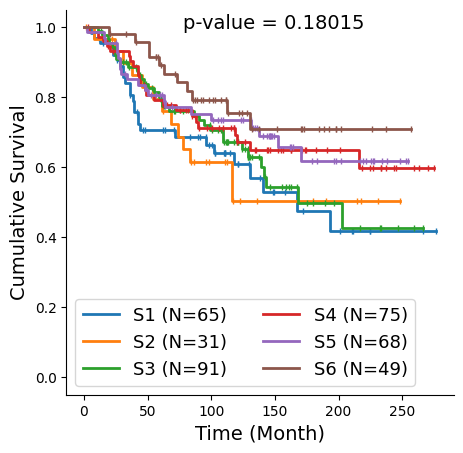

In [15]:
for i in range(len(patient_subgroups_discovery_c)):
    print(
        "Patient subgroup {}: N = {}, HR = {:.2f} ({:.2f}-{:.2f}), p = {:.2e}".format(
            patient_subgroups_discovery_c[i]["subgroup_id"],
            len(patient_subgroups_discovery_c[i]["patient_ids"]),
            patient_subgroups_discovery_c[i]["hr"],
            patient_subgroups_discovery_c[i]["hr_lower"],
            patient_subgroups_discovery_c[i]["hr_upper"],
            patient_subgroups_discovery_c[i]["p"],
        )
    )

lengths_discovery = [
    survival_d.loc[survival_d["patientID"] == i, "time"].values[0]
    for i in patient_ids_discovery
]
statuses_discovery = [
    (survival_d.loc[survival_d["patientID"] == i, "status"].values[0])
    for i in patient_ids_discovery
]
kmf = KaplanMeierFitter()
f, ax = plt.subplots(figsize=(5, 5))
for subgroup in patient_subgroups_discovery_c:
    subgroup_id = subgroup["subgroup_id"]
    length_A, event_observed_A = (
        np.array(lengths_discovery)[subgroup_ids_discovery_c == subgroup_id],
        np.array(statuses_discovery)[subgroup_ids_discovery_c == subgroup_id],
    )
    label = "{} (N={})".format(
        subgroup["subgroup_id"], np.sum(subgroup_ids_discovery_c == subgroup_id)
    )
    kmf.fit(length_A, event_observed_A, label=label)
    kmf.plot_survival_function(
        ax=ax,
        ci_show=False,
        color=color_palette_Bigraph[subgroup_id],
        show_censors=True,
        linewidth=2,
        censor_styles={"ms": 5, "marker": "|"},
    )
log_rank_test = multivariate_logrank_test(
    np.array(lengths_discovery)[subgroup_ids_discovery_c != 0],
    np.array(subgroup_ids_discovery_c)[subgroup_ids_discovery_c != 0],
    np.array(statuses_discovery)[subgroup_ids_discovery_c != 0],
)
p_value = log_rank_test.p_value
ax.legend(ncol=2, fontsize=13)
ax.text(
    x=0.3,
    y=0.95,
    s="p-value = {:.5f}".format(p_value),
    fontsize=14,
    transform=ax.transAxes,
)
ax.set_xlabel("Time (Month)", fontsize=14)
ax.set_ylabel("Cumulative Survival", fontsize=14)
ax.set(
    ylim=(-0.05, 1.05),
)
sns.despine()

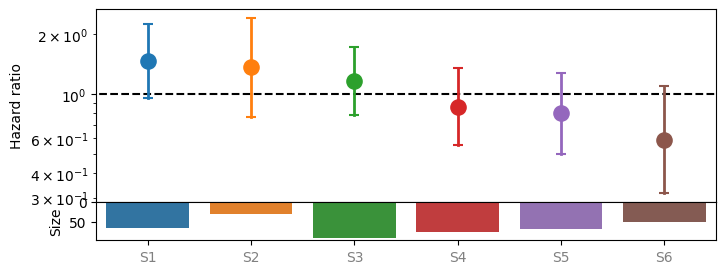

In [16]:
# Plot hazard ratio
f, ax = plt.subplots(2, 1, height_ratios=[5, 1], figsize=(8, 3), sharex=True)
f.subplots_adjust(hspace=0)
ax[0].hlines(1, -1, len(patient_subgroups_discovery_c), color="k", linestyle="--")
N, xticklabels, xtickcolors = [], [], []
for i in range(len(patient_subgroups_discovery_c)):
    subgroup = patient_subgroups_discovery_c[i]
    subgroup_id = subgroup["subgroup_id"]
    hr, hr_lb, hr_ub, p = (
        subgroup["hr"],
        subgroup["hr_lower"],
        subgroup["hr_upper"],
        subgroup["p"],
    )
    ax[0].plot(
        [i, i], [hr_lb, hr_ub], color=color_palette_Bigraph[subgroup_id], linewidth=2
    )
    ax[0].scatter([i], [hr], color=color_palette_Bigraph[subgroup_id], s=120)
    ax[0].scatter(
        [i], [hr_lb], color=color_palette_Bigraph[subgroup_id], s=60, marker="_"
    )
    ax[0].scatter(
        [i], [hr_ub], color=color_palette_Bigraph[subgroup_id], s=60, marker="_"
    )
    N.append(np.sum(subgroup_ids_discovery_c == subgroup_id))
    xticklabels.append("{}".format(subgroup_id))
    if p < 0.05:
        xtickcolors.append("k")
    else:
        xtickcolors.append("grey")
ax[0].set_xticks(range(len(patient_subgroups_discovery_c)))
ax[0].set_xticklabels(xticklabels)
for xtick, color in zip(ax[1].get_xticklabels(), xtickcolors):
    xtick.set_color(color)
ax[0].set_xlabel("Patient Subgroups")
ax[0].set_ylabel("Hazard ratio")
ax[0].set_yscale("log")
DF = pd.DataFrame({"N": N, "subgroup_id": xticklabels})
g = sns.barplot(
    data=DF, x="subgroup_id", y="N", palette=color_palette_Bigraph, ax=ax[1]
)
g.invert_yaxis()
ax[1].set_ylabel("Size")
ax[1].set_xlabel("")
plt.show()

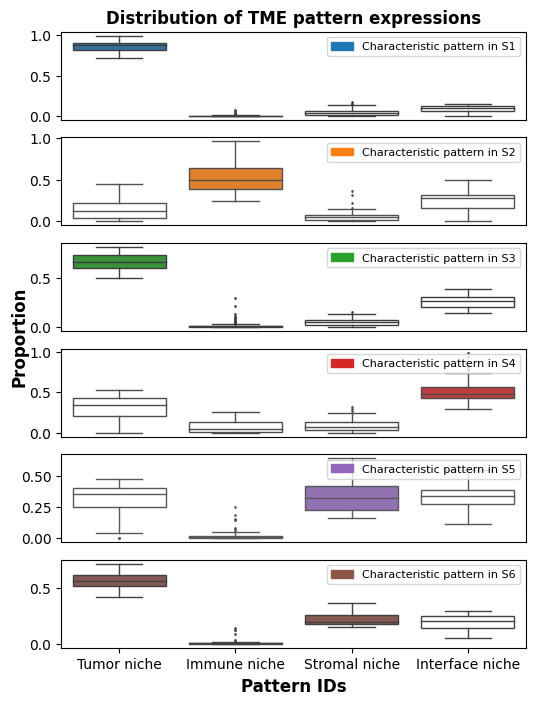

In [46]:
f, ax = plt.subplots(len(patient_subgroups_discovery_c), 1, figsize=(6, 8), sharex=True)
for i in range(len(patient_subgroups_discovery_c)):
    subgroup_id = patient_subgroups_discovery_c[i]["subgroup_id"]
    proportions_in_group = patient_subgroups_discovery_c[i]["proportions_in_group"]
    hodges_lehmanns = patient_subgroups_discovery_c[i]["hodges_lehmanns"]
    characteristic_patterns = patient_subgroups_discovery_c[i]["characteristic_patterns"]
    DF_proportion = pd.DataFrame(proportions_in_group)
    DF_proportion = DF_proportion.melt(var_name="pattern_id", value_name="proportion")
    DF_proportion["characteristic"] = np.isin(
        DF_proportion["pattern_id"], characteristic_patterns
    )
    sns.boxplot(
        data=DF_proportion,
        x="pattern_id",
        y="proportion",
        ax=ax[i],
        hue="characteristic",
        showfliers=True,
        fliersize=1,
        palette={True: color_palette_Bigraph[subgroup_id], False: "white"},
        dodge=False,
        linewidth=1,
        # order=tme_pattern_orders,
    )
    handles = [
        patches.Rectangle(
            (0.4, 0.1),
            1,
            1,
            edgecolor=color_palette_Bigraph[subgroup_id],
            facecolor=color_palette_Bigraph[subgroup_id],
            label="Characteristic pattern in {}".format(subgroup_id),
        ),
    ]
    ax[i].legend(handles=handles, fontsize=8, loc="upper right")
    ax[i].set_ylabel("", fontsize=8)
    ax[i].get_xaxis().set_visible(False)
    # ax[i].set(xlim=(-1, 61))

ax[0].set_title(
    "Distribution of TME pattern expressions".format(subgroup_id), fontweight="bold"
)
ax[-1].get_xaxis().set_visible(True)
ax[-1].set(
    xticks=[0,1,2,3],
    xticklabels=['Tumor niche', 'Immune niche', 'Stromal niche', 'Interface niche'],
)
ax[-1].set_xlabel("Pattern IDs", fontsize=12, fontweight="bold")
f.text(
    0.04,
    0.5,
    "Proportion",
    va="center",
    rotation="vertical",
    fontweight="bold",
    fontsize=12,
)
plt.show()